<a href="https://colab.research.google.com/github/quanndm/kltn/blob/dev/notebooks/phase1/tumor_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Init - import library - download data

In [1]:
!rm -rf kltn
!rm -rf sample_data
!git clone -b dev https://github.com/quanndm/kltn.git

Cloning into 'kltn'...
remote: Enumerating objects: 3004, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (110/110), done.
remote: Total 3004 (delta 77), reused 56 (delta 26), pack-reused 2868 (from 2)
Receiving objects: 100% (3004/3004), 70.31 MiB | 15.52 MiB/s, done.
Resolving deltas: 100% (2067/2067), done.


In [2]:
from kltn.init.install_dependencies import install_packages, load_config
install_packages("./kltn")
config = load_config("./kltn/parameters.yaml")

In [3]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from google.colab import drive
import json
import gc

from kltn import *
from kltn.datasets.get_datasets import get_datasets_lits, convert_to_2D_dataset_v1, get_datasets_2d_v1, get_liver_mask_bbox_v1
from kltn.utils.logger import init_logger
from kltn.utils.train_val_epochs import  trainer_stage2
from kltn.utils.metrics import  DiceMetric, TverskyLossWSigmoid, DiceLossWSigmoid
from kltn.models.model_factory import ModelFactory
from kltn.utils.visualize_results import visualize_results_stage_2

In [4]:
drive.flush_and_unmount()
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [5]:
LOGGER = init_logger(config["log_path"])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [16]:
from kltn.datasets.prepare_data import prepare_dataset_LiTS
prepare_dataset_LiTS(dir_name=config["source_folder_lits"])

0.00% complete (down: 0.0 kB/s up: 0.0 kB/s peers: 1) downloading LITS17 (https://academictorrents.com/announce.php)[127.0.0.1:6881] v1 skipping tracker announce (unreachable) "" (1)
LITS17 (https://academictorrents.com/announce.php)[172.28.0.12:6881] v1 unspecified system error "" (1)
LITS17 (https://ipv6.academictorrents.com/announce.php)[127.0.0.1:6881] v1 skipping tracker announce (unreachable) "" (1)
LITS17 (https://ipv6.academictorrents.com/announce.php)[172.28.0.12:6881] v1 unspecified system error "" (1)
0.00% complete (down: 0.2 kB/s up: 0.1 kB/s peers: 3) downloading LITS17 (udp://tracker.opentrackr.org:1337/announce)[127.0.0.1:6881] v1 skipping tracker announce (unreachable) "" (1)
0.75% complete (down: 10278.1 kB/s up: 311.4 kB/s peers: 9) downloading LITS17 (https://academictorrents.com/announce.php)[127.0.0.1:6881] v1 skipping tracker announce (unreachable) "" (2)
LITS17 (https://ipv6.academictorrents.com/announce.php)[127.0.0.1:6881] v1 skipping tracker announce (unreach

## Model

In [6]:
weight_path = "/content/gdrive/MyDrive/KLTN/code/weight/best_metric_model_UNet3DWResNeXtCoT_liver.pth"
model_stage_1 = ModelFactory.get_model("unet3d_resnextcot",in_channels=1, n_classes=1, n_channels=16).to(device)
model_stage_1.load_state_dict(torch.load(weight_path, map_location=device))

<All keys matched successfully>

In [7]:
model = ModelFactory.get_model("unet2d_resnextcot_mcb",in_channels=3, n_classes=1, n_channels=32).to(device)

## Prepare Dataset 2.5D

In [8]:
liver_masks_bbox = get_liver_mask_bbox_v1(source=config["source_folder_lits"], model_stage_1=model_stage_1, device=device)

In [9]:
import json
path_save_result = f"/content/gdrive/MyDrive/KLTN/bbox.json"


patient_ids, bboxs = liver_masks_bbox
results = [
    {
        "patient_id": int(pid),
        "bbox": [int(x) for x in bbox]
    }
    for pid, bbox in zip(patient_ids, bboxs)
]
with open(path_save_result, "w") as f:
    json.dump(results, f, indent=4)

In [10]:
import json

path_save_result = f"/content/gdrive/MyDrive/KLTN/bbox.json"
def load_json(json_path):
    with open(json_path, 'r') as f:
        return json.load(f)

liver_masks_bbox = load_json(path_save_result)


In [11]:
convert_to_2D_dataset_v1(source=config["source_folder_lits"], bbox=liver_masks_bbox, slides=3, save_dir=config["path_save_dataset_2D"]) # 3 slide of 3d and stride 2

Patient 38 processed.
Patient 72 processed.
Patient 113 processed.
Patient 99 processed.
Patient 36 processed.
Patient 74 processed.
Patient 2 processed.
Patient 62 processed.
Patient 19 processed.
Patient 96 processed.
Patient 111 processed.
Patient 8 processed.
Patient 73 processed.
Patient 15 processed.
Patient 124 processed.
Patient 51 processed.
Patient 75 processed.
Patient 58 processed.
Patient 85 processed.
Patient 120 processed.
Patient 102 processed.
Patient 47 processed.
Patient 50 processed.
Patient 86 processed.
Patient 97 processed.
Patient 106 processed.
Patient 71 processed.
Patient 60 processed.
Patient 33 processed.
Patient 67 processed.
Patient 108 processed.
Patient 101 processed.
Patient 22 processed.
Patient 24 processed.
Patient 14 processed.
Patient 82 processed.
Patient 5 processed.
Patient 94 processed.
Patient 110 processed.
Patient 20 processed.
Patient 66 processed.
Patient 64 processed.
Patient 65 processed.
Patient 76 processed.
Patient 63 processed.
Pati

In [12]:
!rm -rf /content/gdrive/MyDrive/KLTN/2D_dataset.tar.gz

In [13]:
!tar -zcvf 2D_dataset.tar.gz -C ./2D_dataset .

Streaming output truncated to the last 5000 lines.
./patient_116_slice_283.npz
./patient_83_slice_031.npz
./patient_84_slice_039.npz
./patient_16_slice_273.npz
./patient_99_slice_021.npz
./patient_2_slice_509.npz
./patient_102_slice_597.npz
./patient_113_slice_795.npz
./patient_115_slice_163.npz
./patient_19_slice_431.npz
./patient_108_slice_115.npz
./patient_120_slice_147.npz
./patient_102_slice_329.npz
./patient_116_slice_499.npz
./patient_87_slice_137.npz
./patient_12_slice_207.npz
./patient_14_slice_299.npz
./patient_99_slice_001.npz
./patient_2_slice_137.npz
./patient_6_slice_361.npz
./patient_110_slice_073.npz
./patient_116_slice_613.npz
./patient_84_slice_561.npz
./patient_90_slice_573.npz
./patient_26_slice_603.npz
./patient_98_slice_051.npz
./patient_106_slice_211.npz
./patient_103_slice_375.npz
./patient_25_slice_561.npz
./patient_126_slice_343.npz
./patient_103_slice_165.npz
./patient_80_slice_113.npz
./patient_46_slice_083.npz
./patient_96_slice_189.npz
./patient_75_slice_0

In [14]:
!mv 2D_dataset.tar.gz /content/gdrive/MyDrive/KLTN

In [7]:
!cp /content/gdrive/MyDrive/KLTN/2D_dataset.tar.gz ./2D_dataset.tar.gz

In [8]:
!mkdir -p 2D_dataset
!tar -xzf 2D_dataset.tar.gz -C 2D_dataset

## Load data

In [15]:
# full_train_dataset, val_dataset = get_datasets_lits(source_folder=config["source_folder_lits"], seed=123, fold_number=3, mode="tumor", device=device, liver_masks_bbox=liver_masks_bbox)
full_train_dataset, val_dataset = get_datasets_2d_v1(source_folder=config["path_save_dataset_2D"], seed=123, fold_number=2)
print(len(full_train_dataset), len(val_dataset))

23380 5845


In [16]:
train_loader = torch.utils.data.DataLoader(full_train_dataset, batch_size=4, shuffle=True,
                                           num_workers=1, pin_memory=True, drop_last=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False,
                                         pin_memory=True, num_workers=2, prefetch_factor=4)

## Statistic Sample of Datasets

In [ ]:
def count_nonzero_masks(data_loader):
    total_samples = 0
    liver_count = 0
    tumor_count = 0

    liver_list = []  # lưu True/False theo từng mẫu
    tumor_list = []

    for batch in data_loader:
        images = batch["image"]           # [B, C, H, W]
        segs = batch["label"]             # [B, 1, H, W]
        liver_masks = batch["liver_mask"] # [B, 1, H, W]

        B = images.shape[0]
        total_samples += B

        for i in range(B):
            has_liver = liver_masks[i].sum().item() > 0
            has_tumor = segs[i].sum().item() > 0

            liver_list.append(has_liver)
            tumor_list.append(has_tumor)

            if has_liver:
                liver_count += 1
            if has_tumor:
                tumor_count += 1

    liver_percent = liver_count / total_samples * 100
    tumor_percent = tumor_count / total_samples * 100

    print(f"Tổng số mẫu: {total_samples}")
    print(f"Số mẫu có liver mask: {liver_count} ({liver_percent:.2f}%)")
    print(f"Số mẫu có tumor mask: {tumor_count} ({tumor_percent:.2f}%)")

    return {
        "total": total_samples,
        "liver_count": liver_count,
        "tumor_count": tumor_count,
        "liver_percent": liver_percent,
        "tumor_percent": tumor_percent,
    }

In [ ]:
train_stats = count_nonzero_masks(train_loader)

Tổng số mẫu: 23380
Số mẫu có liver mask: 7806 (33.39%)
Số mẫu có tumor mask: 3068 (13.12%)


In [ ]:
train_stats

{'total': 23380,
 'liver_count': 7806,
 'tumor_count': 3068,
 'liver_percent': 33.387510692899916,
 'tumor_percent': 13.122326775021387}

In [ ]:
val_stats = count_nonzero_masks(val_loader)

Tổng số mẫu: 5845
Số mẫu có liver mask: 1892 (32.37%)
Số mẫu có tumor mask: 738 (12.63%)


In [ ]:
val_stats

{'total': 5845,
 'liver_count': 1892,
 'tumor_count': 738,
 'liver_percent': 32.369546621043625,
 'tumor_percent': 12.62617621899059}

## Visualize

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import torch
import random

def visualize_from_loader(image_tensor, label_tensor, liver_mask):
    """
    Hiển thị 3 ảnh: Volume, Liver Mask, và Liver Mask + Segmentation

    Args:
        image_tensor: Tensor, shape [1, 3, H, W]
        label_tensor: Tensor, shape [ 1, 1, H, W]
        liver_mask: Tensor, shape [1, 1, H, W]
    Notes:
        - Chuyển đổi sang numpy
        - Hiển thị 3 ảnh: volume, liver mask, và liver mask + segmentation
    """

    batch_size = image_tensor.shape[0]
    index = random.randint(0, batch_size - 1)

    # Chuyển đổi sang numpy, nén tensor về dạng [D, H, W]
    image = image_tensor[index].detach().cpu().numpy().squeeze() # shape [3, H, W]
    label = label_tensor[index].detach().cpu().numpy().squeeze() # shape [ H, W]
    liver_mask = liver_mask[index].detach().cpu().numpy().squeeze() # shape [ H, W]


    image_center = image[1]

    # Bảng màu cho mask khối u
    cmap1 = mcolors.ListedColormap(["black", "red"])
    cmap2 = mcolors.ListedColormap(["black", "yellow"])

    overlay = np.zeros((*image_center.shape, 4))  # RGBA (H, W, 4)
    overlay[liver_mask == 1] = (1.0, 1.0, 0.0, 0.6)  # Yellow
    overlay[label == 1] = (1.0, 0.0, 0.0, 0.8)       # Red (overwrite if overlapped)

    # Vẽ hình
    plt.figure(figsize=(18, 9))

    # Ảnh đầu tiên: Volume (Ảnh gốc)
    plt.subplot(1, 2, 1)
    plt.title("Volume (slice center of 2.5D)")
    plt.imshow(image_center, cmap='gray')
    plt.axis("off")

    # Ảnh thứ ba: Liver Mask + Segmentation
    plt.subplot(1, 2, 2)
    plt.title("Mask + Volume")
    plt.imshow(image_center, cmap='gray')
    # plt.imshow(liver_mask, cmap=cmap2, alpha=0.7)
    # plt.imshow(label, cmap=cmap1, alpha=0.8)
    plt.imshow(overlay)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

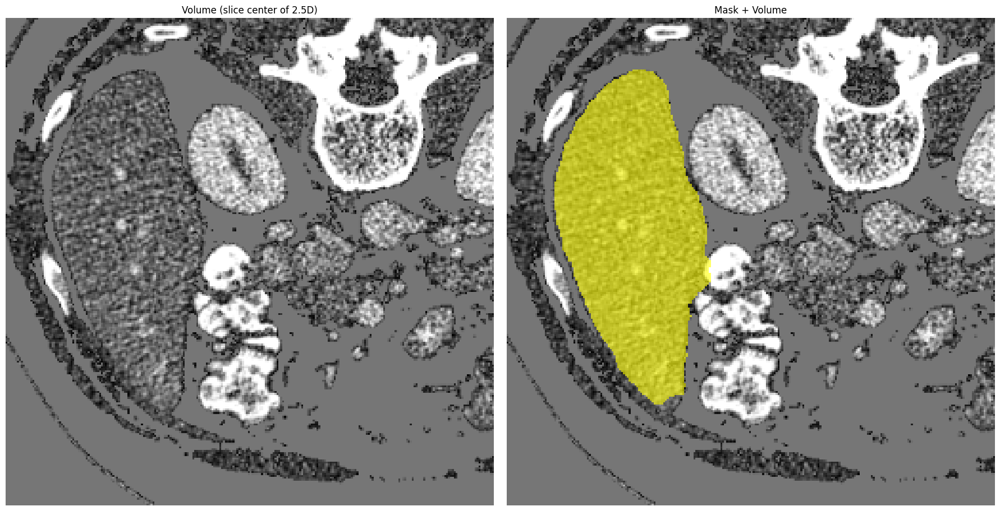

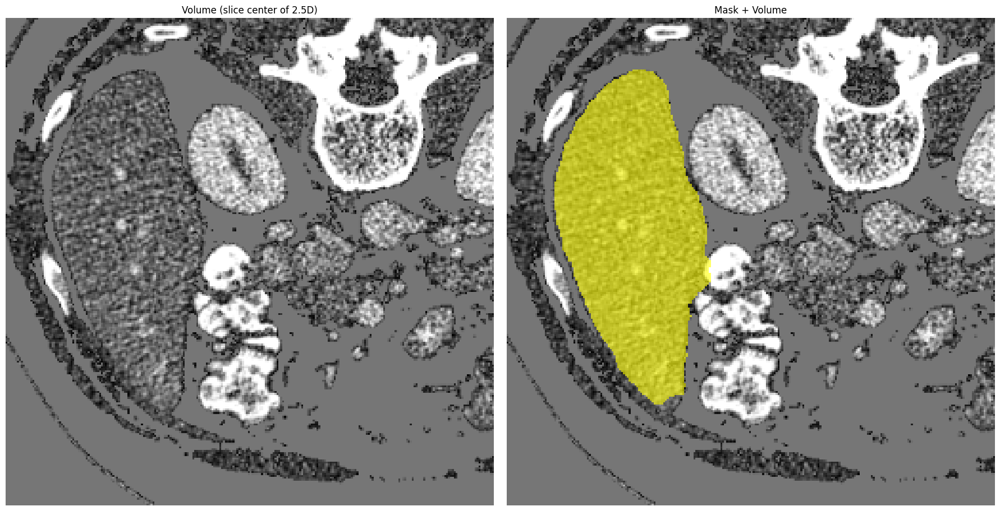

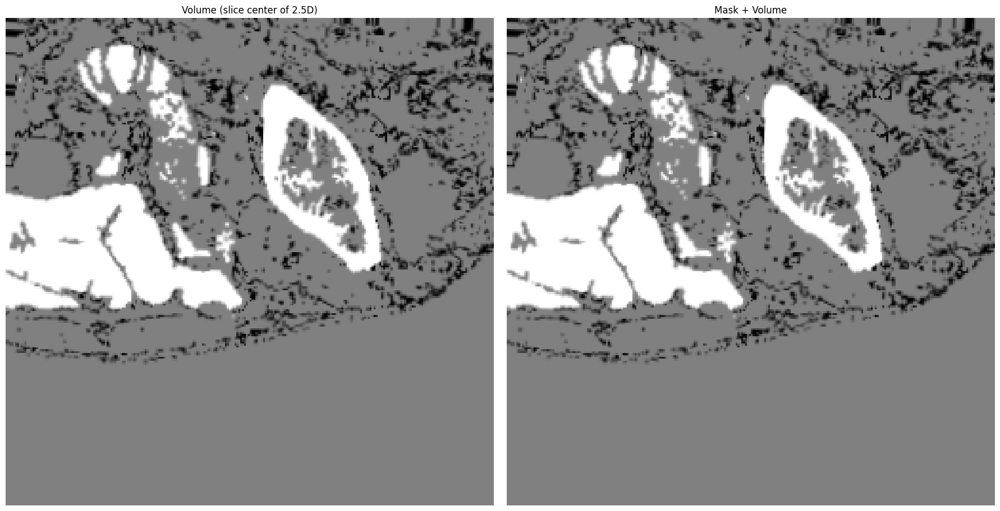

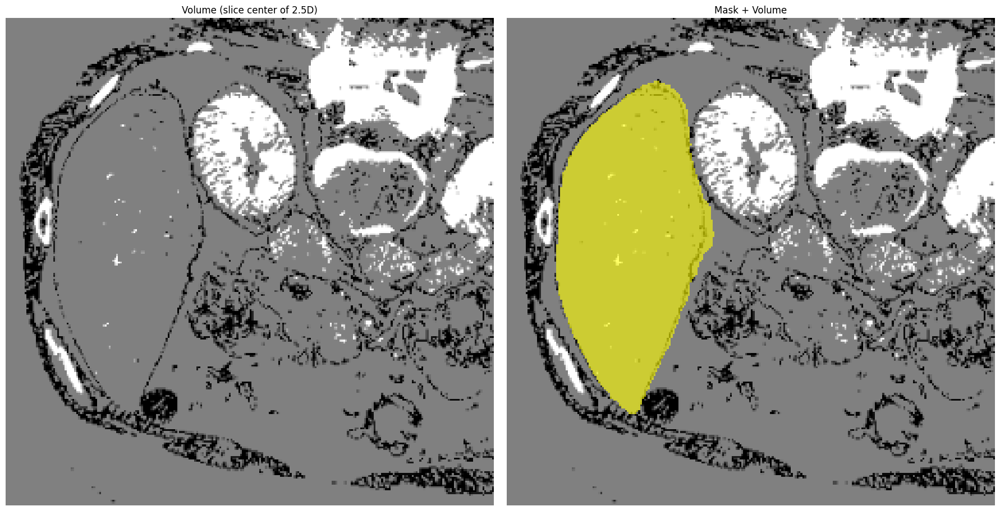

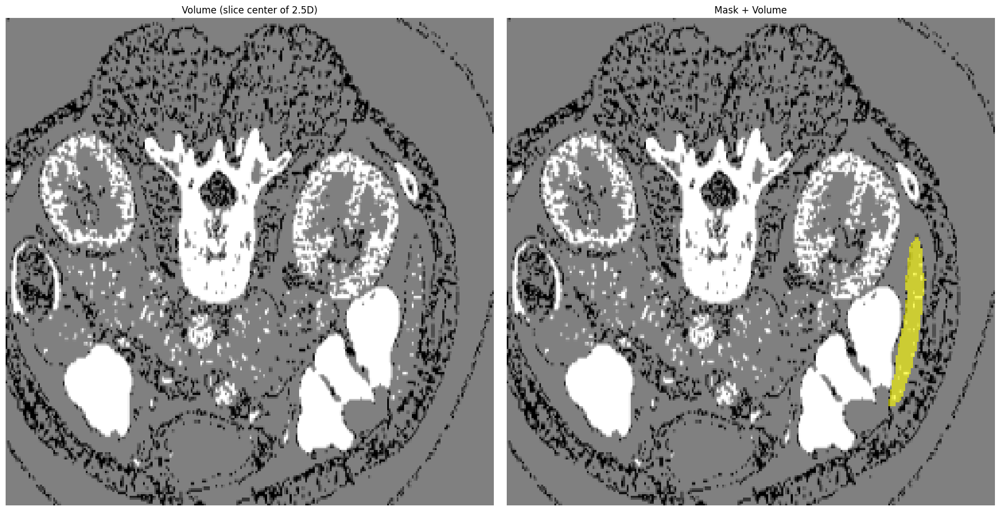

...

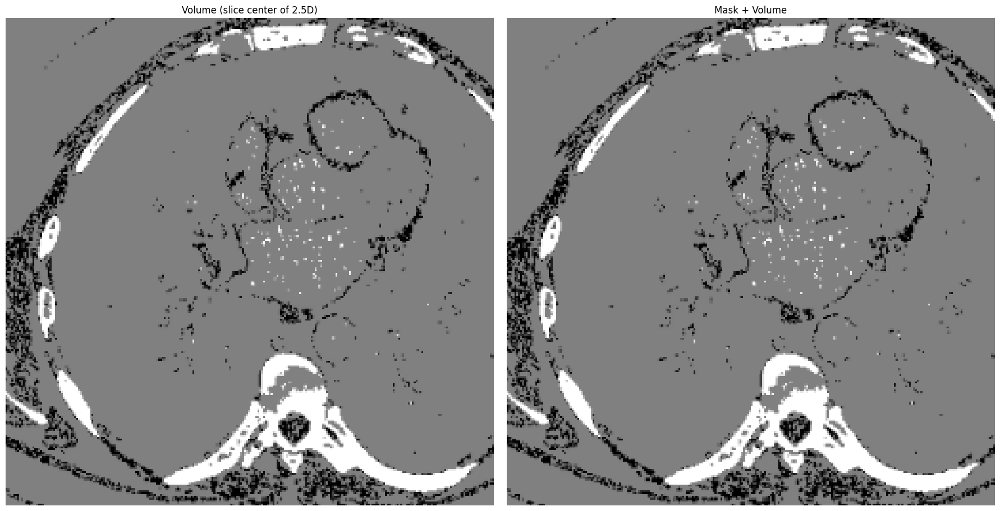

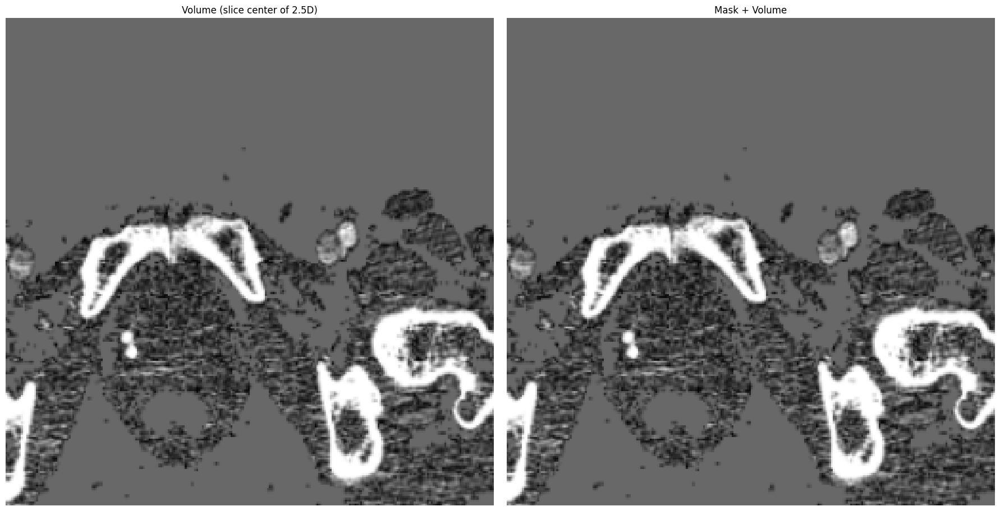

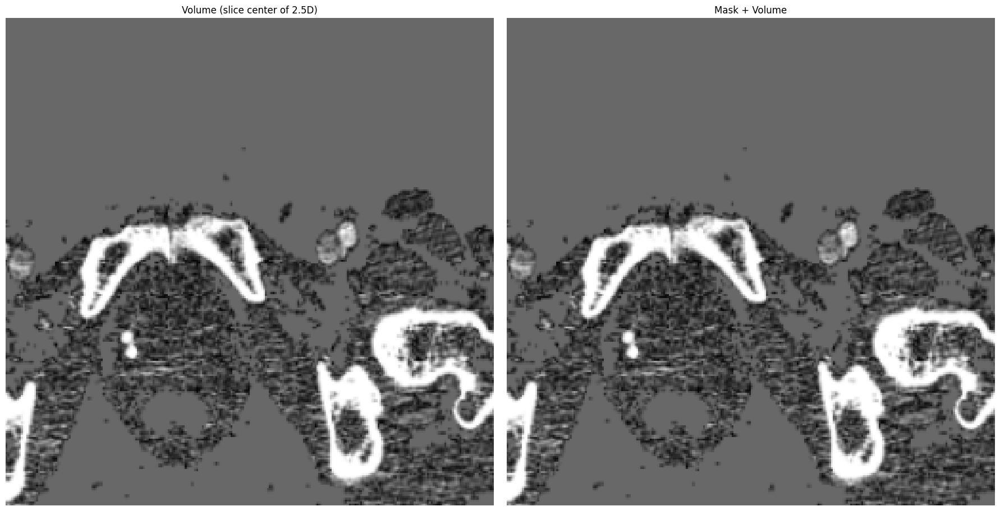

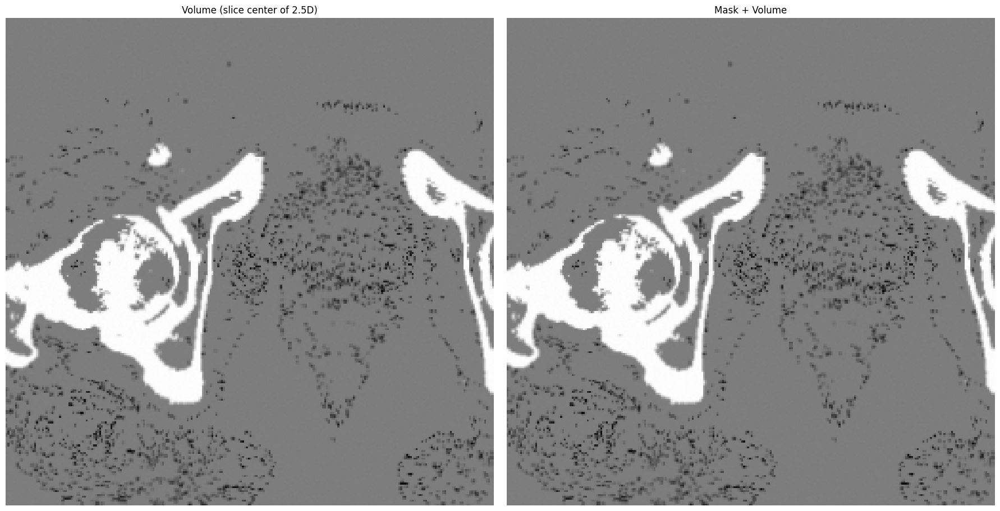

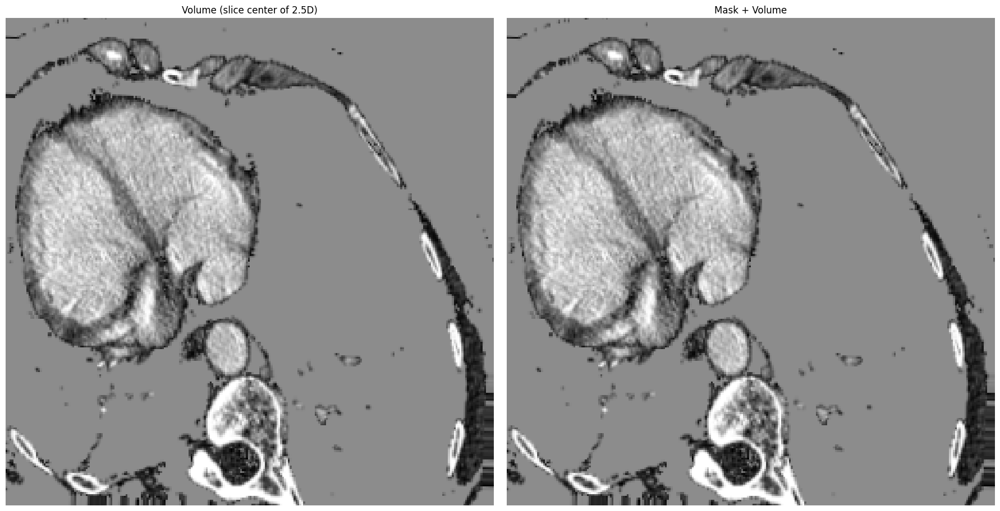

In [18]:
i = 0
for train_data in train_loader:
    image = train_data["image"]
    label = train_data["label"]
    liver_mask = train_data["liver_mask"]
    visualize_from_loader(image, label, liver_mask)
    # i += 1
    # if i == 10:
    #   break

    if np.any(label.cpu().numpy().squeeze() > 0):
      i += 1
      visualize_from_loader(image, label, liver_mask)

      if i == 10:
        break
    else:
      continue



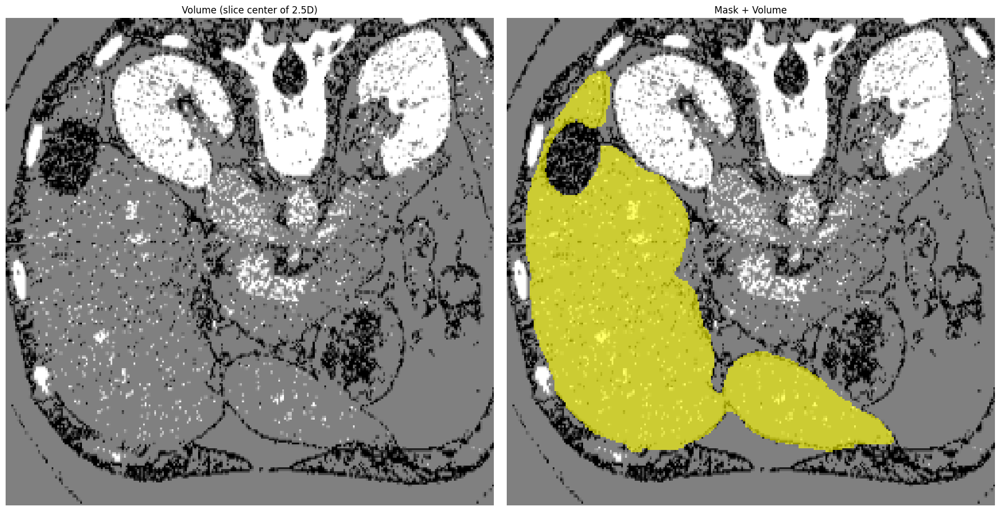

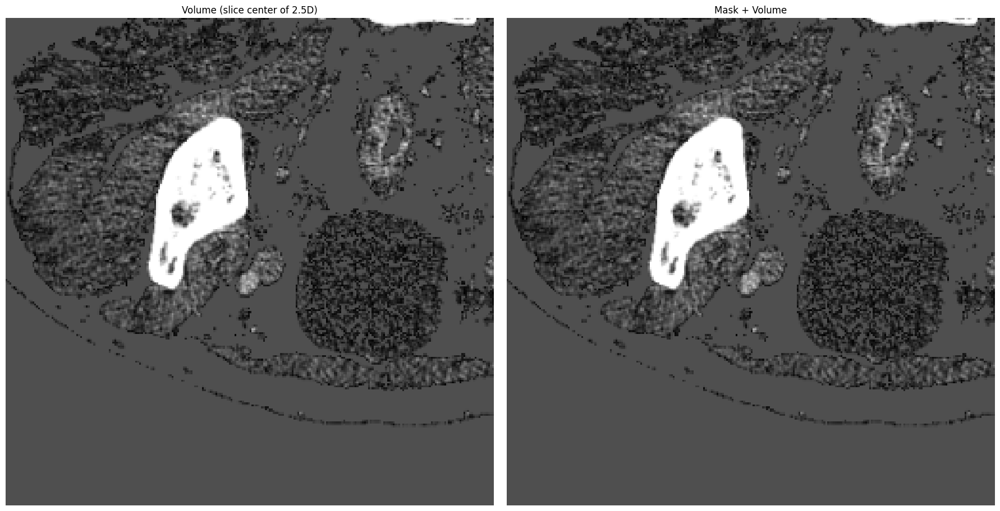

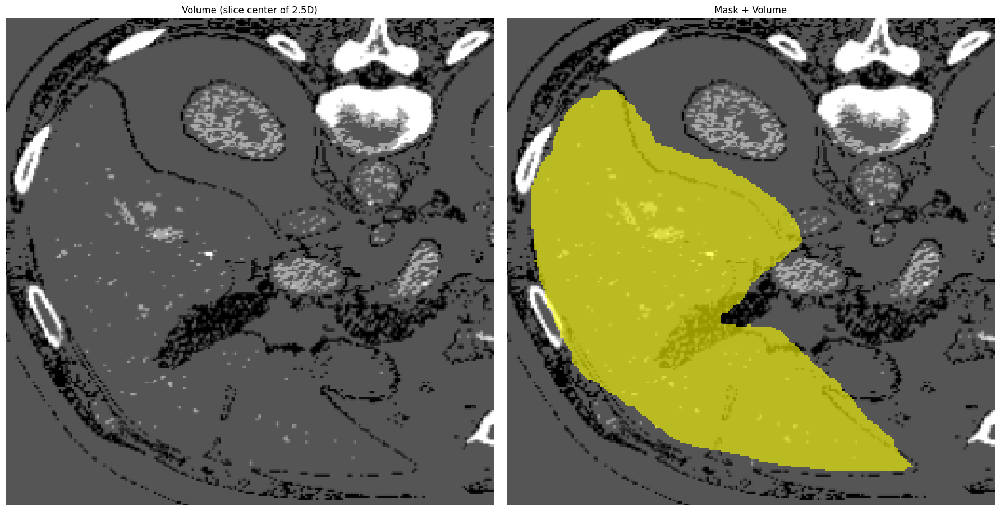

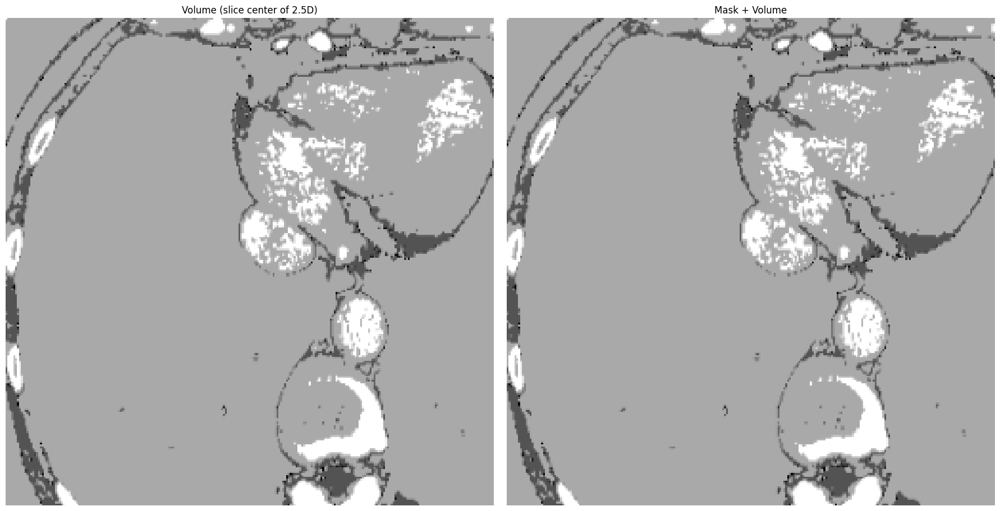

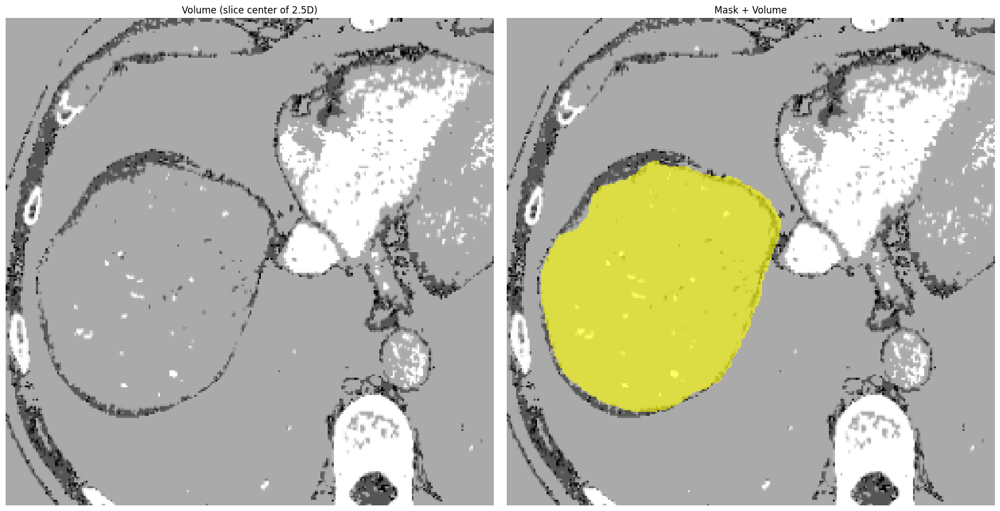

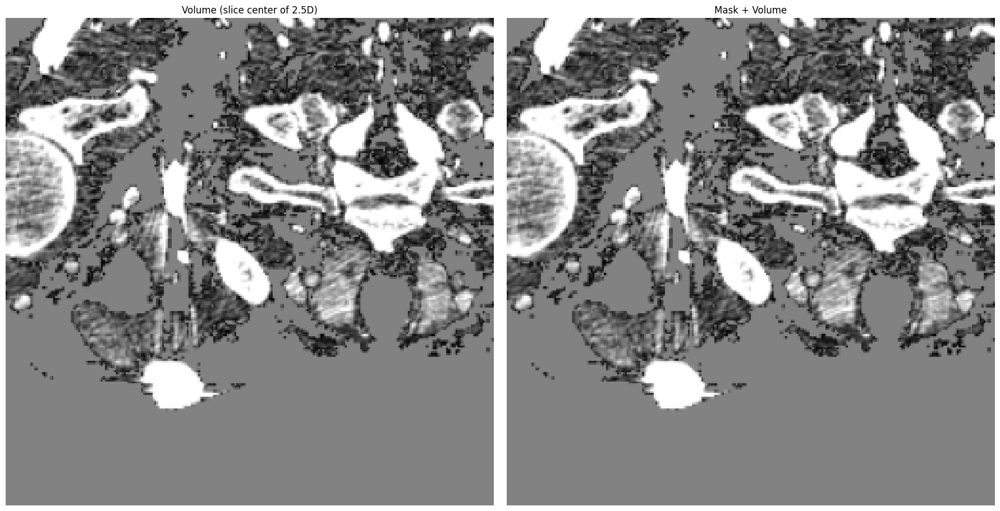

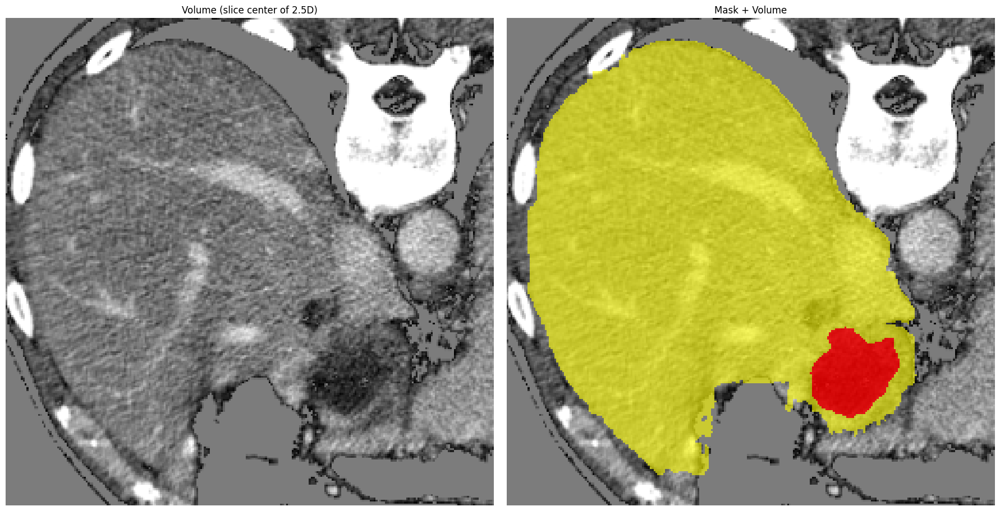

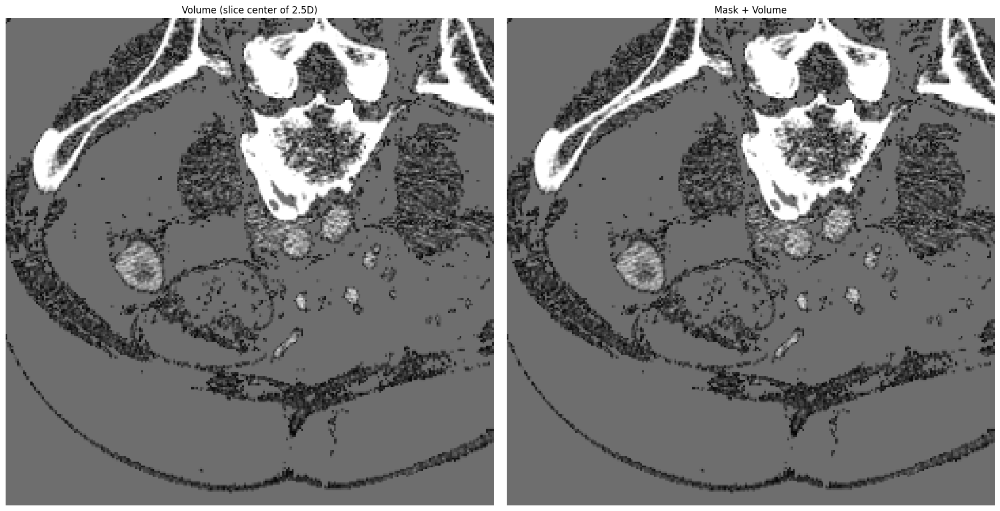

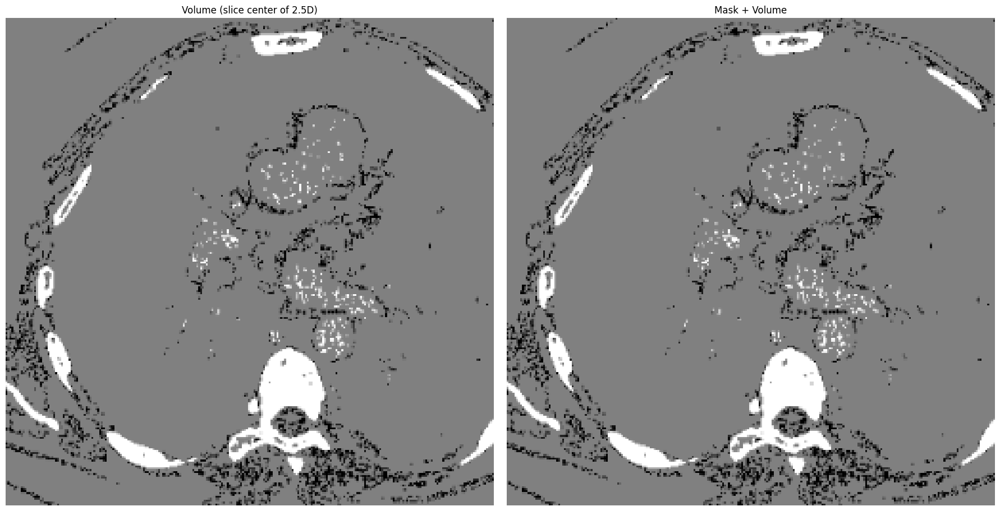

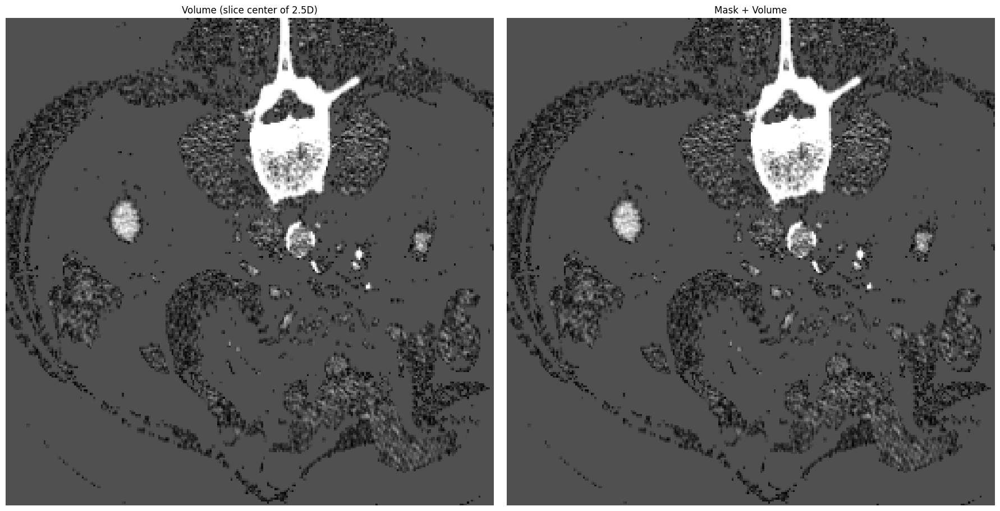

In [19]:
i = 20
for val_data in val_loader:
    i+= 1

    image = val_data["image"]
    label = val_data["label"]
    liver_mask = val_data["liver_mask"]
    visualize_from_loader(image, label, liver_mask)

    if i == 30:
      break

## Custom train dataset

In [20]:
import random

indices_liver = []
indices_tumor = []
indices_background = []

for i in range(len(full_train_dataset)):
    sample = full_train_dataset[i]
    label = sample["label"]
    liver = sample["liver_mask"]

    if label.sum() > 0:
        indices_tumor.append(i)
    elif liver.sum() > 0:
        indices_liver.append(i)
    else:
        indices_background.append(i)
random.seed(42)
selected_background = random.sample(indices_background, k=int(len(indices_background) * 0.4))
final_indices = indices_tumor + indices_liver + selected_background

In [21]:
from torch.utils.data import Subset
balanced_dataset = Subset(full_train_dataset, final_indices)

In [22]:
print(len(balanced_dataset))

14009


## WeightedRandomSampler

In [23]:
import torch
from torch.utils.data import WeightedRandomSampler

weights = []
for i in range(len(balanced_dataset)):
    sample = balanced_dataset[i]
    has_tumor = sample["label"].sum() > 0
    weights.append(5.0 if has_tumor else 1.0)

In [24]:
sampler = WeightedRandomSampler(weights, num_samples=len(balanced_dataset), replacement=True)
train_loader = torch.utils.data.DataLoader(balanced_dataset, batch_size=16, sampler=sampler, shuffle=False, pin_memory=True, num_workers=2, drop_last=True, prefetch_factor=4)

## Training

In [25]:
criterion = TverskyLossWSigmoid().to(device)

dice_acc = DiceMetric(include_background=False, reduction='mean_batch', get_not_nans=True)

optimizer = torch.optim.AdamW(model.parameters(), lr=float(config["learning_rate"]), weight_decay=float(config["weight_decay"]))
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=int(int(config["max_epochs"]) * 0.75), eta_min = float(config["eta_min"]))

In [26]:
LOGGER.info("[TRAINER] Start TRAIN process...")

(
    val_acc_max,
    best_epoch,
    dices_tumor,
    loss_epochs,
    trains_epoch,
    ious_tumor,
    precisions_tumor,
    recalls_tumor,
    time_tmp
) = trainer_stage2(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    optimizer=optimizer,
    loss_func=criterion,
    acc_func=dice_acc,
    scheduler=scheduler,
    batch_size=config["batch_size"],
    max_epochs = int(int(config["max_epochs"]) * 0.75),  # reducing epochs to 75% for faster training
    start_epoch = config["start_epoch"],
    val_every=config["val_every"],
    path_save_model=config["path_save_model_state"],
    logger=LOGGER,
    save_model=True,
    post_fix="tumor_mcb"
)

[TRAINER] Start TRAIN process...
INFO:kltn.utils.logger:[TRAINER] Start TRAIN process...

==============================Training epoch 1==============================
INFO:kltn.utils.logger:
==============================Training epoch 1==============================


Epoch 1/75 1/875 loss: 0.9107 time 4.55s
Epoch 1/75 2/875 loss: 0.8914 time 0.67s
Epoch 1/75 3/875 loss: 0.8731 time 0.68s
Epoch 1/75 4/875 loss: 0.8591 time 0.68s
Epoch 1/75 5/875 loss: 0.8470 time 0.69s
Epoch 1/75 6/875 loss: 0.8359 time 0.69s
Epoch 1/75 7/875 loss: 0.8276 time 0.68s
Epoch 1/75 8/875 loss: 0.8203 time 0.69s
Epoch 1/75 9/875 loss: 0.8132 time 0.69s
Epoch 1/75 10/875 loss: 0.8068 time 0.79s
Epoch 1/75 11/875 loss: 0.8016 time 0.79s
Epoch 1/75 12/875 loss: 0.7971 time 0.75s
Epoch 1/75 13/875 loss: 0.7925 time 0.75s
Epoch 1/75 14/875 loss: 0.7882 time 0.77s
Epoch 1/75 15/875 loss: 0.7842 time 0.80s
Epoch 1/75 16/875 loss: 0.7806 time 0.82s
Epoch 1/75 17/875 loss: 0.7770 time 0.80s
Epoch 1/75 18/875 loss: 0.7742 time 0.73s
Epoch 1/75 19/875 loss: 0.7702 time 0.71s
Epoch 1/75 20/875 loss: 0.7678 time 0.68s
Epoch 1/75 21/875 loss: 0.7640 time 0.69s
Epoch 1/75 22/875 loss: 0.7620 time 0.69s
Epoch 1/75 23/875 loss: 0.7593 time 0.68s
Epoch 1/75 24/875 loss: 0.7575 time 0.70s
E

Final training epochs: 1/75 ---[loss: 0.6020] ---[time 664.65s]
INFO:kltn.utils.logger:Final training epochs: 1/75 ---[loss: 0.6020] ---[time 664.65s]

********************Epoch 1 Validation********************
INFO:kltn.utils.logger:
********************Epoch 1 Validation********************


Epoch 1/75 875/875 loss: 0.6020 time 0.72s


Val 1/75 1/183, Dice_Tumor: 0.289009, time 2.70s
INFO:kltn.utils.logger:Val 1/75 1/183, Dice_Tumor: 0.289009, time 2.70s
Val 1/75 2/183, Dice_Tumor: 0.387957, time 0.97s
INFO:kltn.utils.logger:Val 1/75 2/183, Dice_Tumor: 0.387957, time 0.97s
Val 1/75 3/183, Dice_Tumor: 0.438675, time 1.88s
INFO:kltn.utils.logger:Val 1/75 3/183, Dice_Tumor: 0.438675, time 1.88s
Val 1/75 4/183, Dice_Tumor: 0.688557, time 1.43s
INFO:kltn.utils.logger:Val 1/75 4/183, Dice_Tumor: 0.688557, time 1.43s
Val 1/75 5/183, Dice_Tumor: 0.226961, time 1.21s
INFO:kltn.utils.logger:Val 1/75 5/183, Dice_Tumor: 0.226961, time 1.21s
Val 1/75 6/183, Dice_Tumor: 0.317937, time 1.08s
INFO:kltn.utils.logger:Val 1/75 6/183, Dice_Tumor: 0.317937, time 1.08s
Val 1/75 7/183, Dice_Tumor: 0.602817, time 1.11s
INFO:kltn.utils.logger:Val 1/75 7/183, Dice_Tumor: 0.602817, time 1.11s
Val 1/75 8/183, Dice_Tumor: 0.291392, time 0.77s
INFO:kltn.utils.logger:Val 1/75 8/183, Dice_Tumor: 0.291392, time 0.77s
Val 1/75 9/183, Dice_Tumor: 0.04

New best (0.000000 --> 0.390651). At epoch 1


Epoch 1/75 ---[loss: 0.6020] ---[val_dice: 0.390651] ---[time 168.99s]
INFO:kltn.utils.logger:Epoch 1/75 ---[loss: 0.6020] ---[val_dice: 0.390651] ---[time 168.99s]

==============================Training epoch 2==============================
INFO:kltn.utils.logger:
==============================Training epoch 2==============================


Epoch 2/75 1/875 loss: 0.5680 time 1.60s
Epoch 2/75 2/875 loss: 0.5770 time 0.77s
Epoch 2/75 3/875 loss: 0.5665 time 0.74s
Epoch 2/75 4/875 loss: 0.5759 time 0.73s
Epoch 2/75 5/875 loss: 0.5743 time 0.73s
Epoch 2/75 6/875 loss: 0.5716 time 0.78s
Epoch 2/75 7/875 loss: 0.5736 time 0.82s
Epoch 2/75 8/875 loss: 0.5716 time 0.79s
Epoch 2/75 9/875 loss: 0.5717 time 0.79s
Epoch 2/75 10/875 loss: 0.5712 time 0.80s
Epoch 2/75 11/875 loss: 0.5730 time 0.85s
Epoch 2/75 12/875 loss: 0.5760 time 0.82s
Epoch 2/75 13/875 loss: 0.5752 time 0.81s
Epoch 2/75 14/875 loss: 0.5790 time 0.74s
Epoch 2/75 15/875 loss: 0.5791 time 0.74s
Epoch 2/75 16/875 loss: 0.5834 time 0.75s
Epoch 2/75 17/875 loss: 0.5834 time 0.76s
Epoch 2/75 18/875 loss: 0.5819 time 0.70s
Epoch 2/75 19/875 loss: 0.5826 time 0.72s
Epoch 2/75 20/875 loss: 0.5801 time 0.74s
Epoch 2/75 21/875 loss: 0.5798 time 0.76s
Epoch 2/75 22/875 loss: 0.5794 time 0.70s
Epoch 2/75 23/875 loss: 0.5779 time 0.74s
Epoch 2/75 24/875 loss: 0.5728 time 0.76s
E

Final training epochs: 2/75 ---[loss: 0.5481] ---[time 666.25s]
INFO:kltn.utils.logger:Final training epochs: 2/75 ---[loss: 0.5481] ---[time 666.25s]

********************Epoch 2 Validation********************
INFO:kltn.utils.logger:
********************Epoch 2 Validation********************


Epoch 2/75 875/875 loss: 0.5481 time 0.72s


Val 2/75 1/183, Dice_Tumor: 0.393492, time 1.95s
INFO:kltn.utils.logger:Val 2/75 1/183, Dice_Tumor: 0.393492, time 1.95s
Val 2/75 2/183, Dice_Tumor: 0.218234, time 0.91s
INFO:kltn.utils.logger:Val 2/75 2/183, Dice_Tumor: 0.218234, time 0.91s
Val 2/75 3/183, Dice_Tumor: 0.445201, time 1.16s
INFO:kltn.utils.logger:Val 2/75 3/183, Dice_Tumor: 0.445201, time 1.16s
Val 2/75 4/183, Dice_Tumor: 0.440784, time 0.91s
INFO:kltn.utils.logger:Val 2/75 4/183, Dice_Tumor: 0.440784, time 0.91s
Val 2/75 5/183, Dice_Tumor: 0.333744, time 0.93s
INFO:kltn.utils.logger:Val 2/75 5/183, Dice_Tumor: 0.333744, time 0.93s
Val 2/75 6/183, Dice_Tumor: 0.424203, time 0.90s
INFO:kltn.utils.logger:Val 2/75 6/183, Dice_Tumor: 0.424203, time 0.90s
Val 2/75 7/183, Dice_Tumor: 0.333809, time 0.87s
INFO:kltn.utils.logger:Val 2/75 7/183, Dice_Tumor: 0.333809, time 0.87s
Val 2/75 8/183, Dice_Tumor: 0.743176, time 0.76s
INFO:kltn.utils.logger:Val 2/75 8/183, Dice_Tumor: 0.743176, time 0.76s
Val 2/75 9/183, Dice_Tumor: 0.26

New best (0.390651 --> 0.413086). At epoch 2
Epoch 3/75 1/875 loss: 0.4883 time 1.36s
Epoch 3/75 2/875 loss: 0.5061 time 0.75s
Epoch 3/75 3/875 loss: 0.5114 time 0.78s
Epoch 3/75 4/875 loss: 0.5240 time 0.80s
Epoch 3/75 5/875 loss: 0.5249 time 0.81s
Epoch 3/75 6/875 loss: 0.5296 time 0.84s
Epoch 3/75 7/875 loss: 0.5263 time 0.82s
Epoch 3/75 8/875 loss: 0.5240 time 0.79s
Epoch 3/75 9/875 loss: 0.5221 time 0.85s
Epoch 3/75 10/875 loss: 0.5194 time 0.85s
Epoch 3/75 11/875 loss: 0.5140 time 0.80s
Epoch 3/75 12/875 loss: 0.5137 time 0.80s
Epoch 3/75 13/875 loss: 0.5138 time 0.76s
Epoch 3/75 14/875 loss: 0.5190 time 0.79s
Epoch 3/75 15/875 loss: 0.5171 time 0.79s
Epoch 3/75 16/875 loss: 0.5192 time 0.79s
Epoch 3/75 17/875 loss: 0.5217 time 0.77s
Epoch 3/75 18/875 loss: 0.5183 time 0.81s
Epoch 3/75 19/875 loss: 0.5220 time 0.79s
Epoch 3/75 20/875 loss: 0.5205 time 0.80s
Epoch 3/75 21/875 loss: 0.5193 time 0.79s
Epoch 3/75 22/875 loss: 0.5221 time 0.79s
Epoch 3/75 23/875 loss: 0.5210 time 0.75

Final training epochs: 3/75 ---[loss: 0.5224] ---[time 665.84s]
INFO:kltn.utils.logger:Final training epochs: 3/75 ---[loss: 0.5224] ---[time 665.84s]

********************Epoch 3 Validation********************
INFO:kltn.utils.logger:
********************Epoch 3 Validation********************


Epoch 3/75 875/875 loss: 0.5224 time 0.72s


Val 3/75 1/183, Dice_Tumor: 0.446355, time 1.69s
INFO:kltn.utils.logger:Val 3/75 1/183, Dice_Tumor: 0.446355, time 1.69s
Val 3/75 2/183, Dice_Tumor: 0.559557, time 0.95s
INFO:kltn.utils.logger:Val 3/75 2/183, Dice_Tumor: 0.559557, time 0.95s
Val 3/75 3/183, Dice_Tumor: 0.570308, time 0.97s
INFO:kltn.utils.logger:Val 3/75 3/183, Dice_Tumor: 0.570308, time 0.97s
Val 3/75 4/183, Dice_Tumor: 0.792217, time 0.98s
INFO:kltn.utils.logger:Val 3/75 4/183, Dice_Tumor: 0.792217, time 0.98s
Val 3/75 5/183, Dice_Tumor: 0.495582, time 0.93s
INFO:kltn.utils.logger:Val 3/75 5/183, Dice_Tumor: 0.495582, time 0.93s
Val 3/75 6/183, Dice_Tumor: 0.526911, time 0.99s
INFO:kltn.utils.logger:Val 3/75 6/183, Dice_Tumor: 0.526911, time 0.99s
Val 3/75 7/183, Dice_Tumor: 0.581267, time 0.94s
INFO:kltn.utils.logger:Val 3/75 7/183, Dice_Tumor: 0.581267, time 0.94s
Val 3/75 8/183, Dice_Tumor: 0.764266, time 0.75s
INFO:kltn.utils.logger:Val 3/75 8/183, Dice_Tumor: 0.764266, time 0.75s
Val 3/75 9/183, Dice_Tumor: 0.25

New best (0.413086 --> 0.491290). At epoch 3
Epoch 4/75 1/875 loss: 0.4396 time 1.48s
Epoch 4/75 2/875 loss: 0.4918 time 0.77s
Epoch 4/75 3/875 loss: 0.5089 time 0.79s
Epoch 4/75 4/875 loss: 0.4783 time 0.75s
Epoch 4/75 5/875 loss: 0.5045 time 0.82s
Epoch 4/75 6/875 loss: 0.4747 time 0.82s
Epoch 4/75 7/875 loss: 0.5031 time 0.89s
Epoch 4/75 8/875 loss: 0.5106 time 0.78s
Epoch 4/75 9/875 loss: 0.5012 time 0.99s
Epoch 4/75 10/875 loss: 0.5018 time 0.78s
Epoch 4/75 11/875 loss: 0.4960 time 1.11s
Epoch 4/75 12/875 loss: 0.4895 time 0.76s
Epoch 4/75 13/875 loss: 0.4865 time 0.74s
Epoch 4/75 14/875 loss: 0.4863 time 0.77s
Epoch 4/75 15/875 loss: 0.4939 time 0.73s
Epoch 4/75 16/875 loss: 0.4935 time 0.75s
Epoch 4/75 17/875 loss: 0.4956 time 0.75s
Epoch 4/75 18/875 loss: 0.4934 time 0.73s
Epoch 4/75 19/875 loss: 0.4990 time 0.77s
Epoch 4/75 20/875 loss: 0.4984 time 0.75s
Epoch 4/75 21/875 loss: 0.5013 time 0.77s
Epoch 4/75 22/875 loss: 0.5040 time 0.79s
Epoch 4/75 23/875 loss: 0.5074 time 0.75

Final training epochs: 4/75 ---[loss: 0.5112] ---[time 667.01s]
INFO:kltn.utils.logger:Final training epochs: 4/75 ---[loss: 0.5112] ---[time 667.01s]

********************Epoch 4 Validation********************
INFO:kltn.utils.logger:
********************Epoch 4 Validation********************


Epoch 4/75 875/875 loss: 0.5112 time 0.72s


Val 4/75 1/183, Dice_Tumor: 0.510808, time 1.84s
INFO:kltn.utils.logger:Val 4/75 1/183, Dice_Tumor: 0.510808, time 1.84s
Val 4/75 2/183, Dice_Tumor: 0.443804, time 1.30s
INFO:kltn.utils.logger:Val 4/75 2/183, Dice_Tumor: 0.443804, time 1.30s
Val 4/75 3/183, Dice_Tumor: 0.571597, time 2.07s
INFO:kltn.utils.logger:Val 4/75 3/183, Dice_Tumor: 0.571597, time 2.07s
Val 4/75 4/183, Dice_Tumor: 0.727122, time 1.80s
INFO:kltn.utils.logger:Val 4/75 4/183, Dice_Tumor: 0.727122, time 1.80s
Val 4/75 5/183, Dice_Tumor: 0.514790, time 1.29s
INFO:kltn.utils.logger:Val 4/75 5/183, Dice_Tumor: 0.514790, time 1.29s
Val 4/75 6/183, Dice_Tumor: 0.556536, time 0.77s
INFO:kltn.utils.logger:Val 4/75 6/183, Dice_Tumor: 0.556536, time 0.77s
Val 4/75 7/183, Dice_Tumor: 0.577872, time 0.75s
INFO:kltn.utils.logger:Val 4/75 7/183, Dice_Tumor: 0.577872, time 0.75s
Val 4/75 8/183, Dice_Tumor: 0.625354, time 0.74s
INFO:kltn.utils.logger:Val 4/75 8/183, Dice_Tumor: 0.625354, time 0.74s
Val 4/75 9/183, Dice_Tumor: 0.23

New best (0.491290 --> 0.536964). At epoch 4
Epoch 5/75 1/875 loss: 0.4123 time 1.56s
Epoch 5/75 2/875 loss: 0.4727 time 0.79s
Epoch 5/75 3/875 loss: 0.4842 time 0.75s
Epoch 5/75 4/875 loss: 0.4866 time 0.75s
Epoch 5/75 5/875 loss: 0.4674 time 0.76s
Epoch 5/75 6/875 loss: 0.4832 time 0.72s
Epoch 5/75 7/875 loss: 0.4885 time 0.76s
Epoch 5/75 8/875 loss: 0.4960 time 0.79s
Epoch 5/75 9/875 loss: 0.4904 time 0.76s
Epoch 5/75 10/875 loss: 0.4743 time 0.78s
Epoch 5/75 11/875 loss: 0.4805 time 0.85s
Epoch 5/75 12/875 loss: 0.4854 time 0.80s
Epoch 5/75 13/875 loss: 0.4920 time 0.79s
Epoch 5/75 14/875 loss: 0.5003 time 0.77s
Epoch 5/75 15/875 loss: 0.5073 time 0.77s
Epoch 5/75 16/875 loss: 0.5025 time 0.81s
Epoch 5/75 17/875 loss: 0.5040 time 0.86s
Epoch 5/75 18/875 loss: 0.5064 time 0.74s
Epoch 5/75 19/875 loss: 0.5061 time 0.74s
Epoch 5/75 20/875 loss: 0.5076 time 0.76s
Epoch 5/75 21/875 loss: 0.5027 time 0.76s
Epoch 5/75 22/875 loss: 0.5010 time 0.73s
Epoch 5/75 23/875 loss: 0.4980 time 0.77

Final training epochs: 5/75 ---[loss: 0.4972] ---[time 664.16s]
INFO:kltn.utils.logger:Final training epochs: 5/75 ---[loss: 0.4972] ---[time 664.16s]

********************Epoch 5 Validation********************
INFO:kltn.utils.logger:
********************Epoch 5 Validation********************


Epoch 5/75 875/875 loss: 0.4972 time 0.72s


Val 5/75 1/183, Dice_Tumor: 0.471032, time 3.09s
INFO:kltn.utils.logger:Val 5/75 1/183, Dice_Tumor: 0.471032, time 3.09s
Val 5/75 2/183, Dice_Tumor: 0.633261, time 2.00s
INFO:kltn.utils.logger:Val 5/75 2/183, Dice_Tumor: 0.633261, time 2.00s
Val 5/75 3/183, Dice_Tumor: 0.621238, time 0.90s
INFO:kltn.utils.logger:Val 5/75 3/183, Dice_Tumor: 0.621238, time 0.90s
Val 5/75 4/183, Dice_Tumor: 0.782564, time 0.95s
INFO:kltn.utils.logger:Val 5/75 4/183, Dice_Tumor: 0.782564, time 0.95s
Val 5/75 5/183, Dice_Tumor: 0.510158, time 0.91s
INFO:kltn.utils.logger:Val 5/75 5/183, Dice_Tumor: 0.510158, time 0.91s
Val 5/75 6/183, Dice_Tumor: 0.592386, time 0.85s
INFO:kltn.utils.logger:Val 5/75 6/183, Dice_Tumor: 0.592386, time 0.85s
Val 5/75 7/183, Dice_Tumor: 0.652538, time 0.75s
INFO:kltn.utils.logger:Val 5/75 7/183, Dice_Tumor: 0.652538, time 0.75s
Val 5/75 8/183, Dice_Tumor: 0.853878, time 0.73s
INFO:kltn.utils.logger:Val 5/75 8/183, Dice_Tumor: 0.853878, time 0.73s
Val 5/75 9/183, Dice_Tumor: 0.30

New best (0.536964 --> 0.537209). At epoch 5
Epoch 6/75 1/875 loss: 0.5629 time 1.45s
Epoch 6/75 2/875 loss: 0.5156 time 0.78s
Epoch 6/75 3/875 loss: 0.5106 time 0.77s
Epoch 6/75 4/875 loss: 0.5040 time 0.76s
Epoch 6/75 5/875 loss: 0.4955 time 0.74s
Epoch 6/75 6/875 loss: 0.4997 time 0.72s
Epoch 6/75 7/875 loss: 0.4924 time 0.79s
Epoch 6/75 8/875 loss: 0.4788 time 0.81s
Epoch 6/75 9/875 loss: 0.4823 time 0.83s
Epoch 6/75 10/875 loss: 0.4851 time 0.79s
Epoch 6/75 11/875 loss: 0.4891 time 0.80s
Epoch 6/75 12/875 loss: 0.5012 time 0.82s
Epoch 6/75 13/875 loss: 0.4993 time 0.75s
Epoch 6/75 14/875 loss: 0.4949 time 0.77s
Epoch 6/75 15/875 loss: 0.4930 time 0.83s
Epoch 6/75 16/875 loss: 0.4932 time 0.72s
Epoch 6/75 17/875 loss: 0.4923 time 0.77s
Epoch 6/75 18/875 loss: 0.4869 time 0.75s
Epoch 6/75 19/875 loss: 0.4868 time 0.77s
Epoch 6/75 20/875 loss: 0.4887 time 0.78s
Epoch 6/75 21/875 loss: 0.4884 time 0.78s
Epoch 6/75 22/875 loss: 0.4877 time 0.76s
Epoch 6/75 23/875 loss: 0.4904 time 0.79

Final training epochs: 6/75 ---[loss: 0.4906] ---[time 665.72s]
INFO:kltn.utils.logger:Final training epochs: 6/75 ---[loss: 0.4906] ---[time 665.72s]

********************Epoch 6 Validation********************
INFO:kltn.utils.logger:
********************Epoch 6 Validation********************


Epoch 6/75 875/875 loss: 0.4906 time 0.72s


Val 6/75 1/183, Dice_Tumor: 0.480626, time 3.11s
INFO:kltn.utils.logger:Val 6/75 1/183, Dice_Tumor: 0.480626, time 3.11s
Val 6/75 2/183, Dice_Tumor: 0.661374, time 1.91s
INFO:kltn.utils.logger:Val 6/75 2/183, Dice_Tumor: 0.661374, time 1.91s
Val 6/75 3/183, Dice_Tumor: 0.734441, time 1.16s
INFO:kltn.utils.logger:Val 6/75 3/183, Dice_Tumor: 0.734441, time 1.16s
Val 6/75 4/183, Dice_Tumor: 0.805197, time 0.93s
INFO:kltn.utils.logger:Val 6/75 4/183, Dice_Tumor: 0.805197, time 0.93s
Val 6/75 5/183, Dice_Tumor: 0.578311, time 0.95s
INFO:kltn.utils.logger:Val 6/75 5/183, Dice_Tumor: 0.578311, time 0.95s
Val 6/75 6/183, Dice_Tumor: 0.566392, time 0.80s
INFO:kltn.utils.logger:Val 6/75 6/183, Dice_Tumor: 0.566392, time 0.80s
Val 6/75 7/183, Dice_Tumor: 0.657988, time 0.75s
INFO:kltn.utils.logger:Val 6/75 7/183, Dice_Tumor: 0.657988, time 0.75s
Val 6/75 8/183, Dice_Tumor: 0.739065, time 0.73s
INFO:kltn.utils.logger:Val 6/75 8/183, Dice_Tumor: 0.739065, time 0.73s
Val 6/75 9/183, Dice_Tumor: 0.41

New best (0.537209 --> 0.542399). At epoch 6
Epoch 7/75 1/875 loss: 0.4536 time 1.57s
Epoch 7/75 2/875 loss: 0.4832 time 0.74s
Epoch 7/75 3/875 loss: 0.4897 time 0.78s
Epoch 7/75 4/875 loss: 0.5062 time 0.78s
Epoch 7/75 5/875 loss: 0.4766 time 0.78s
Epoch 7/75 6/875 loss: 0.4788 time 0.79s
Epoch 7/75 7/875 loss: 0.4901 time 0.72s
Epoch 7/75 8/875 loss: 0.4827 time 0.79s
Epoch 7/75 9/875 loss: 0.4918 time 0.76s
Epoch 7/75 10/875 loss: 0.4905 time 0.73s
Epoch 7/75 11/875 loss: 0.4940 time 0.74s
Epoch 7/75 12/875 loss: 0.4912 time 0.73s
Epoch 7/75 13/875 loss: 0.4832 time 0.84s
Epoch 7/75 14/875 loss: 0.4786 time 0.83s
Epoch 7/75 15/875 loss: 0.4776 time 0.83s
Epoch 7/75 16/875 loss: 0.4738 time 0.78s
Epoch 7/75 17/875 loss: 0.4786 time 0.76s
Epoch 7/75 18/875 loss: 0.4797 time 0.85s
Epoch 7/75 19/875 loss: 0.4746 time 0.83s
Epoch 7/75 20/875 loss: 0.4748 time 0.75s
Epoch 7/75 21/875 loss: 0.4751 time 0.80s
Epoch 7/75 22/875 loss: 0.4811 time 0.77s
Epoch 7/75 23/875 loss: 0.4799 time 0.73

Final training epochs: 7/75 ---[loss: 0.4847] ---[time 665.54s]
INFO:kltn.utils.logger:Final training epochs: 7/75 ---[loss: 0.4847] ---[time 665.54s]

********************Epoch 7 Validation********************
INFO:kltn.utils.logger:
********************Epoch 7 Validation********************


Epoch 7/75 875/875 loss: 0.4847 time 0.72s


Val 7/75 1/183, Dice_Tumor: 0.511756, time 1.74s
INFO:kltn.utils.logger:Val 7/75 1/183, Dice_Tumor: 0.511756, time 1.74s
Val 7/75 2/183, Dice_Tumor: 0.527596, time 0.90s
INFO:kltn.utils.logger:Val 7/75 2/183, Dice_Tumor: 0.527596, time 0.90s
Val 7/75 3/183, Dice_Tumor: 0.629253, time 0.90s
INFO:kltn.utils.logger:Val 7/75 3/183, Dice_Tumor: 0.629253, time 0.90s
Val 7/75 4/183, Dice_Tumor: 0.785685, time 0.96s
INFO:kltn.utils.logger:Val 7/75 4/183, Dice_Tumor: 0.785685, time 0.96s
Val 7/75 5/183, Dice_Tumor: 0.556537, time 0.93s
INFO:kltn.utils.logger:Val 7/75 5/183, Dice_Tumor: 0.556537, time 0.93s
Val 7/75 6/183, Dice_Tumor: 0.541340, time 0.96s
INFO:kltn.utils.logger:Val 7/75 6/183, Dice_Tumor: 0.541340, time 0.96s
Val 7/75 7/183, Dice_Tumor: 0.736171, time 0.91s
INFO:kltn.utils.logger:Val 7/75 7/183, Dice_Tumor: 0.736171, time 0.91s
Val 7/75 8/183, Dice_Tumor: 0.813332, time 0.97s
INFO:kltn.utils.logger:Val 7/75 8/183, Dice_Tumor: 0.813332, time 0.97s
Val 7/75 9/183, Dice_Tumor: 0.26

New best (0.542399 --> 0.555765). At epoch 7



==============================Training epoch 8==============================
INFO:kltn.utils.logger:
==============================Training epoch 8==============================


Epoch 8/75 1/875 loss: 0.5090 time 1.54s
Epoch 8/75 2/875 loss: 0.4795 time 0.75s
Epoch 8/75 3/875 loss: 0.5118 time 0.72s
Epoch 8/75 4/875 loss: 0.4786 time 0.81s
Epoch 8/75 5/875 loss: 0.4624 time 0.79s
Epoch 8/75 6/875 loss: 0.4685 time 0.75s
Epoch 8/75 7/875 loss: 0.4813 time 0.83s
Epoch 8/75 8/875 loss: 0.4785 time 0.79s
Epoch 8/75 9/875 loss: 0.4700 time 0.85s
Epoch 8/75 10/875 loss: 0.4669 time 0.80s
Epoch 8/75 11/875 loss: 0.4683 time 0.81s
Epoch 8/75 12/875 loss: 0.4622 time 0.86s
Epoch 8/75 13/875 loss: 0.4644 time 0.84s
Epoch 8/75 14/875 loss: 0.4607 time 0.73s
Epoch 8/75 15/875 loss: 0.4647 time 0.73s
Epoch 8/75 16/875 loss: 0.4707 time 0.75s
Epoch 8/75 17/875 loss: 0.4735 time 0.76s
Epoch 8/75 18/875 loss: 0.4723 time 0.75s
Epoch 8/75 19/875 loss: 0.4696 time 0.75s
Epoch 8/75 20/875 loss: 0.4668 time 0.75s
Epoch 8/75 21/875 loss: 0.4688 time 0.75s
Epoch 8/75 22/875 loss: 0.4701 time 0.75s
Epoch 8/75 23/875 loss: 0.4728 time 0.73s
Epoch 8/75 24/875 loss: 0.4728 time 0.72s
E

Final training epochs: 8/75 ---[loss: 0.4768] ---[time 664.25s]
INFO:kltn.utils.logger:Final training epochs: 8/75 ---[loss: 0.4768] ---[time 664.25s]

********************Epoch 8 Validation********************
INFO:kltn.utils.logger:
********************Epoch 8 Validation********************


Epoch 8/75 875/875 loss: 0.4768 time 0.72s


Val 8/75 1/183, Dice_Tumor: 0.493359, time 3.02s
INFO:kltn.utils.logger:Val 8/75 1/183, Dice_Tumor: 0.493359, time 3.02s
Val 8/75 2/183, Dice_Tumor: 0.584672, time 1.85s
INFO:kltn.utils.logger:Val 8/75 2/183, Dice_Tumor: 0.584672, time 1.85s
Val 8/75 3/183, Dice_Tumor: 0.785772, time 1.47s
INFO:kltn.utils.logger:Val 8/75 3/183, Dice_Tumor: 0.785772, time 1.47s
Val 8/75 4/183, Dice_Tumor: 0.623337, time 0.91s
INFO:kltn.utils.logger:Val 8/75 4/183, Dice_Tumor: 0.623337, time 0.91s
Val 8/75 5/183, Dice_Tumor: 0.644106, time 0.87s
INFO:kltn.utils.logger:Val 8/75 5/183, Dice_Tumor: 0.644106, time 0.87s
Val 8/75 6/183, Dice_Tumor: 0.590054, time 0.80s
INFO:kltn.utils.logger:Val 8/75 6/183, Dice_Tumor: 0.590054, time 0.80s
Val 8/75 7/183, Dice_Tumor: 0.471404, time 0.75s
INFO:kltn.utils.logger:Val 8/75 7/183, Dice_Tumor: 0.471404, time 0.75s
Val 8/75 8/183, Dice_Tumor: 0.852143, time 0.73s
INFO:kltn.utils.logger:Val 8/75 8/183, Dice_Tumor: 0.852143, time 0.73s
Val 8/75 9/183, Dice_Tumor: 0.45

Epoch 9/75 1/875 loss: 0.5218 time 1.52s
Epoch 9/75 2/875 loss: 0.5301 time 0.77s
Epoch 9/75 3/875 loss: 0.5215 time 0.75s
Epoch 9/75 4/875 loss: 0.5237 time 0.72s
Epoch 9/75 5/875 loss: 0.5132 time 0.80s
Epoch 9/75 6/875 loss: 0.5112 time 0.75s
Epoch 9/75 7/875 loss: 0.5000 time 0.72s
Epoch 9/75 8/875 loss: 0.4908 time 0.76s
Epoch 9/75 9/875 loss: 0.4840 time 0.80s
Epoch 9/75 10/875 loss: 0.4911 time 0.80s
Epoch 9/75 11/875 loss: 0.4787 time 0.83s
Epoch 9/75 12/875 loss: 0.4772 time 0.81s
Epoch 9/75 13/875 loss: 0.4826 time 0.78s
Epoch 9/75 14/875 loss: 0.4909 time 0.81s
Epoch 9/75 15/875 loss: 0.4848 time 0.84s
Epoch 9/75 16/875 loss: 0.4825 time 0.85s
Epoch 9/75 17/875 loss: 0.4802 time 0.78s
Epoch 9/75 18/875 loss: 0.4837 time 0.79s
Epoch 9/75 19/875 loss: 0.4834 time 0.77s
Epoch 9/75 20/875 loss: 0.4853 time 0.77s
Epoch 9/75 21/875 loss: 0.4836 time 0.78s
Epoch 9/75 22/875 loss: 0.4766 time 0.75s
Epoch 9/75 23/875 loss: 0.4705 time 0.72s
Epoch 9/75 24/875 loss: 0.4713 time 0.72s
E

Final training epochs: 9/75 ---[loss: 0.4717] ---[time 666.11s]
INFO:kltn.utils.logger:Final training epochs: 9/75 ---[loss: 0.4717] ---[time 666.11s]

********************Epoch 9 Validation********************
INFO:kltn.utils.logger:
********************Epoch 9 Validation********************


Epoch 9/75 875/875 loss: 0.4717 time 0.72s


Val 9/75 1/183, Dice_Tumor: 0.477049, time 1.74s
INFO:kltn.utils.logger:Val 9/75 1/183, Dice_Tumor: 0.477049, time 1.74s
Val 9/75 2/183, Dice_Tumor: 0.635850, time 1.01s
INFO:kltn.utils.logger:Val 9/75 2/183, Dice_Tumor: 0.635850, time 1.01s
Val 9/75 3/183, Dice_Tumor: 0.659999, time 0.95s
INFO:kltn.utils.logger:Val 9/75 3/183, Dice_Tumor: 0.659999, time 0.95s
Val 9/75 4/183, Dice_Tumor: 0.759273, time 1.01s
INFO:kltn.utils.logger:Val 9/75 4/183, Dice_Tumor: 0.759273, time 1.01s
Val 9/75 5/183, Dice_Tumor: 0.567531, time 0.95s
INFO:kltn.utils.logger:Val 9/75 5/183, Dice_Tumor: 0.567531, time 0.95s
Val 9/75 6/183, Dice_Tumor: 0.603665, time 0.89s
INFO:kltn.utils.logger:Val 9/75 6/183, Dice_Tumor: 0.603665, time 0.89s
Val 9/75 7/183, Dice_Tumor: 0.774227, time 0.96s
INFO:kltn.utils.logger:Val 9/75 7/183, Dice_Tumor: 0.774227, time 0.96s
Val 9/75 8/183, Dice_Tumor: 0.833274, time 1.15s
INFO:kltn.utils.logger:Val 9/75 8/183, Dice_Tumor: 0.833274, time 1.15s
Val 9/75 9/183, Dice_Tumor: 0.26

New best (0.555765 --> 0.580579). At epoch 9
Epoch 10/75 1/875 loss: 0.3957 time 1.76s
Epoch 10/75 2/875 loss: 0.3870 time 0.75s
Epoch 10/75 3/875 loss: 0.3926 time 0.76s
Epoch 10/75 4/875 loss: 0.4043 time 0.77s
Epoch 10/75 5/875 loss: 0.4069 time 0.75s
Epoch 10/75 6/875 loss: 0.4305 time 0.81s
Epoch 10/75 7/875 loss: 0.4323 time 0.81s
Epoch 10/75 8/875 loss: 0.4399 time 0.85s
Epoch 10/75 9/875 loss: 0.4411 time 0.99s
Epoch 10/75 10/875 loss: 0.4455 time 0.72s
Epoch 10/75 11/875 loss: 0.4446 time 0.70s
Epoch 10/75 12/875 loss: 0.4365 time 0.74s
Epoch 10/75 13/875 loss: 0.4487 time 0.78s
Epoch 10/75 14/875 loss: 0.4523 time 0.72s
Epoch 10/75 15/875 loss: 0.4523 time 0.74s
Epoch 10/75 16/875 loss: 0.4574 time 0.73s
Epoch 10/75 17/875 loss: 0.4585 time 0.74s
Epoch 10/75 18/875 loss: 0.4578 time 0.76s
Epoch 10/75 19/875 loss: 0.4576 time 0.78s
Epoch 10/75 20/875 loss: 0.4580 time 0.71s
Epoch 10/75 21/875 loss: 0.4579 time 0.77s
Epoch 10/75 22/875 loss: 0.4563 time 0.77s
Epoch 10/75 23/875

Final training epochs: 10/75 ---[loss: 0.4702] ---[time 667.56s]
INFO:kltn.utils.logger:Final training epochs: 10/75 ---[loss: 0.4702] ---[time 667.56s]

********************Epoch 10 Validation********************
INFO:kltn.utils.logger:
********************Epoch 10 Validation********************


Epoch 10/75 875/875 loss: 0.4702 time 0.72s


Val 10/75 1/183, Dice_Tumor: 0.592694, time 1.80s
INFO:kltn.utils.logger:Val 10/75 1/183, Dice_Tumor: 0.592694, time 1.80s
Val 10/75 2/183, Dice_Tumor: 0.570948, time 0.94s
INFO:kltn.utils.logger:Val 10/75 2/183, Dice_Tumor: 0.570948, time 0.94s
Val 10/75 3/183, Dice_Tumor: 0.770000, time 1.88s
INFO:kltn.utils.logger:Val 10/75 3/183, Dice_Tumor: 0.770000, time 1.88s
Val 10/75 4/183, Dice_Tumor: 0.760101, time 1.76s
INFO:kltn.utils.logger:Val 10/75 4/183, Dice_Tumor: 0.760101, time 1.76s
Val 10/75 5/183, Dice_Tumor: 0.699629, time 1.60s
INFO:kltn.utils.logger:Val 10/75 5/183, Dice_Tumor: 0.699629, time 1.60s
Val 10/75 6/183, Dice_Tumor: 0.554538, time 1.01s
INFO:kltn.utils.logger:Val 10/75 6/183, Dice_Tumor: 0.554538, time 1.01s
Val 10/75 7/183, Dice_Tumor: 0.504907, time 0.78s
INFO:kltn.utils.logger:Val 10/75 7/183, Dice_Tumor: 0.504907, time 0.78s
Val 10/75 8/183, Dice_Tumor: 0.832547, time 0.76s
INFO:kltn.utils.logger:Val 10/75 8/183, Dice_Tumor: 0.832547, time 0.76s
Val 10/75 9/183,

Epoch 11/75 1/875 loss: 0.3793 time 1.56s
Epoch 11/75 2/875 loss: 0.3916 time 0.80s
Epoch 11/75 3/875 loss: 0.4045 time 0.72s
Epoch 11/75 4/875 loss: 0.4093 time 0.78s
Epoch 11/75 5/875 loss: 0.4201 time 0.73s
Epoch 11/75 6/875 loss: 0.4390 time 0.78s
Epoch 11/75 7/875 loss: 0.4574 time 0.72s
Epoch 11/75 8/875 loss: 0.4651 time 0.74s
Epoch 11/75 9/875 loss: 0.4586 time 0.79s
Epoch 11/75 10/875 loss: 0.4516 time 0.77s
Epoch 11/75 11/875 loss: 0.4516 time 0.81s
Epoch 11/75 12/875 loss: 0.4625 time 0.84s
Epoch 11/75 13/875 loss: 0.4568 time 0.84s
Epoch 11/75 14/875 loss: 0.4612 time 0.78s
Epoch 11/75 15/875 loss: 0.4650 time 0.82s
Epoch 11/75 16/875 loss: 0.4707 time 0.77s
Epoch 11/75 17/875 loss: 0.4689 time 0.85s
Epoch 11/75 18/875 loss: 0.4748 time 0.74s
Epoch 11/75 19/875 loss: 0.4698 time 0.72s
Epoch 11/75 20/875 loss: 0.4654 time 0.75s
Epoch 11/75 21/875 loss: 0.4632 time 0.74s
Epoch 11/75 22/875 loss: 0.4648 time 0.73s
Epoch 11/75 23/875 loss: 0.4647 time 0.77s
Epoch 11/75 24/875 l

Final training epochs: 11/75 ---[loss: 0.4611] ---[time 665.70s]
INFO:kltn.utils.logger:Final training epochs: 11/75 ---[loss: 0.4611] ---[time 665.70s]

********************Epoch 11 Validation********************
INFO:kltn.utils.logger:
********************Epoch 11 Validation********************


Epoch 11/75 875/875 loss: 0.4611 time 0.72s


Val 11/75 1/183, Dice_Tumor: 0.565035, time 1.86s
INFO:kltn.utils.logger:Val 11/75 1/183, Dice_Tumor: 0.565035, time 1.86s
Val 11/75 2/183, Dice_Tumor: 0.699047, time 2.07s
INFO:kltn.utils.logger:Val 11/75 2/183, Dice_Tumor: 0.699047, time 2.07s
Val 11/75 3/183, Dice_Tumor: 0.781240, time 1.75s
INFO:kltn.utils.logger:Val 11/75 3/183, Dice_Tumor: 0.781240, time 1.75s
Val 11/75 4/183, Dice_Tumor: 0.815053, time 1.78s
INFO:kltn.utils.logger:Val 11/75 4/183, Dice_Tumor: 0.815053, time 1.78s
Val 11/75 5/183, Dice_Tumor: 0.793320, time 1.01s
INFO:kltn.utils.logger:Val 11/75 5/183, Dice_Tumor: 0.793320, time 1.01s
Val 11/75 6/183, Dice_Tumor: 0.559227, time 0.76s
INFO:kltn.utils.logger:Val 11/75 6/183, Dice_Tumor: 0.559227, time 0.76s
Val 11/75 7/183, Dice_Tumor: 0.520899, time 0.75s
INFO:kltn.utils.logger:Val 11/75 7/183, Dice_Tumor: 0.520899, time 0.75s
Val 11/75 8/183, Dice_Tumor: 0.754279, time 0.74s
INFO:kltn.utils.logger:Val 11/75 8/183, Dice_Tumor: 0.754279, time 0.74s
Val 11/75 9/183,

New best (0.580579 --> 0.604169). At epoch 11



==============================Training epoch 12==============================
INFO:kltn.utils.logger:
==============================Training epoch 12==============================


Epoch 12/75 1/875 loss: 0.4759 time 2.16s
Epoch 12/75 2/875 loss: 0.4740 time 0.82s
Epoch 12/75 3/875 loss: 0.4802 time 0.77s
Epoch 12/75 4/875 loss: 0.4691 time 0.73s
Epoch 12/75 5/875 loss: 0.4747 time 0.75s
Epoch 12/75 6/875 loss: 0.4864 time 0.78s
Epoch 12/75 7/875 loss: 0.4905 time 0.72s
Epoch 12/75 8/875 loss: 0.4924 time 0.79s
Epoch 12/75 9/875 loss: 0.4971 time 0.77s
Epoch 12/75 10/875 loss: 0.4991 time 0.76s
Epoch 12/75 11/875 loss: 0.4980 time 0.76s
Epoch 12/75 12/875 loss: 0.5101 time 0.78s
Epoch 12/75 13/875 loss: 0.4954 time 0.76s
Epoch 12/75 14/875 loss: 0.4883 time 0.77s
Epoch 12/75 15/875 loss: 0.4841 time 0.74s
Epoch 12/75 16/875 loss: 0.4876 time 0.82s
Epoch 12/75 17/875 loss: 0.4845 time 0.82s
Epoch 12/75 18/875 loss: 0.4825 time 0.85s
Epoch 12/75 19/875 loss: 0.4808 time 0.79s
Epoch 12/75 20/875 loss: 0.4786 time 0.79s
Epoch 12/75 21/875 loss: 0.4800 time 0.85s
Epoch 12/75 22/875 loss: 0.4810 time 0.84s
Epoch 12/75 23/875 loss: 0.4809 time 0.77s
Epoch 12/75 24/875 l

Final training epochs: 12/75 ---[loss: 0.4587] ---[time 666.55s]
INFO:kltn.utils.logger:Final training epochs: 12/75 ---[loss: 0.4587] ---[time 666.55s]

********************Epoch 12 Validation********************
INFO:kltn.utils.logger:
********************Epoch 12 Validation********************


Epoch 12/75 875/875 loss: 0.4587 time 0.72s


Val 12/75 1/183, Dice_Tumor: 0.639105, time 1.84s
INFO:kltn.utils.logger:Val 12/75 1/183, Dice_Tumor: 0.639105, time 1.84s
Val 12/75 2/183, Dice_Tumor: 0.675700, time 0.90s
INFO:kltn.utils.logger:Val 12/75 2/183, Dice_Tumor: 0.675700, time 0.90s
Val 12/75 3/183, Dice_Tumor: 0.725438, time 0.92s
INFO:kltn.utils.logger:Val 12/75 3/183, Dice_Tumor: 0.725438, time 0.92s
Val 12/75 4/183, Dice_Tumor: 0.753668, time 0.91s
INFO:kltn.utils.logger:Val 12/75 4/183, Dice_Tumor: 0.753668, time 0.91s
Val 12/75 5/183, Dice_Tumor: 0.739094, time 0.90s
INFO:kltn.utils.logger:Val 12/75 5/183, Dice_Tumor: 0.739094, time 0.90s
Val 12/75 6/183, Dice_Tumor: 0.703742, time 1.24s
INFO:kltn.utils.logger:Val 12/75 6/183, Dice_Tumor: 0.703742, time 1.24s
Val 12/75 7/183, Dice_Tumor: 0.483261, time 1.44s
INFO:kltn.utils.logger:Val 12/75 7/183, Dice_Tumor: 0.483261, time 1.44s
Val 12/75 8/183, Dice_Tumor: 0.855398, time 1.28s
INFO:kltn.utils.logger:Val 12/75 8/183, Dice_Tumor: 0.855398, time 1.28s
Val 12/75 9/183,

New best (0.604169 --> 0.617554). At epoch 12
Epoch 13/75 1/875 loss: 0.4655 time 2.10s
Epoch 13/75 2/875 loss: 0.4274 time 0.82s
Epoch 13/75 3/875 loss: 0.3875 time 0.98s
Epoch 13/75 4/875 loss: 0.3819 time 0.82s
Epoch 13/75 5/875 loss: 0.4221 time 1.05s
Epoch 13/75 6/875 loss: 0.4241 time 0.78s
Epoch 13/75 7/875 loss: 0.4300 time 0.81s
Epoch 13/75 8/875 loss: 0.4303 time 0.73s
Epoch 13/75 9/875 loss: 0.4386 time 0.72s
Epoch 13/75 10/875 loss: 0.4395 time 0.73s
Epoch 13/75 11/875 loss: 0.4380 time 0.77s
Epoch 13/75 12/875 loss: 0.4487 time 0.75s
Epoch 13/75 13/875 loss: 0.4486 time 0.77s
Epoch 13/75 14/875 loss: 0.4495 time 0.77s
Epoch 13/75 15/875 loss: 0.4557 time 0.77s
Epoch 13/75 16/875 loss: 0.4573 time 0.75s
Epoch 13/75 17/875 loss: 0.4656 time 0.77s
Epoch 13/75 18/875 loss: 0.4695 time 0.75s
Epoch 13/75 19/875 loss: 0.4705 time 0.79s
Epoch 13/75 20/875 loss: 0.4665 time 0.81s
Epoch 13/75 21/875 loss: 0.4625 time 0.80s
Epoch 13/75 22/875 loss: 0.4653 time 0.86s
Epoch 13/75 23/87

Final training epochs: 13/75 ---[loss: 0.4525] ---[time 669.92s]
INFO:kltn.utils.logger:Final training epochs: 13/75 ---[loss: 0.4525] ---[time 669.92s]

********************Epoch 13 Validation********************
INFO:kltn.utils.logger:
********************Epoch 13 Validation********************


Epoch 13/75 875/875 loss: 0.4525 time 0.72s


Val 13/75 1/183, Dice_Tumor: 0.494824, time 3.29s
INFO:kltn.utils.logger:Val 13/75 1/183, Dice_Tumor: 0.494824, time 3.29s
Val 13/75 2/183, Dice_Tumor: 0.618130, time 1.89s
INFO:kltn.utils.logger:Val 13/75 2/183, Dice_Tumor: 0.618130, time 1.89s
Val 13/75 3/183, Dice_Tumor: 0.680106, time 1.29s
INFO:kltn.utils.logger:Val 13/75 3/183, Dice_Tumor: 0.680106, time 1.29s
Val 13/75 4/183, Dice_Tumor: 0.828537, time 1.03s
INFO:kltn.utils.logger:Val 13/75 4/183, Dice_Tumor: 0.828537, time 1.03s
Val 13/75 5/183, Dice_Tumor: 0.733614, time 1.01s
INFO:kltn.utils.logger:Val 13/75 5/183, Dice_Tumor: 0.733614, time 1.01s
Val 13/75 6/183, Dice_Tumor: 0.590978, time 0.90s
INFO:kltn.utils.logger:Val 13/75 6/183, Dice_Tumor: 0.590978, time 0.90s
Val 13/75 7/183, Dice_Tumor: 0.513565, time 0.75s
INFO:kltn.utils.logger:Val 13/75 7/183, Dice_Tumor: 0.513565, time 0.75s
Val 13/75 8/183, Dice_Tumor: 0.583929, time 1.23s
INFO:kltn.utils.logger:Val 13/75 8/183, Dice_Tumor: 0.583929, time 1.23s
Val 13/75 9/183,

Epoch 14/75 1/875 loss: 0.3336 time 1.97s
Epoch 14/75 2/875 loss: 0.4173 time 0.82s
Epoch 14/75 3/875 loss: 0.4082 time 1.13s
Epoch 14/75 4/875 loss: 0.4473 time 0.84s
Epoch 14/75 5/875 loss: 0.4545 time 1.14s
Epoch 14/75 6/875 loss: 0.4376 time 0.79s
Epoch 14/75 7/875 loss: 0.4494 time 0.77s
Epoch 14/75 8/875 loss: 0.4452 time 0.79s
Epoch 14/75 9/875 loss: 0.4428 time 0.79s
Epoch 14/75 10/875 loss: 0.4313 time 0.74s
Epoch 14/75 11/875 loss: 0.4223 time 0.79s
Epoch 14/75 12/875 loss: 0.4239 time 0.79s
Epoch 14/75 13/875 loss: 0.4317 time 0.78s
Epoch 14/75 14/875 loss: 0.4286 time 0.75s
Epoch 14/75 15/875 loss: 0.4289 time 0.77s
Epoch 14/75 16/875 loss: 0.4271 time 0.76s
Epoch 14/75 17/875 loss: 0.4320 time 0.79s
Epoch 14/75 18/875 loss: 0.4379 time 0.86s
Epoch 14/75 19/875 loss: 0.4353 time 0.83s
Epoch 14/75 20/875 loss: 0.4360 time 0.87s
Epoch 14/75 21/875 loss: 0.4371 time 0.84s
Epoch 14/75 22/875 loss: 0.4428 time 0.84s
Epoch 14/75 23/875 loss: 0.4486 time 0.84s
Epoch 14/75 24/875 l

Final training epochs: 14/75 ---[loss: 0.4528] ---[time 671.54s]
INFO:kltn.utils.logger:Final training epochs: 14/75 ---[loss: 0.4528] ---[time 671.54s]

********************Epoch 14 Validation********************
INFO:kltn.utils.logger:
********************Epoch 14 Validation********************


Epoch 14/75 875/875 loss: 0.4528 time 0.72s


Val 14/75 1/183, Dice_Tumor: 0.579487, time 1.83s
INFO:kltn.utils.logger:Val 14/75 1/183, Dice_Tumor: 0.579487, time 1.83s
Val 14/75 2/183, Dice_Tumor: 0.867035, time 0.96s
INFO:kltn.utils.logger:Val 14/75 2/183, Dice_Tumor: 0.867035, time 0.96s
Val 14/75 3/183, Dice_Tumor: 0.758248, time 0.92s
INFO:kltn.utils.logger:Val 14/75 3/183, Dice_Tumor: 0.758248, time 0.92s
Val 14/75 4/183, Dice_Tumor: 0.837692, time 0.95s
INFO:kltn.utils.logger:Val 14/75 4/183, Dice_Tumor: 0.837692, time 0.95s
Val 14/75 5/183, Dice_Tumor: 0.791166, time 1.04s
INFO:kltn.utils.logger:Val 14/75 5/183, Dice_Tumor: 0.791166, time 1.04s
Val 14/75 6/183, Dice_Tumor: 0.627374, time 0.98s
INFO:kltn.utils.logger:Val 14/75 6/183, Dice_Tumor: 0.627374, time 0.98s
Val 14/75 7/183, Dice_Tumor: 0.807831, time 0.91s
INFO:kltn.utils.logger:Val 14/75 7/183, Dice_Tumor: 0.807831, time 0.91s
Val 14/75 8/183, Dice_Tumor: 0.807440, time 0.78s
INFO:kltn.utils.logger:Val 14/75 8/183, Dice_Tumor: 0.807440, time 0.78s
Val 14/75 9/183,

New best (0.617554 --> 0.617682). At epoch 14



==============================Training epoch 15==============================
INFO:kltn.utils.logger:
==============================Training epoch 15==============================


Epoch 15/75 1/875 loss: 0.4401 time 2.44s
Epoch 15/75 2/875 loss: 0.4288 time 0.79s
Epoch 15/75 3/875 loss: 0.4576 time 1.15s
Epoch 15/75 4/875 loss: 0.4470 time 0.84s
Epoch 15/75 5/875 loss: 0.4356 time 0.88s
Epoch 15/75 6/875 loss: 0.4424 time 0.75s
Epoch 15/75 7/875 loss: 0.4371 time 0.74s
Epoch 15/75 8/875 loss: 0.4360 time 0.79s
Epoch 15/75 9/875 loss: 0.4395 time 0.77s
Epoch 15/75 10/875 loss: 0.4447 time 0.79s
Epoch 15/75 11/875 loss: 0.4370 time 0.80s
Epoch 15/75 12/875 loss: 0.4433 time 0.73s
Epoch 15/75 13/875 loss: 0.4406 time 0.79s
Epoch 15/75 14/875 loss: 0.4387 time 0.76s
Epoch 15/75 15/875 loss: 0.4331 time 0.77s
Epoch 15/75 16/875 loss: 0.4366 time 0.75s
Epoch 15/75 17/875 loss: 0.4353 time 0.75s
Epoch 15/75 18/875 loss: 0.4373 time 0.79s
Epoch 15/75 19/875 loss: 0.4355 time 0.83s
Epoch 15/75 20/875 loss: 0.4374 time 0.81s
Epoch 15/75 21/875 loss: 0.4399 time 0.82s
Epoch 15/75 22/875 loss: 0.4355 time 0.81s
Epoch 15/75 23/875 loss: 0.4385 time 0.83s
Epoch 15/75 24/875 l

Final training epochs: 15/75 ---[loss: 0.4462] ---[time 672.71s]
INFO:kltn.utils.logger:Final training epochs: 15/75 ---[loss: 0.4462] ---[time 672.71s]

********************Epoch 15 Validation********************
INFO:kltn.utils.logger:
********************Epoch 15 Validation********************


Epoch 15/75 875/875 loss: 0.4462 time 0.72s


Val 15/75 1/183, Dice_Tumor: 0.636892, time 1.80s
INFO:kltn.utils.logger:Val 15/75 1/183, Dice_Tumor: 0.636892, time 1.80s
Val 15/75 2/183, Dice_Tumor: 0.861365, time 0.93s
INFO:kltn.utils.logger:Val 15/75 2/183, Dice_Tumor: 0.861365, time 0.93s
Val 15/75 3/183, Dice_Tumor: 0.708597, time 0.99s
INFO:kltn.utils.logger:Val 15/75 3/183, Dice_Tumor: 0.708597, time 0.99s
Val 15/75 4/183, Dice_Tumor: 0.759082, time 0.99s
INFO:kltn.utils.logger:Val 15/75 4/183, Dice_Tumor: 0.759082, time 0.99s
Val 15/75 5/183, Dice_Tumor: 0.827906, time 0.97s
INFO:kltn.utils.logger:Val 15/75 5/183, Dice_Tumor: 0.827906, time 0.97s
Val 15/75 6/183, Dice_Tumor: 0.623813, time 1.02s
INFO:kltn.utils.logger:Val 15/75 6/183, Dice_Tumor: 0.623813, time 1.02s
Val 15/75 7/183, Dice_Tumor: 0.779330, time 0.89s
INFO:kltn.utils.logger:Val 15/75 7/183, Dice_Tumor: 0.779330, time 0.89s
Val 15/75 8/183, Dice_Tumor: 0.536025, time 0.78s
INFO:kltn.utils.logger:Val 15/75 8/183, Dice_Tumor: 0.536025, time 0.78s
Val 15/75 9/183,

Epoch 16/75 1/875 loss: 0.4722 time 1.45s
Epoch 16/75 2/875 loss: 0.4348 time 0.73s
Epoch 16/75 3/875 loss: 0.4273 time 1.10s
Epoch 16/75 4/875 loss: 0.4180 time 0.85s
Epoch 16/75 5/875 loss: 0.4480 time 0.78s
Epoch 16/75 6/875 loss: 0.4556 time 0.75s
Epoch 16/75 7/875 loss: 0.4526 time 0.76s
Epoch 16/75 8/875 loss: 0.4542 time 1.20s
Epoch 16/75 9/875 loss: 0.4476 time 0.76s
Epoch 16/75 10/875 loss: 0.4269 time 0.75s
Epoch 16/75 11/875 loss: 0.4296 time 0.72s
Epoch 16/75 12/875 loss: 0.4250 time 0.71s
Epoch 16/75 13/875 loss: 0.4261 time 0.77s
Epoch 16/75 14/875 loss: 0.4344 time 0.75s
Epoch 16/75 15/875 loss: 0.4324 time 0.76s
Epoch 16/75 16/875 loss: 0.4377 time 0.77s
Epoch 16/75 17/875 loss: 0.4429 time 0.82s
Epoch 16/75 18/875 loss: 0.4404 time 0.78s
Epoch 16/75 19/875 loss: 0.4367 time 0.78s
Epoch 16/75 20/875 loss: 0.4420 time 0.74s
Epoch 16/75 21/875 loss: 0.4372 time 0.78s
Epoch 16/75 22/875 loss: 0.4345 time 0.79s
Epoch 16/75 23/875 loss: 0.4349 time 0.87s
Epoch 16/75 24/875 l

Final training epochs: 16/75 ---[loss: 0.4480] ---[time 671.55s]
INFO:kltn.utils.logger:Final training epochs: 16/75 ---[loss: 0.4480] ---[time 671.55s]

********************Epoch 16 Validation********************
INFO:kltn.utils.logger:
********************Epoch 16 Validation********************


Epoch 16/75 875/875 loss: 0.4480 time 0.72s


Val 16/75 1/183, Dice_Tumor: 0.637353, time 1.96s
INFO:kltn.utils.logger:Val 16/75 1/183, Dice_Tumor: 0.637353, time 1.96s
Val 16/75 2/183, Dice_Tumor: 0.703271, time 0.92s
INFO:kltn.utils.logger:Val 16/75 2/183, Dice_Tumor: 0.703271, time 0.92s
Val 16/75 3/183, Dice_Tumor: 0.720894, time 0.98s
INFO:kltn.utils.logger:Val 16/75 3/183, Dice_Tumor: 0.720894, time 0.98s
Val 16/75 4/183, Dice_Tumor: 0.818038, time 0.91s
INFO:kltn.utils.logger:Val 16/75 4/183, Dice_Tumor: 0.818038, time 0.91s
Val 16/75 5/183, Dice_Tumor: 0.782824, time 1.06s
INFO:kltn.utils.logger:Val 16/75 5/183, Dice_Tumor: 0.782824, time 1.06s
Val 16/75 6/183, Dice_Tumor: 0.629131, time 0.99s
INFO:kltn.utils.logger:Val 16/75 6/183, Dice_Tumor: 0.629131, time 0.99s
Val 16/75 7/183, Dice_Tumor: 0.747641, time 1.39s
INFO:kltn.utils.logger:Val 16/75 7/183, Dice_Tumor: 0.747641, time 1.39s
Val 16/75 8/183, Dice_Tumor: 0.825009, time 1.34s
INFO:kltn.utils.logger:Val 16/75 8/183, Dice_Tumor: 0.825009, time 1.34s
Val 16/75 9/183,

New best (0.617682 --> 0.632623). At epoch 16



==============================Training epoch 17==============================
INFO:kltn.utils.logger:
==============================Training epoch 17==============================


Epoch 17/75 1/875 loss: 0.3643 time 2.16s
Epoch 17/75 2/875 loss: 0.3976 time 0.79s
Epoch 17/75 3/875 loss: 0.4348 time 1.19s
Epoch 17/75 4/875 loss: 0.4278 time 0.84s
Epoch 17/75 5/875 loss: 0.4300 time 0.74s
Epoch 17/75 6/875 loss: 0.4375 time 0.77s
Epoch 17/75 7/875 loss: 0.4517 time 0.76s
Epoch 17/75 8/875 loss: 0.4602 time 0.79s
Epoch 17/75 9/875 loss: 0.4649 time 0.77s
Epoch 17/75 10/875 loss: 0.4604 time 0.76s
Epoch 17/75 11/875 loss: 0.4614 time 0.72s
Epoch 17/75 12/875 loss: 0.4598 time 0.75s
Epoch 17/75 13/875 loss: 0.4581 time 0.73s
Epoch 17/75 14/875 loss: 0.4567 time 0.77s
Epoch 17/75 15/875 loss: 0.4574 time 0.75s
Epoch 17/75 16/875 loss: 0.4637 time 0.75s
Epoch 17/75 17/875 loss: 0.4610 time 0.75s
Epoch 17/75 18/875 loss: 0.4658 time 0.80s
Epoch 17/75 19/875 loss: 0.4653 time 0.78s
Epoch 17/75 20/875 loss: 0.4740 time 0.81s
Epoch 17/75 21/875 loss: 0.4722 time 0.81s
Epoch 17/75 22/875 loss: 0.4679 time 0.80s
Epoch 17/75 23/875 loss: 0.4678 time 0.82s
Epoch 17/75 24/875 l

Final training epochs: 17/75 ---[loss: 0.4437] ---[time 667.29s]
INFO:kltn.utils.logger:Final training epochs: 17/75 ---[loss: 0.4437] ---[time 667.29s]

********************Epoch 17 Validation********************
INFO:kltn.utils.logger:
********************Epoch 17 Validation********************


Epoch 17/75 875/875 loss: 0.4437 time 0.72s


Val 17/75 1/183, Dice_Tumor: 0.765829, time 1.99s
INFO:kltn.utils.logger:Val 17/75 1/183, Dice_Tumor: 0.765829, time 1.99s
Val 17/75 2/183, Dice_Tumor: 0.639829, time 1.98s
INFO:kltn.utils.logger:Val 17/75 2/183, Dice_Tumor: 0.639829, time 1.98s
Val 17/75 3/183, Dice_Tumor: 0.737596, time 1.84s
INFO:kltn.utils.logger:Val 17/75 3/183, Dice_Tumor: 0.737596, time 1.84s
Val 17/75 4/183, Dice_Tumor: 0.822661, time 1.81s
INFO:kltn.utils.logger:Val 17/75 4/183, Dice_Tumor: 0.822661, time 1.81s
Val 17/75 5/183, Dice_Tumor: 0.784700, time 0.76s
INFO:kltn.utils.logger:Val 17/75 5/183, Dice_Tumor: 0.784700, time 0.76s
Val 17/75 6/183, Dice_Tumor: 0.621586, time 0.76s
INFO:kltn.utils.logger:Val 17/75 6/183, Dice_Tumor: 0.621586, time 0.76s
Val 17/75 7/183, Dice_Tumor: 0.792805, time 0.74s
INFO:kltn.utils.logger:Val 17/75 7/183, Dice_Tumor: 0.792805, time 0.74s
Val 17/75 8/183, Dice_Tumor: 0.586615, time 0.74s
INFO:kltn.utils.logger:Val 17/75 8/183, Dice_Tumor: 0.586615, time 0.74s
Val 17/75 9/183,

Epoch 18/75 1/875 loss: 0.3864 time 1.89s
Epoch 18/75 2/875 loss: 0.4150 time 0.72s
Epoch 18/75 3/875 loss: 0.4012 time 0.79s
Epoch 18/75 4/875 loss: 0.4175 time 0.77s
Epoch 18/75 5/875 loss: 0.4394 time 0.77s
Epoch 18/75 6/875 loss: 0.4610 time 0.77s
Epoch 18/75 7/875 loss: 0.4633 time 0.74s
Epoch 18/75 8/875 loss: 0.4537 time 0.73s
Epoch 18/75 9/875 loss: 0.4420 time 0.78s
Epoch 18/75 10/875 loss: 0.4507 time 0.79s
Epoch 18/75 11/875 loss: 0.4612 time 0.75s
Epoch 18/75 12/875 loss: 0.4529 time 0.76s
Epoch 18/75 13/875 loss: 0.4567 time 0.75s
Epoch 18/75 14/875 loss: 0.4553 time 0.76s
Epoch 18/75 15/875 loss: 0.4522 time 0.85s
Epoch 18/75 16/875 loss: 0.4538 time 0.81s
Epoch 18/75 17/875 loss: 0.4574 time 0.84s
Epoch 18/75 18/875 loss: 0.4581 time 0.81s
Epoch 18/75 19/875 loss: 0.4566 time 0.81s
Epoch 18/75 20/875 loss: 0.4568 time 0.80s
Epoch 18/75 21/875 loss: 0.4535 time 0.81s
Epoch 18/75 22/875 loss: 0.4533 time 0.77s
Epoch 18/75 23/875 loss: 0.4515 time 0.79s
Epoch 18/75 24/875 l

Final training epochs: 18/75 ---[loss: 0.4442] ---[time 667.61s]
INFO:kltn.utils.logger:Final training epochs: 18/75 ---[loss: 0.4442] ---[time 667.61s]

********************Epoch 18 Validation********************
INFO:kltn.utils.logger:
********************Epoch 18 Validation********************


Epoch 18/75 875/875 loss: 0.4442 time 0.72s


Val 18/75 1/183, Dice_Tumor: 0.612344, time 1.98s
INFO:kltn.utils.logger:Val 18/75 1/183, Dice_Tumor: 0.612344, time 1.98s
Val 18/75 2/183, Dice_Tumor: 0.749481, time 1.07s
INFO:kltn.utils.logger:Val 18/75 2/183, Dice_Tumor: 0.749481, time 1.07s
Val 18/75 3/183, Dice_Tumor: 0.782001, time 1.53s
INFO:kltn.utils.logger:Val 18/75 3/183, Dice_Tumor: 0.782001, time 1.53s
Val 18/75 4/183, Dice_Tumor: 0.839183, time 2.19s
INFO:kltn.utils.logger:Val 18/75 4/183, Dice_Tumor: 0.839183, time 2.19s
Val 18/75 5/183, Dice_Tumor: 0.817767, time 1.50s
INFO:kltn.utils.logger:Val 18/75 5/183, Dice_Tumor: 0.817767, time 1.50s
Val 18/75 6/183, Dice_Tumor: 0.665986, time 1.24s
INFO:kltn.utils.logger:Val 18/75 6/183, Dice_Tumor: 0.665986, time 1.24s
Val 18/75 7/183, Dice_Tumor: 0.772003, time 0.87s
INFO:kltn.utils.logger:Val 18/75 7/183, Dice_Tumor: 0.772003, time 0.87s
Val 18/75 8/183, Dice_Tumor: 0.896277, time 0.78s
INFO:kltn.utils.logger:Val 18/75 8/183, Dice_Tumor: 0.896277, time 0.78s
Val 18/75 9/183,

Epoch 19/75 1/875 loss: 0.4453 time 1.74s
Epoch 19/75 2/875 loss: 0.4861 time 0.79s
Epoch 19/75 3/875 loss: 0.4389 time 0.78s
Epoch 19/75 4/875 loss: 0.4336 time 0.78s
Epoch 19/75 5/875 loss: 0.4144 time 0.73s
Epoch 19/75 6/875 loss: 0.4115 time 0.75s
Epoch 19/75 7/875 loss: 0.4061 time 0.74s
Epoch 19/75 8/875 loss: 0.4085 time 0.72s
Epoch 19/75 9/875 loss: 0.4149 time 0.78s
Epoch 19/75 10/875 loss: 0.4073 time 0.80s
Epoch 19/75 11/875 loss: 0.4039 time 0.79s
Epoch 19/75 12/875 loss: 0.4058 time 0.81s
Epoch 19/75 13/875 loss: 0.4000 time 0.79s
Epoch 19/75 14/875 loss: 0.4077 time 0.81s
Epoch 19/75 15/875 loss: 0.4146 time 0.80s
Epoch 19/75 16/875 loss: 0.4106 time 0.80s
Epoch 19/75 17/875 loss: 0.4125 time 0.79s
Epoch 19/75 18/875 loss: 0.4140 time 0.73s
Epoch 19/75 19/875 loss: 0.4192 time 0.78s
Epoch 19/75 20/875 loss: 0.4185 time 0.79s
Epoch 19/75 21/875 loss: 0.4171 time 0.73s
Epoch 19/75 22/875 loss: 0.4164 time 0.73s
Epoch 19/75 23/875 loss: 0.4166 time 0.77s
Epoch 19/75 24/875 l

Final training epochs: 19/75 ---[loss: 0.4358] ---[time 667.13s]
INFO:kltn.utils.logger:Final training epochs: 19/75 ---[loss: 0.4358] ---[time 667.13s]

********************Epoch 19 Validation********************
INFO:kltn.utils.logger:
********************Epoch 19 Validation********************


Epoch 19/75 875/875 loss: 0.4358 time 0.72s


Val 19/75 1/183, Dice_Tumor: 0.666545, time 1.92s
INFO:kltn.utils.logger:Val 19/75 1/183, Dice_Tumor: 0.666545, time 1.92s
Val 19/75 2/183, Dice_Tumor: 0.826594, time 1.98s
INFO:kltn.utils.logger:Val 19/75 2/183, Dice_Tumor: 0.826594, time 1.98s
Val 19/75 3/183, Dice_Tumor: 0.753703, time 1.93s
INFO:kltn.utils.logger:Val 19/75 3/183, Dice_Tumor: 0.753703, time 1.93s
Val 19/75 4/183, Dice_Tumor: 0.847798, time 2.11s
INFO:kltn.utils.logger:Val 19/75 4/183, Dice_Tumor: 0.847798, time 2.11s
Val 19/75 5/183, Dice_Tumor: 0.817755, time 0.95s
INFO:kltn.utils.logger:Val 19/75 5/183, Dice_Tumor: 0.817755, time 0.95s
Val 19/75 6/183, Dice_Tumor: 0.687988, time 0.81s
INFO:kltn.utils.logger:Val 19/75 6/183, Dice_Tumor: 0.687988, time 0.81s
Val 19/75 7/183, Dice_Tumor: 0.798357, time 0.79s
INFO:kltn.utils.logger:Val 19/75 7/183, Dice_Tumor: 0.798357, time 0.79s
Val 19/75 8/183, Dice_Tumor: 0.900566, time 0.77s
INFO:kltn.utils.logger:Val 19/75 8/183, Dice_Tumor: 0.900566, time 0.77s
Val 19/75 9/183,

New best (0.632623 --> 0.651939). At epoch 19



==============================Training epoch 20==============================
INFO:kltn.utils.logger:
==============================Training epoch 20==============================


Epoch 20/75 1/875 loss: 0.4134 time 1.69s
Epoch 20/75 2/875 loss: 0.4052 time 0.75s
Epoch 20/75 3/875 loss: 0.4146 time 0.74s
Epoch 20/75 4/875 loss: 0.4017 time 0.77s
Epoch 20/75 5/875 loss: 0.4111 time 0.75s
Epoch 20/75 6/875 loss: 0.4152 time 0.76s
Epoch 20/75 7/875 loss: 0.4144 time 0.74s
Epoch 20/75 8/875 loss: 0.4133 time 0.79s
Epoch 20/75 9/875 loss: 0.4116 time 0.81s
Epoch 20/75 10/875 loss: 0.4109 time 0.79s
Epoch 20/75 11/875 loss: 0.4063 time 0.83s
Epoch 20/75 12/875 loss: 0.4031 time 0.81s
Epoch 20/75 13/875 loss: 0.4089 time 0.79s
Epoch 20/75 14/875 loss: 0.4180 time 0.84s
Epoch 20/75 15/875 loss: 0.4215 time 0.84s
Epoch 20/75 16/875 loss: 0.4233 time 0.85s
Epoch 20/75 17/875 loss: 0.4262 time 0.74s
Epoch 20/75 18/875 loss: 0.4205 time 0.77s
Epoch 20/75 19/875 loss: 0.4249 time 0.78s
Epoch 20/75 20/875 loss: 0.4170 time 0.78s
Epoch 20/75 21/875 loss: 0.4224 time 0.79s
Epoch 20/75 22/875 loss: 0.4256 time 0.76s
Epoch 20/75 23/875 loss: 0.4280 time 0.75s
Epoch 20/75 24/875 l

Final training epochs: 20/75 ---[loss: 0.4446] ---[time 666.75s]
INFO:kltn.utils.logger:Final training epochs: 20/75 ---[loss: 0.4446] ---[time 666.75s]

********************Epoch 20 Validation********************
INFO:kltn.utils.logger:
********************Epoch 20 Validation********************


Epoch 20/75 875/875 loss: 0.4446 time 0.72s


Val 20/75 1/183, Dice_Tumor: 0.656047, time 1.92s
INFO:kltn.utils.logger:Val 20/75 1/183, Dice_Tumor: 0.656047, time 1.92s
Val 20/75 2/183, Dice_Tumor: 0.826679, time 1.07s
INFO:kltn.utils.logger:Val 20/75 2/183, Dice_Tumor: 0.826679, time 1.07s
Val 20/75 3/183, Dice_Tumor: 0.788211, time 0.98s
INFO:kltn.utils.logger:Val 20/75 3/183, Dice_Tumor: 0.788211, time 0.98s
Val 20/75 4/183, Dice_Tumor: 0.863481, time 1.03s
INFO:kltn.utils.logger:Val 20/75 4/183, Dice_Tumor: 0.863481, time 1.03s
Val 20/75 5/183, Dice_Tumor: 0.824615, time 1.81s
INFO:kltn.utils.logger:Val 20/75 5/183, Dice_Tumor: 0.824615, time 1.81s
Val 20/75 6/183, Dice_Tumor: 0.627479, time 1.42s
INFO:kltn.utils.logger:Val 20/75 6/183, Dice_Tumor: 0.627479, time 1.42s
Val 20/75 7/183, Dice_Tumor: 0.790816, time 1.21s
INFO:kltn.utils.logger:Val 20/75 7/183, Dice_Tumor: 0.790816, time 1.21s
Val 20/75 8/183, Dice_Tumor: 0.893803, time 1.30s
INFO:kltn.utils.logger:Val 20/75 8/183, Dice_Tumor: 0.893803, time 1.30s
Val 20/75 9/183,

Epoch 21/75 1/875 loss: 0.4021 time 1.52s
Epoch 21/75 2/875 loss: 0.4139 time 0.79s
Epoch 21/75 3/875 loss: 0.4256 time 0.73s
Epoch 21/75 4/875 loss: 0.4371 time 0.78s
Epoch 21/75 5/875 loss: 0.4141 time 0.74s
Epoch 21/75 6/875 loss: 0.4289 time 0.77s
Epoch 21/75 7/875 loss: 0.4274 time 0.75s
Epoch 21/75 8/875 loss: 0.4445 time 0.75s
Epoch 21/75 9/875 loss: 0.4461 time 0.79s
Epoch 21/75 10/875 loss: 0.4475 time 0.76s
Epoch 21/75 11/875 loss: 0.4516 time 0.79s
Epoch 21/75 12/875 loss: 0.4545 time 0.78s
Epoch 21/75 13/875 loss: 0.4469 time 0.82s
Epoch 21/75 14/875 loss: 0.4457 time 0.78s
Epoch 21/75 15/875 loss: 0.4444 time 0.80s
Epoch 21/75 16/875 loss: 0.4475 time 0.79s
Epoch 21/75 17/875 loss: 0.4471 time 0.78s
Epoch 21/75 18/875 loss: 0.4491 time 0.78s
Epoch 21/75 19/875 loss: 0.4587 time 0.86s
Epoch 21/75 20/875 loss: 0.4499 time 0.78s
Epoch 21/75 21/875 loss: 0.4457 time 0.79s
Epoch 21/75 22/875 loss: 0.4422 time 0.77s
Epoch 21/75 23/875 loss: 0.4423 time 0.73s
Epoch 21/75 24/875 l

Final training epochs: 21/75 ---[loss: 0.4345] ---[time 664.98s]
INFO:kltn.utils.logger:Final training epochs: 21/75 ---[loss: 0.4345] ---[time 664.98s]

********************Epoch 21 Validation********************
INFO:kltn.utils.logger:
********************Epoch 21 Validation********************


Epoch 21/75 875/875 loss: 0.4345 time 0.72s


Val 21/75 1/183, Dice_Tumor: 0.735885, time 2.77s
INFO:kltn.utils.logger:Val 21/75 1/183, Dice_Tumor: 0.735885, time 2.77s
Val 21/75 2/183, Dice_Tumor: 0.772728, time 1.92s
INFO:kltn.utils.logger:Val 21/75 2/183, Dice_Tumor: 0.772728, time 1.92s
Val 21/75 3/183, Dice_Tumor: 0.819363, time 1.94s
INFO:kltn.utils.logger:Val 21/75 3/183, Dice_Tumor: 0.819363, time 1.94s
Val 21/75 4/183, Dice_Tumor: 0.796732, time 1.07s
INFO:kltn.utils.logger:Val 21/75 4/183, Dice_Tumor: 0.796732, time 1.07s
Val 21/75 5/183, Dice_Tumor: 0.846114, time 0.77s
INFO:kltn.utils.logger:Val 21/75 5/183, Dice_Tumor: 0.846114, time 0.77s
Val 21/75 6/183, Dice_Tumor: 0.701770, time 0.76s
INFO:kltn.utils.logger:Val 21/75 6/183, Dice_Tumor: 0.701770, time 0.76s
Val 21/75 7/183, Dice_Tumor: 0.789934, time 0.75s
INFO:kltn.utils.logger:Val 21/75 7/183, Dice_Tumor: 0.789934, time 0.75s
Val 21/75 8/183, Dice_Tumor: 0.856610, time 0.75s
INFO:kltn.utils.logger:Val 21/75 8/183, Dice_Tumor: 0.856610, time 0.75s
Val 21/75 9/183,

New best (0.651939 --> 0.669560). At epoch 21



==============================Training epoch 22==============================
INFO:kltn.utils.logger:
==============================Training epoch 22==============================


Epoch 22/75 1/875 loss: 0.4920 time 1.59s
Epoch 22/75 2/875 loss: 0.4003 time 0.77s
Epoch 22/75 3/875 loss: 0.4147 time 0.72s
Epoch 22/75 4/875 loss: 0.3936 time 0.77s
Epoch 22/75 5/875 loss: 0.4063 time 0.79s
Epoch 22/75 6/875 loss: 0.4071 time 0.73s
Epoch 22/75 7/875 loss: 0.4115 time 0.72s
Epoch 22/75 8/875 loss: 0.4059 time 0.80s
Epoch 22/75 9/875 loss: 0.4246 time 0.75s
Epoch 22/75 10/875 loss: 0.4194 time 0.75s
Epoch 22/75 11/875 loss: 0.4140 time 0.77s
Epoch 22/75 12/875 loss: 0.4138 time 0.74s
Epoch 22/75 13/875 loss: 0.4121 time 0.80s
Epoch 22/75 14/875 loss: 0.4223 time 0.85s
Epoch 22/75 15/875 loss: 0.4230 time 0.79s
Epoch 22/75 16/875 loss: 0.4301 time 0.76s
Epoch 22/75 17/875 loss: 0.4242 time 0.80s
Epoch 22/75 18/875 loss: 0.4190 time 0.80s
Epoch 22/75 19/875 loss: 0.4173 time 0.85s
Epoch 22/75 20/875 loss: 0.4202 time 0.84s
Epoch 22/75 21/875 loss: 0.4208 time 0.76s
Epoch 22/75 22/875 loss: 0.4248 time 0.73s
Epoch 22/75 23/875 loss: 0.4307 time 0.75s
Epoch 22/75 24/875 l

Final training epochs: 22/75 ---[loss: 0.4288] ---[time 665.67s]
INFO:kltn.utils.logger:Final training epochs: 22/75 ---[loss: 0.4288] ---[time 665.67s]

********************Epoch 22 Validation********************
INFO:kltn.utils.logger:
********************Epoch 22 Validation********************


Epoch 22/75 875/875 loss: 0.4288 time 0.72s


Val 22/75 1/183, Dice_Tumor: 0.665292, time 1.85s
INFO:kltn.utils.logger:Val 22/75 1/183, Dice_Tumor: 0.665292, time 1.85s
Val 22/75 2/183, Dice_Tumor: 0.642614, time 1.58s
INFO:kltn.utils.logger:Val 22/75 2/183, Dice_Tumor: 0.642614, time 1.58s
Val 22/75 3/183, Dice_Tumor: 0.771798, time 2.00s
INFO:kltn.utils.logger:Val 22/75 3/183, Dice_Tumor: 0.771798, time 2.00s
Val 22/75 4/183, Dice_Tumor: 0.818964, time 1.68s
INFO:kltn.utils.logger:Val 22/75 4/183, Dice_Tumor: 0.818964, time 1.68s
Val 22/75 5/183, Dice_Tumor: 0.801657, time 1.27s
INFO:kltn.utils.logger:Val 22/75 5/183, Dice_Tumor: 0.801657, time 1.27s
Val 22/75 6/183, Dice_Tumor: 0.673167, time 0.77s
INFO:kltn.utils.logger:Val 22/75 6/183, Dice_Tumor: 0.673167, time 0.77s
Val 22/75 7/183, Dice_Tumor: 0.786630, time 0.77s
INFO:kltn.utils.logger:Val 22/75 7/183, Dice_Tumor: 0.786630, time 0.77s
Val 22/75 8/183, Dice_Tumor: 0.876325, time 0.77s
INFO:kltn.utils.logger:Val 22/75 8/183, Dice_Tumor: 0.876325, time 0.77s
Val 22/75 9/183,

Epoch 23/75 1/875 loss: 0.5039 time 1.43s
Epoch 23/75 2/875 loss: 0.4580 time 0.72s
Epoch 23/75 3/875 loss: 0.4595 time 0.75s
Epoch 23/75 4/875 loss: 0.4634 time 0.76s
Epoch 23/75 5/875 loss: 0.4522 time 0.74s
Epoch 23/75 6/875 loss: 0.4578 time 0.78s
Epoch 23/75 7/875 loss: 0.4633 time 0.77s
Epoch 23/75 8/875 loss: 0.4646 time 0.79s
Epoch 23/75 9/875 loss: 0.4689 time 0.78s
Epoch 23/75 10/875 loss: 0.4685 time 0.77s
Epoch 23/75 11/875 loss: 0.4673 time 0.80s
Epoch 23/75 12/875 loss: 0.4645 time 0.72s
Epoch 23/75 13/875 loss: 0.4664 time 0.80s
Epoch 23/75 14/875 loss: 0.4610 time 0.81s
Epoch 23/75 15/875 loss: 0.4609 time 0.83s
Epoch 23/75 16/875 loss: 0.4544 time 0.83s
Epoch 23/75 17/875 loss: 0.4557 time 0.84s
Epoch 23/75 18/875 loss: 0.4599 time 0.76s
Epoch 23/75 19/875 loss: 0.4611 time 0.82s
Epoch 23/75 20/875 loss: 0.4650 time 0.89s
Epoch 23/75 21/875 loss: 0.4677 time 0.76s
Epoch 23/75 22/875 loss: 0.4681 time 0.74s
Epoch 23/75 23/875 loss: 0.4655 time 0.76s
Epoch 23/75 24/875 l

Final training epochs: 23/75 ---[loss: 0.4346] ---[time 666.15s]
INFO:kltn.utils.logger:Final training epochs: 23/75 ---[loss: 0.4346] ---[time 666.15s]

********************Epoch 23 Validation********************
INFO:kltn.utils.logger:
********************Epoch 23 Validation********************


Epoch 23/75 875/875 loss: 0.4346 time 0.72s


Val 23/75 1/183, Dice_Tumor: 0.690763, time 2.90s
INFO:kltn.utils.logger:Val 23/75 1/183, Dice_Tumor: 0.690763, time 2.90s
Val 23/75 2/183, Dice_Tumor: 0.819490, time 1.77s
INFO:kltn.utils.logger:Val 23/75 2/183, Dice_Tumor: 0.819490, time 1.77s
Val 23/75 3/183, Dice_Tumor: 0.809993, time 1.97s
INFO:kltn.utils.logger:Val 23/75 3/183, Dice_Tumor: 0.809993, time 1.97s
Val 23/75 4/183, Dice_Tumor: 0.831350, time 0.97s
INFO:kltn.utils.logger:Val 23/75 4/183, Dice_Tumor: 0.831350, time 0.97s
Val 23/75 5/183, Dice_Tumor: 0.819438, time 0.78s
INFO:kltn.utils.logger:Val 23/75 5/183, Dice_Tumor: 0.819438, time 0.78s
Val 23/75 6/183, Dice_Tumor: 0.697053, time 0.76s
INFO:kltn.utils.logger:Val 23/75 6/183, Dice_Tumor: 0.697053, time 0.76s
Val 23/75 7/183, Dice_Tumor: 0.770283, time 0.76s
INFO:kltn.utils.logger:Val 23/75 7/183, Dice_Tumor: 0.770283, time 0.76s
Val 23/75 8/183, Dice_Tumor: 0.863681, time 0.75s
INFO:kltn.utils.logger:Val 23/75 8/183, Dice_Tumor: 0.863681, time 0.75s
Val 23/75 9/183,

Epoch 24/75 1/875 loss: 0.3693 time 1.56s
Epoch 24/75 2/875 loss: 0.3916 time 0.74s
Epoch 24/75 3/875 loss: 0.4234 time 0.79s
Epoch 24/75 4/875 loss: 0.4027 time 0.76s
Epoch 24/75 5/875 loss: 0.3779 time 0.75s
Epoch 24/75 6/875 loss: 0.3714 time 0.75s
Epoch 24/75 7/875 loss: 0.3683 time 0.75s
Epoch 24/75 8/875 loss: 0.3781 time 0.75s
Epoch 24/75 9/875 loss: 0.3861 time 0.78s
Epoch 24/75 10/875 loss: 0.3826 time 0.76s
Epoch 24/75 11/875 loss: 0.3896 time 0.77s
Epoch 24/75 12/875 loss: 0.3857 time 0.79s
Epoch 24/75 13/875 loss: 0.3933 time 0.82s
Epoch 24/75 14/875 loss: 0.3974 time 0.81s
Epoch 24/75 15/875 loss: 0.4025 time 0.79s
Epoch 24/75 16/875 loss: 0.3971 time 0.77s
Epoch 24/75 17/875 loss: 0.3979 time 0.81s
Epoch 24/75 18/875 loss: 0.3984 time 0.81s
Epoch 24/75 19/875 loss: 0.4008 time 0.80s
Epoch 24/75 20/875 loss: 0.4040 time 0.73s
Epoch 24/75 21/875 loss: 0.4037 time 0.76s
Epoch 24/75 22/875 loss: 0.4005 time 0.73s
Epoch 24/75 23/875 loss: 0.4026 time 0.75s
Epoch 24/75 24/875 l

Final training epochs: 24/75 ---[loss: 0.4278] ---[time 666.53s]
INFO:kltn.utils.logger:Final training epochs: 24/75 ---[loss: 0.4278] ---[time 666.53s]

********************Epoch 24 Validation********************
INFO:kltn.utils.logger:
********************Epoch 24 Validation********************


Epoch 24/75 875/875 loss: 0.4278 time 0.72s


Val 24/75 1/183, Dice_Tumor: 0.692317, time 1.83s
INFO:kltn.utils.logger:Val 24/75 1/183, Dice_Tumor: 0.692317, time 1.83s
Val 24/75 2/183, Dice_Tumor: 0.661306, time 1.04s
INFO:kltn.utils.logger:Val 24/75 2/183, Dice_Tumor: 0.661306, time 1.04s
Val 24/75 3/183, Dice_Tumor: 0.725912, time 1.13s
INFO:kltn.utils.logger:Val 24/75 3/183, Dice_Tumor: 0.725912, time 1.13s
Val 24/75 4/183, Dice_Tumor: 0.865421, time 1.82s
INFO:kltn.utils.logger:Val 24/75 4/183, Dice_Tumor: 0.865421, time 1.82s
Val 24/75 5/183, Dice_Tumor: 0.820733, time 1.63s
INFO:kltn.utils.logger:Val 24/75 5/183, Dice_Tumor: 0.820733, time 1.63s
Val 24/75 6/183, Dice_Tumor: 0.613206, time 1.34s
INFO:kltn.utils.logger:Val 24/75 6/183, Dice_Tumor: 0.613206, time 1.34s
Val 24/75 7/183, Dice_Tumor: 0.786036, time 1.33s
INFO:kltn.utils.logger:Val 24/75 7/183, Dice_Tumor: 0.786036, time 1.33s
Val 24/75 8/183, Dice_Tumor: 0.697760, time 0.79s
INFO:kltn.utils.logger:Val 24/75 8/183, Dice_Tumor: 0.697760, time 0.79s
Val 24/75 9/183,

Epoch 25/75 1/875 loss: 0.4222 time 2.57s
Epoch 25/75 2/875 loss: 0.4672 time 0.79s
Epoch 25/75 3/875 loss: 0.4270 time 0.77s
Epoch 25/75 4/875 loss: 0.4114 time 0.78s
Epoch 25/75 5/875 loss: 0.4342 time 0.73s
Epoch 25/75 6/875 loss: 0.4281 time 0.73s
Epoch 25/75 7/875 loss: 0.4423 time 0.76s
Epoch 25/75 8/875 loss: 0.4521 time 0.73s
Epoch 25/75 9/875 loss: 0.4483 time 0.72s
Epoch 25/75 10/875 loss: 0.4381 time 0.73s
Epoch 25/75 11/875 loss: 0.4415 time 0.77s
Epoch 25/75 12/875 loss: 0.4516 time 0.72s
Epoch 25/75 13/875 loss: 0.4481 time 0.79s
Epoch 25/75 14/875 loss: 0.4390 time 0.79s
Epoch 25/75 15/875 loss: 0.4357 time 0.82s
Epoch 25/75 16/875 loss: 0.4291 time 0.83s
Epoch 25/75 17/875 loss: 0.4228 time 0.82s
Epoch 25/75 18/875 loss: 0.4284 time 0.83s
Epoch 25/75 19/875 loss: 0.4237 time 0.81s
Epoch 25/75 20/875 loss: 0.4298 time 0.81s
Epoch 25/75 21/875 loss: 0.4290 time 0.81s
Epoch 25/75 22/875 loss: 0.4304 time 0.76s
Epoch 25/75 23/875 loss: 0.4299 time 0.77s
Epoch 25/75 24/875 l

Final training epochs: 25/75 ---[loss: 0.4261] ---[time 668.63s]
INFO:kltn.utils.logger:Final training epochs: 25/75 ---[loss: 0.4261] ---[time 668.63s]

********************Epoch 25 Validation********************
INFO:kltn.utils.logger:
********************Epoch 25 Validation********************


Epoch 25/75 875/875 loss: 0.4261 time 0.71s


Val 25/75 1/183, Dice_Tumor: 0.813693, time 1.95s
INFO:kltn.utils.logger:Val 25/75 1/183, Dice_Tumor: 0.813693, time 1.95s
Val 25/75 2/183, Dice_Tumor: 0.637974, time 0.98s
INFO:kltn.utils.logger:Val 25/75 2/183, Dice_Tumor: 0.637974, time 0.98s
Val 25/75 3/183, Dice_Tumor: 0.776964, time 1.04s
INFO:kltn.utils.logger:Val 25/75 3/183, Dice_Tumor: 0.776964, time 1.04s
Val 25/75 4/183, Dice_Tumor: 0.860497, time 1.00s
INFO:kltn.utils.logger:Val 25/75 4/183, Dice_Tumor: 0.860497, time 1.00s
Val 25/75 5/183, Dice_Tumor: 0.852667, time 0.97s
INFO:kltn.utils.logger:Val 25/75 5/183, Dice_Tumor: 0.852667, time 0.97s
Val 25/75 6/183, Dice_Tumor: 0.708265, time 0.90s
INFO:kltn.utils.logger:Val 25/75 6/183, Dice_Tumor: 0.708265, time 0.90s
Val 25/75 7/183, Dice_Tumor: 0.813911, time 1.14s
INFO:kltn.utils.logger:Val 25/75 7/183, Dice_Tumor: 0.813911, time 1.14s
Val 25/75 8/183, Dice_Tumor: 0.869065, time 1.24s
INFO:kltn.utils.logger:Val 25/75 8/183, Dice_Tumor: 0.869065, time 1.24s
Val 25/75 9/183,

New best (0.669560 --> 0.674648). At epoch 25



==============================Training epoch 26==============================
INFO:kltn.utils.logger:
==============================Training epoch 26==============================


Epoch 26/75 1/875 loss: 0.4974 time 1.52s
Epoch 26/75 2/875 loss: 0.3922 time 0.76s
Epoch 26/75 3/875 loss: 0.4288 time 0.80s
Epoch 26/75 4/875 loss: 0.4251 time 0.81s
Epoch 26/75 5/875 loss: 0.4235 time 0.82s
Epoch 26/75 6/875 loss: 0.4195 time 0.79s
Epoch 26/75 7/875 loss: 0.4316 time 0.94s
Epoch 26/75 8/875 loss: 0.4226 time 0.79s
Epoch 26/75 9/875 loss: 0.4239 time 1.11s
Epoch 26/75 10/875 loss: 0.4295 time 0.86s
Epoch 26/75 11/875 loss: 0.4337 time 0.85s
Epoch 26/75 12/875 loss: 0.4346 time 0.73s
Epoch 26/75 13/875 loss: 0.4410 time 0.76s
Epoch 26/75 14/875 loss: 0.4332 time 0.75s
Epoch 26/75 15/875 loss: 0.4368 time 0.80s
Epoch 26/75 16/875 loss: 0.4356 time 0.79s
Epoch 26/75 17/875 loss: 0.4336 time 0.79s
Epoch 26/75 18/875 loss: 0.4365 time 0.79s
Epoch 26/75 19/875 loss: 0.4309 time 0.81s
Epoch 26/75 20/875 loss: 0.4280 time 0.76s
Epoch 26/75 21/875 loss: 0.4237 time 0.77s
Epoch 26/75 22/875 loss: 0.4254 time 0.75s
Epoch 26/75 23/875 loss: 0.4322 time 0.72s
Epoch 26/75 24/875 l

Final training epochs: 26/75 ---[loss: 0.4289] ---[time 665.79s]
INFO:kltn.utils.logger:Final training epochs: 26/75 ---[loss: 0.4289] ---[time 665.79s]

********************Epoch 26 Validation********************
INFO:kltn.utils.logger:
********************Epoch 26 Validation********************


Epoch 26/75 875/875 loss: 0.4289 time 0.72s


Val 26/75 1/183, Dice_Tumor: 0.839926, time 1.72s
INFO:kltn.utils.logger:Val 26/75 1/183, Dice_Tumor: 0.839926, time 1.72s
Val 26/75 2/183, Dice_Tumor: 0.863518, time 1.04s
INFO:kltn.utils.logger:Val 26/75 2/183, Dice_Tumor: 0.863518, time 1.04s
Val 26/75 3/183, Dice_Tumor: 0.771923, time 0.97s
INFO:kltn.utils.logger:Val 26/75 3/183, Dice_Tumor: 0.771923, time 0.97s
Val 26/75 4/183, Dice_Tumor: 0.856843, time 1.01s
INFO:kltn.utils.logger:Val 26/75 4/183, Dice_Tumor: 0.856843, time 1.01s
Val 26/75 5/183, Dice_Tumor: 0.854159, time 0.98s
INFO:kltn.utils.logger:Val 26/75 5/183, Dice_Tumor: 0.854159, time 0.98s
Val 26/75 6/183, Dice_Tumor: 0.711342, time 0.90s
INFO:kltn.utils.logger:Val 26/75 6/183, Dice_Tumor: 0.711342, time 0.90s
Val 26/75 7/183, Dice_Tumor: 0.800215, time 0.76s
INFO:kltn.utils.logger:Val 26/75 7/183, Dice_Tumor: 0.800215, time 0.76s
Val 26/75 8/183, Dice_Tumor: 0.886484, time 0.75s
INFO:kltn.utils.logger:Val 26/75 8/183, Dice_Tumor: 0.886484, time 0.75s
Val 26/75 9/183,

Epoch 27/75 1/875 loss: 0.3660 time 1.35s
Epoch 27/75 2/875 loss: 0.3148 time 0.79s
Epoch 27/75 3/875 loss: 0.3770 time 0.77s
Epoch 27/75 4/875 loss: 0.4279 time 0.80s
Epoch 27/75 5/875 loss: 0.4078 time 0.79s
Epoch 27/75 6/875 loss: 0.4064 time 0.81s
Epoch 27/75 7/875 loss: 0.4020 time 0.73s
Epoch 27/75 8/875 loss: 0.4104 time 0.75s
Epoch 27/75 9/875 loss: 0.4106 time 0.84s
Epoch 27/75 10/875 loss: 0.4038 time 0.86s
Epoch 27/75 11/875 loss: 0.4073 time 0.82s
Epoch 27/75 12/875 loss: 0.4098 time 0.80s
Epoch 27/75 13/875 loss: 0.4066 time 0.80s
Epoch 27/75 14/875 loss: 0.4150 time 0.88s
Epoch 27/75 15/875 loss: 0.4203 time 0.82s
Epoch 27/75 16/875 loss: 0.4177 time 0.77s
Epoch 27/75 17/875 loss: 0.4237 time 0.78s
Epoch 27/75 18/875 loss: 0.4208 time 0.73s
Epoch 27/75 19/875 loss: 0.4154 time 0.77s
Epoch 27/75 20/875 loss: 0.4172 time 0.79s
Epoch 27/75 21/875 loss: 0.4171 time 0.78s
Epoch 27/75 22/875 loss: 0.4140 time 0.79s
Epoch 27/75 23/875 loss: 0.4149 time 0.73s
Epoch 27/75 24/875 l

Final training epochs: 27/75 ---[loss: 0.4216] ---[time 663.98s]
INFO:kltn.utils.logger:Final training epochs: 27/75 ---[loss: 0.4216] ---[time 663.98s]

********************Epoch 27 Validation********************
INFO:kltn.utils.logger:
********************Epoch 27 Validation********************


Epoch 27/75 875/875 loss: 0.4216 time 0.72s


Val 27/75 1/183, Dice_Tumor: 0.785415, time 2.27s
INFO:kltn.utils.logger:Val 27/75 1/183, Dice_Tumor: 0.785415, time 2.27s
Val 27/75 2/183, Dice_Tumor: 0.860375, time 1.98s
INFO:kltn.utils.logger:Val 27/75 2/183, Dice_Tumor: 0.860375, time 1.98s
Val 27/75 3/183, Dice_Tumor: 0.755076, time 1.65s
INFO:kltn.utils.logger:Val 27/75 3/183, Dice_Tumor: 0.755076, time 1.65s
Val 27/75 4/183, Dice_Tumor: 0.876427, time 1.85s
INFO:kltn.utils.logger:Val 27/75 4/183, Dice_Tumor: 0.876427, time 1.85s
Val 27/75 5/183, Dice_Tumor: 0.844728, time 0.75s
INFO:kltn.utils.logger:Val 27/75 5/183, Dice_Tumor: 0.844728, time 0.75s
Val 27/75 6/183, Dice_Tumor: 0.726425, time 0.77s
INFO:kltn.utils.logger:Val 27/75 6/183, Dice_Tumor: 0.726425, time 0.77s
Val 27/75 7/183, Dice_Tumor: 0.792125, time 0.76s
INFO:kltn.utils.logger:Val 27/75 7/183, Dice_Tumor: 0.792125, time 0.76s
Val 27/75 8/183, Dice_Tumor: 0.903524, time 0.73s
INFO:kltn.utils.logger:Val 27/75 8/183, Dice_Tumor: 0.903524, time 0.73s
Val 27/75 9/183,

New best (0.674648 --> 0.689875). At epoch 27



==============================Training epoch 28==============================
INFO:kltn.utils.logger:
==============================Training epoch 28==============================


Epoch 28/75 1/875 loss: 0.4633 time 2.11s
Epoch 28/75 2/875 loss: 0.4715 time 0.74s
Epoch 28/75 3/875 loss: 0.3913 time 0.74s
Epoch 28/75 4/875 loss: 0.3720 time 0.73s
Epoch 28/75 5/875 loss: 0.3745 time 0.73s
Epoch 28/75 6/875 loss: 0.3971 time 0.76s
Epoch 28/75 7/875 loss: 0.3900 time 0.79s
Epoch 28/75 8/875 loss: 0.3877 time 0.81s
Epoch 28/75 9/875 loss: 0.3951 time 0.72s
Epoch 28/75 10/875 loss: 0.3867 time 0.73s
Epoch 28/75 11/875 loss: 0.3891 time 0.74s
Epoch 28/75 12/875 loss: 0.3887 time 0.72s
Epoch 28/75 13/875 loss: 0.3988 time 0.77s
Epoch 28/75 14/875 loss: 0.3967 time 0.77s
Epoch 28/75 15/875 loss: 0.3943 time 0.83s
Epoch 28/75 16/875 loss: 0.3956 time 0.80s
Epoch 28/75 17/875 loss: 0.3915 time 0.82s
Epoch 28/75 18/875 loss: 0.3906 time 0.79s
Epoch 28/75 19/875 loss: 0.3924 time 0.83s
Epoch 28/75 20/875 loss: 0.3995 time 0.85s
Epoch 28/75 21/875 loss: 0.3986 time 0.79s
Epoch 28/75 22/875 loss: 0.3970 time 0.76s
Epoch 28/75 23/875 loss: 0.4019 time 0.79s
Epoch 28/75 24/875 l

Final training epochs: 28/75 ---[loss: 0.4156] ---[time 665.30s]
INFO:kltn.utils.logger:Final training epochs: 28/75 ---[loss: 0.4156] ---[time 665.30s]

********************Epoch 28 Validation********************
INFO:kltn.utils.logger:
********************Epoch 28 Validation********************


Epoch 28/75 875/875 loss: 0.4156 time 0.72s


Val 28/75 1/183, Dice_Tumor: 0.820344, time 1.80s
INFO:kltn.utils.logger:Val 28/75 1/183, Dice_Tumor: 0.820344, time 1.80s
Val 28/75 2/183, Dice_Tumor: 0.880954, time 0.96s
INFO:kltn.utils.logger:Val 28/75 2/183, Dice_Tumor: 0.880954, time 0.96s
Val 28/75 3/183, Dice_Tumor: 0.779702, time 1.08s
INFO:kltn.utils.logger:Val 28/75 3/183, Dice_Tumor: 0.779702, time 1.08s
Val 28/75 4/183, Dice_Tumor: 0.860855, time 1.12s
INFO:kltn.utils.logger:Val 28/75 4/183, Dice_Tumor: 0.860855, time 1.12s
Val 28/75 5/183, Dice_Tumor: 0.836750, time 1.11s
INFO:kltn.utils.logger:Val 28/75 5/183, Dice_Tumor: 0.836750, time 1.11s
Val 28/75 6/183, Dice_Tumor: 0.689324, time 1.22s
INFO:kltn.utils.logger:Val 28/75 6/183, Dice_Tumor: 0.689324, time 1.22s
Val 28/75 7/183, Dice_Tumor: 0.722087, time 1.20s
INFO:kltn.utils.logger:Val 28/75 7/183, Dice_Tumor: 0.722087, time 1.20s
Val 28/75 8/183, Dice_Tumor: 0.858468, time 1.20s
INFO:kltn.utils.logger:Val 28/75 8/183, Dice_Tumor: 0.858468, time 1.20s
Val 28/75 9/183,

Epoch 29/75 1/875 loss: 0.4118 time 1.56s
Epoch 29/75 2/875 loss: 0.4157 time 0.78s
Epoch 29/75 3/875 loss: 0.4318 time 0.76s
Epoch 29/75 4/875 loss: 0.4168 time 0.80s
Epoch 29/75 5/875 loss: 0.4179 time 0.81s
Epoch 29/75 6/875 loss: 0.4092 time 0.85s
Epoch 29/75 7/875 loss: 0.4175 time 0.82s
Epoch 29/75 8/875 loss: 0.4144 time 0.78s
Epoch 29/75 9/875 loss: 0.4034 time 1.00s
Epoch 29/75 10/875 loss: 0.4113 time 0.81s
Epoch 29/75 11/875 loss: 0.4099 time 0.73s
Epoch 29/75 12/875 loss: 0.4143 time 0.76s
Epoch 29/75 13/875 loss: 0.4167 time 0.79s
Epoch 29/75 14/875 loss: 0.4185 time 0.73s
Epoch 29/75 15/875 loss: 0.4116 time 0.77s
Epoch 29/75 16/875 loss: 0.4120 time 0.78s
Epoch 29/75 17/875 loss: 0.4013 time 0.76s
Epoch 29/75 18/875 loss: 0.4075 time 0.79s
Epoch 29/75 19/875 loss: 0.4062 time 0.76s
Epoch 29/75 20/875 loss: 0.4138 time 0.76s
Epoch 29/75 21/875 loss: 0.4183 time 0.78s
Epoch 29/75 22/875 loss: 0.4193 time 0.73s
Epoch 29/75 23/875 loss: 0.4171 time 0.76s
Epoch 29/75 24/875 l

Final training epochs: 29/75 ---[loss: 0.4137] ---[time 667.13s]
INFO:kltn.utils.logger:Final training epochs: 29/75 ---[loss: 0.4137] ---[time 667.13s]

********************Epoch 29 Validation********************
INFO:kltn.utils.logger:
********************Epoch 29 Validation********************


Epoch 29/75 875/875 loss: 0.4137 time 0.72s


Val 29/75 1/183, Dice_Tumor: 0.800588, time 2.56s
INFO:kltn.utils.logger:Val 29/75 1/183, Dice_Tumor: 0.800588, time 2.56s
Val 29/75 2/183, Dice_Tumor: 0.623134, time 1.23s
INFO:kltn.utils.logger:Val 29/75 2/183, Dice_Tumor: 0.623134, time 1.23s
Val 29/75 3/183, Dice_Tumor: 0.724256, time 1.04s
INFO:kltn.utils.logger:Val 29/75 3/183, Dice_Tumor: 0.724256, time 1.04s
Val 29/75 4/183, Dice_Tumor: 0.848114, time 1.00s
INFO:kltn.utils.logger:Val 29/75 4/183, Dice_Tumor: 0.848114, time 1.00s
Val 29/75 5/183, Dice_Tumor: 0.827598, time 0.96s
INFO:kltn.utils.logger:Val 29/75 5/183, Dice_Tumor: 0.827598, time 0.96s
Val 29/75 6/183, Dice_Tumor: 0.689707, time 0.85s
INFO:kltn.utils.logger:Val 29/75 6/183, Dice_Tumor: 0.689707, time 0.85s
Val 29/75 7/183, Dice_Tumor: 0.763052, time 0.77s
INFO:kltn.utils.logger:Val 29/75 7/183, Dice_Tumor: 0.763052, time 0.77s
Val 29/75 8/183, Dice_Tumor: 0.583529, time 0.76s
INFO:kltn.utils.logger:Val 29/75 8/183, Dice_Tumor: 0.583529, time 0.76s
Val 29/75 9/183,

Epoch 30/75 1/875 loss: 0.3770 time 1.56s
Epoch 30/75 2/875 loss: 0.4250 time 0.74s
Epoch 30/75 3/875 loss: 0.4304 time 0.77s
Epoch 30/75 4/875 loss: 0.4078 time 0.74s
Epoch 30/75 5/875 loss: 0.4067 time 0.78s
Epoch 30/75 6/875 loss: 0.3958 time 0.83s
Epoch 30/75 7/875 loss: 0.3928 time 0.79s
Epoch 30/75 8/875 loss: 0.4097 time 0.84s
Epoch 30/75 9/875 loss: 0.4037 time 0.84s
Epoch 30/75 10/875 loss: 0.4020 time 0.76s
Epoch 30/75 11/875 loss: 0.4032 time 0.79s
Epoch 30/75 12/875 loss: 0.4017 time 0.83s
Epoch 30/75 13/875 loss: 0.4007 time 0.83s
Epoch 30/75 14/875 loss: 0.3913 time 0.73s
Epoch 30/75 15/875 loss: 0.3912 time 0.79s
Epoch 30/75 16/875 loss: 0.3900 time 0.75s
Epoch 30/75 17/875 loss: 0.4004 time 0.77s
Epoch 30/75 18/875 loss: 0.4030 time 0.76s
Epoch 30/75 19/875 loss: 0.4111 time 0.79s
Epoch 30/75 20/875 loss: 0.4049 time 0.79s
Epoch 30/75 21/875 loss: 0.4045 time 0.77s
Epoch 30/75 22/875 loss: 0.4077 time 0.77s
Epoch 30/75 23/875 loss: 0.4091 time 0.78s
Epoch 30/75 24/875 l

Final training epochs: 30/75 ---[loss: 0.4146] ---[time 667.76s]
INFO:kltn.utils.logger:Final training epochs: 30/75 ---[loss: 0.4146] ---[time 667.76s]

********************Epoch 30 Validation********************
INFO:kltn.utils.logger:
********************Epoch 30 Validation********************


Epoch 30/75 875/875 loss: 0.4146 time 0.72s


Val 30/75 1/183, Dice_Tumor: 0.821967, time 2.94s
INFO:kltn.utils.logger:Val 30/75 1/183, Dice_Tumor: 0.821967, time 2.94s
Val 30/75 2/183, Dice_Tumor: 0.674168, time 1.80s
INFO:kltn.utils.logger:Val 30/75 2/183, Dice_Tumor: 0.674168, time 1.80s
Val 30/75 3/183, Dice_Tumor: 0.759257, time 1.78s
INFO:kltn.utils.logger:Val 30/75 3/183, Dice_Tumor: 0.759257, time 1.78s
Val 30/75 4/183, Dice_Tumor: 0.867872, time 1.22s
INFO:kltn.utils.logger:Val 30/75 4/183, Dice_Tumor: 0.867872, time 1.22s
Val 30/75 5/183, Dice_Tumor: 0.833661, time 0.74s
INFO:kltn.utils.logger:Val 30/75 5/183, Dice_Tumor: 0.833661, time 0.74s
Val 30/75 6/183, Dice_Tumor: 0.713119, time 0.78s
INFO:kltn.utils.logger:Val 30/75 6/183, Dice_Tumor: 0.713119, time 0.78s
Val 30/75 7/183, Dice_Tumor: 0.801261, time 0.78s
INFO:kltn.utils.logger:Val 30/75 7/183, Dice_Tumor: 0.801261, time 0.78s
Val 30/75 8/183, Dice_Tumor: 0.908549, time 0.73s
INFO:kltn.utils.logger:Val 30/75 8/183, Dice_Tumor: 0.908549, time 0.73s
Val 30/75 9/183,

Epoch 31/75 1/875 loss: 0.4103 time 1.56s
Epoch 31/75 2/875 loss: 0.3532 time 0.80s
Epoch 31/75 3/875 loss: 0.3917 time 0.78s
Epoch 31/75 4/875 loss: 0.3907 time 0.77s
Epoch 31/75 5/875 loss: 0.3864 time 0.80s
Epoch 31/75 6/875 loss: 0.3731 time 0.78s
Epoch 31/75 7/875 loss: 0.3835 time 0.75s
Epoch 31/75 8/875 loss: 0.3816 time 0.79s
Epoch 31/75 9/875 loss: 0.3875 time 0.79s
Epoch 31/75 10/875 loss: 0.3818 time 0.77s
Epoch 31/75 11/875 loss: 0.3927 time 0.76s
Epoch 31/75 12/875 loss: 0.3994 time 0.78s
Epoch 31/75 13/875 loss: 0.3970 time 0.77s
Epoch 31/75 14/875 loss: 0.3945 time 0.79s
Epoch 31/75 15/875 loss: 0.3965 time 0.81s
Epoch 31/75 16/875 loss: 0.4012 time 0.81s
Epoch 31/75 17/875 loss: 0.4051 time 0.75s
Epoch 31/75 18/875 loss: 0.4035 time 0.77s
Epoch 31/75 19/875 loss: 0.4144 time 0.84s
Epoch 31/75 20/875 loss: 0.4121 time 0.88s
Epoch 31/75 21/875 loss: 0.4127 time 0.78s
Epoch 31/75 22/875 loss: 0.4125 time 0.75s
Epoch 31/75 23/875 loss: 0.4128 time 0.77s
Epoch 31/75 24/875 l

Final training epochs: 31/75 ---[loss: 0.4102] ---[time 668.40s]
INFO:kltn.utils.logger:Final training epochs: 31/75 ---[loss: 0.4102] ---[time 668.40s]

********************Epoch 31 Validation********************
INFO:kltn.utils.logger:
********************Epoch 31 Validation********************


Epoch 31/75 875/875 loss: 0.4102 time 0.72s


Val 31/75 1/183, Dice_Tumor: 0.818621, time 2.01s
INFO:kltn.utils.logger:Val 31/75 1/183, Dice_Tumor: 0.818621, time 2.01s
Val 31/75 2/183, Dice_Tumor: 0.903885, time 1.18s
INFO:kltn.utils.logger:Val 31/75 2/183, Dice_Tumor: 0.903885, time 1.18s
Val 31/75 3/183, Dice_Tumor: 0.804097, time 1.09s
INFO:kltn.utils.logger:Val 31/75 3/183, Dice_Tumor: 0.804097, time 1.09s
Val 31/75 4/183, Dice_Tumor: 0.859104, time 1.08s
INFO:kltn.utils.logger:Val 31/75 4/183, Dice_Tumor: 0.859104, time 1.08s
Val 31/75 5/183, Dice_Tumor: 0.810817, time 0.83s
INFO:kltn.utils.logger:Val 31/75 5/183, Dice_Tumor: 0.810817, time 0.83s
Val 31/75 6/183, Dice_Tumor: 0.725972, time 0.91s
INFO:kltn.utils.logger:Val 31/75 6/183, Dice_Tumor: 0.725972, time 0.91s
Val 31/75 7/183, Dice_Tumor: 0.818415, time 0.76s
INFO:kltn.utils.logger:Val 31/75 7/183, Dice_Tumor: 0.818415, time 0.76s
Val 31/75 8/183, Dice_Tumor: 0.887019, time 0.77s
INFO:kltn.utils.logger:Val 31/75 8/183, Dice_Tumor: 0.887019, time 0.77s
Val 31/75 9/183,

New best (0.689875 --> 0.701210). At epoch 31



==============================Training epoch 32==============================
INFO:kltn.utils.logger:
==============================Training epoch 32==============================


Epoch 32/75 1/875 loss: 0.3832 time 1.48s
Epoch 32/75 2/875 loss: 0.4000 time 0.78s
Epoch 32/75 3/875 loss: 0.4247 time 0.78s
Epoch 32/75 4/875 loss: 0.4441 time 0.75s
Epoch 32/75 5/875 loss: 0.4579 time 0.78s
Epoch 32/75 6/875 loss: 0.4646 time 0.85s
Epoch 32/75 7/875 loss: 0.4766 time 0.81s
Epoch 32/75 8/875 loss: 0.4684 time 0.81s
Epoch 32/75 9/875 loss: 0.4661 time 0.82s
Epoch 32/75 10/875 loss: 0.4612 time 0.81s
Epoch 32/75 11/875 loss: 0.4627 time 0.79s
Epoch 32/75 12/875 loss: 0.4528 time 0.81s
Epoch 32/75 13/875 loss: 0.4494 time 0.81s
Epoch 32/75 14/875 loss: 0.4478 time 0.77s
Epoch 32/75 15/875 loss: 0.4539 time 0.80s
Epoch 32/75 16/875 loss: 0.4524 time 0.80s
Epoch 32/75 17/875 loss: 0.4512 time 0.79s
Epoch 32/75 18/875 loss: 0.4450 time 0.79s
Epoch 32/75 19/875 loss: 0.4379 time 0.79s
Epoch 32/75 20/875 loss: 0.4386 time 0.78s
Epoch 32/75 21/875 loss: 0.4366 time 0.79s
Epoch 32/75 22/875 loss: 0.4333 time 0.75s
Epoch 32/75 23/875 loss: 0.4285 time 0.78s
Epoch 32/75 24/875 l

Final training epochs: 32/75 ---[loss: 0.3910] ---[time 665.56s]
INFO:kltn.utils.logger:Final training epochs: 32/75 ---[loss: 0.3910] ---[time 665.56s]

********************Epoch 32 Validation********************
INFO:kltn.utils.logger:
********************Epoch 32 Validation********************


Epoch 32/75 875/875 loss: 0.3910 time 0.72s


Val 32/75 1/183, Dice_Tumor: 0.015848, time 2.91s
INFO:kltn.utils.logger:Val 32/75 1/183, Dice_Tumor: 0.015848, time 2.91s
Val 32/75 2/183, Dice_Tumor: 0.000000, time 1.92s
INFO:kltn.utils.logger:Val 32/75 2/183, Dice_Tumor: 0.000000, time 1.92s
Val 32/75 3/183, Dice_Tumor: 0.000000, time 1.64s
INFO:kltn.utils.logger:Val 32/75 3/183, Dice_Tumor: 0.000000, time 1.64s
Val 32/75 4/183, Dice_Tumor: 0.011188, time 0.94s
INFO:kltn.utils.logger:Val 32/75 4/183, Dice_Tumor: 0.011188, time 0.94s
Val 32/75 5/183, Dice_Tumor: 0.027634, time 0.74s
INFO:kltn.utils.logger:Val 32/75 5/183, Dice_Tumor: 0.027634, time 0.74s
Val 32/75 6/183, Dice_Tumor: 0.085760, time 0.74s
INFO:kltn.utils.logger:Val 32/75 6/183, Dice_Tumor: 0.085760, time 0.74s
Val 32/75 7/183, Dice_Tumor: 0.000000, time 0.74s
INFO:kltn.utils.logger:Val 32/75 7/183, Dice_Tumor: 0.000000, time 0.74s
Val 32/75 8/183, Dice_Tumor: 0.000000, time 0.75s
INFO:kltn.utils.logger:Val 32/75 8/183, Dice_Tumor: 0.000000, time 0.75s
Val 32/75 9/183,

Epoch 33/75 1/875 loss: 0.5366 time 1.66s
Epoch 33/75 2/875 loss: 0.4951 time 0.80s
Epoch 33/75 3/875 loss: 0.4931 time 0.96s
Epoch 33/75 4/875 loss: 0.4775 time 0.79s
Epoch 33/75 5/875 loss: 0.4846 time 0.84s
Epoch 33/75 6/875 loss: 0.5017 time 0.80s
Epoch 33/75 7/875 loss: 0.5129 time 0.80s
Epoch 33/75 8/875 loss: 0.5183 time 0.78s
Epoch 33/75 9/875 loss: 0.5081 time 0.76s
Epoch 33/75 10/875 loss: 0.4958 time 0.75s
Epoch 33/75 11/875 loss: 0.4848 time 0.80s
Epoch 33/75 12/875 loss: 0.4846 time 0.74s
Epoch 33/75 13/875 loss: 0.4790 time 0.78s
Epoch 33/75 14/875 loss: 0.4802 time 0.78s
Epoch 33/75 15/875 loss: 0.4731 time 0.75s
Epoch 33/75 16/875 loss: 0.4899 time 0.72s
Epoch 33/75 17/875 loss: 0.4794 time 0.79s
Epoch 33/75 18/875 loss: 0.4858 time 0.76s
Epoch 33/75 19/875 loss: 0.4742 time 0.79s
Epoch 33/75 20/875 loss: 0.4727 time 0.82s
Epoch 33/75 21/875 loss: 0.4755 time 0.85s
Epoch 33/75 22/875 loss: 0.4706 time 0.82s
Epoch 33/75 23/875 loss: 0.4777 time 0.78s
Epoch 33/75 24/875 l

Final training epochs: 33/75 ---[loss: 0.4349] ---[time 668.10s]
INFO:kltn.utils.logger:Final training epochs: 33/75 ---[loss: 0.4349] ---[time 668.10s]

********************Epoch 33 Validation********************
INFO:kltn.utils.logger:
********************Epoch 33 Validation********************


Epoch 33/75 875/875 loss: 0.4349 time 0.72s


Val 33/75 1/183, Dice_Tumor: 0.268528, time 3.15s
INFO:kltn.utils.logger:Val 33/75 1/183, Dice_Tumor: 0.268528, time 3.15s
Val 33/75 2/183, Dice_Tumor: 0.083887, time 1.39s
INFO:kltn.utils.logger:Val 33/75 2/183, Dice_Tumor: 0.083887, time 1.39s
Val 33/75 3/183, Dice_Tumor: 0.323852, time 1.23s
INFO:kltn.utils.logger:Val 33/75 3/183, Dice_Tumor: 0.323852, time 1.23s
Val 33/75 4/183, Dice_Tumor: 0.606962, time 1.07s
INFO:kltn.utils.logger:Val 33/75 4/183, Dice_Tumor: 0.606962, time 1.07s
Val 33/75 5/183, Dice_Tumor: 0.199020, time 0.76s
INFO:kltn.utils.logger:Val 33/75 5/183, Dice_Tumor: 0.199020, time 0.76s
Val 33/75 6/183, Dice_Tumor: 0.373937, time 0.73s
INFO:kltn.utils.logger:Val 33/75 6/183, Dice_Tumor: 0.373937, time 0.73s
Val 33/75 7/183, Dice_Tumor: 0.524953, time 0.76s
INFO:kltn.utils.logger:Val 33/75 7/183, Dice_Tumor: 0.524953, time 0.76s
Val 33/75 8/183, Dice_Tumor: 0.293465, time 0.76s
INFO:kltn.utils.logger:Val 33/75 8/183, Dice_Tumor: 0.293465, time 0.76s
Val 33/75 9/183,

Epoch 34/75 1/875 loss: 0.3211 time 2.73s
Epoch 34/75 2/875 loss: 0.3639 time 0.74s
Epoch 34/75 3/875 loss: 0.3809 time 0.77s
Epoch 34/75 4/875 loss: 0.3673 time 0.72s
Epoch 34/75 5/875 loss: 0.3834 time 0.72s
Epoch 34/75 6/875 loss: 0.3813 time 0.72s
Epoch 34/75 7/875 loss: 0.3814 time 0.76s
Epoch 34/75 8/875 loss: 0.3799 time 0.79s
Epoch 34/75 9/875 loss: 0.3711 time 0.74s
Epoch 34/75 10/875 loss: 0.3743 time 0.74s
Epoch 34/75 11/875 loss: 0.3714 time 0.76s
Epoch 34/75 12/875 loss: 0.3755 time 0.75s
Epoch 34/75 13/875 loss: 0.3892 time 0.81s
Epoch 34/75 14/875 loss: 0.3891 time 0.76s
Epoch 34/75 15/875 loss: 0.3917 time 0.80s
Epoch 34/75 16/875 loss: 0.3965 time 0.88s
Epoch 34/75 17/875 loss: 0.3965 time 0.79s
Epoch 34/75 18/875 loss: 0.3985 time 0.82s
Epoch 34/75 19/875 loss: 0.3980 time 0.81s
Epoch 34/75 20/875 loss: 0.3992 time 0.82s
Epoch 34/75 21/875 loss: 0.3963 time 0.79s
Epoch 34/75 22/875 loss: 0.3932 time 0.79s
Epoch 34/75 23/875 loss: 0.3934 time 0.80s
Epoch 34/75 24/875 l

Final training epochs: 34/75 ---[loss: 0.3526] ---[time 668.04s]
INFO:kltn.utils.logger:Final training epochs: 34/75 ---[loss: 0.3526] ---[time 668.04s]

********************Epoch 34 Validation********************
INFO:kltn.utils.logger:
********************Epoch 34 Validation********************


Epoch 34/75 875/875 loss: 0.3526 time 0.72s


Val 34/75 1/183, Dice_Tumor: 0.170160, time 1.97s
INFO:kltn.utils.logger:Val 34/75 1/183, Dice_Tumor: 0.170160, time 1.97s
Val 34/75 2/183, Dice_Tumor: 0.093229, time 1.29s
INFO:kltn.utils.logger:Val 34/75 2/183, Dice_Tumor: 0.093229, time 1.29s
Val 34/75 3/183, Dice_Tumor: 0.161912, time 1.09s
INFO:kltn.utils.logger:Val 34/75 3/183, Dice_Tumor: 0.161912, time 1.09s
Val 34/75 4/183, Dice_Tumor: 0.367655, time 0.93s
INFO:kltn.utils.logger:Val 34/75 4/183, Dice_Tumor: 0.367655, time 0.93s
Val 34/75 5/183, Dice_Tumor: 0.331220, time 0.76s
INFO:kltn.utils.logger:Val 34/75 5/183, Dice_Tumor: 0.331220, time 0.76s
Val 34/75 6/183, Dice_Tumor: 0.288077, time 0.92s
INFO:kltn.utils.logger:Val 34/75 6/183, Dice_Tumor: 0.288077, time 0.92s
Val 34/75 7/183, Dice_Tumor: 0.256688, time 1.36s
INFO:kltn.utils.logger:Val 34/75 7/183, Dice_Tumor: 0.256688, time 1.36s
Val 34/75 8/183, Dice_Tumor: 0.306977, time 1.11s
INFO:kltn.utils.logger:Val 34/75 8/183, Dice_Tumor: 0.306977, time 1.11s
Val 34/75 9/183,

Epoch 35/75 1/875 loss: 0.1798 time 1.53s
Epoch 35/75 2/875 loss: 0.2489 time 0.73s
Epoch 35/75 3/875 loss: 0.2545 time 0.79s
Epoch 35/75 4/875 loss: 0.2713 time 0.74s
Epoch 35/75 5/875 loss: 0.3210 time 0.79s
Epoch 35/75 6/875 loss: 0.3441 time 0.80s
Epoch 35/75 7/875 loss: 0.3366 time 0.80s
Epoch 35/75 8/875 loss: 0.3304 time 0.82s
Epoch 35/75 9/875 loss: 0.3522 time 0.79s
Epoch 35/75 10/875 loss: 0.3600 time 0.77s
Epoch 35/75 11/875 loss: 0.3508 time 0.83s
Epoch 35/75 12/875 loss: 0.3425 time 0.84s
Epoch 35/75 13/875 loss: 0.3389 time 0.79s
Epoch 35/75 14/875 loss: 0.3492 time 0.79s
Epoch 35/75 15/875 loss: 0.3473 time 0.77s
Epoch 35/75 16/875 loss: 0.3479 time 0.75s
Epoch 35/75 17/875 loss: 0.3472 time 0.78s
Epoch 35/75 18/875 loss: 0.3409 time 0.80s
Epoch 35/75 19/875 loss: 0.3474 time 0.78s
Epoch 35/75 20/875 loss: 0.3533 time 0.78s
Epoch 35/75 21/875 loss: 0.3538 time 0.77s
Epoch 35/75 22/875 loss: 0.3529 time 0.75s
Epoch 35/75 23/875 loss: 0.3526 time 0.72s
Epoch 35/75 24/875 l

Final training epochs: 35/75 ---[loss: 0.3040] ---[time 667.00s]
INFO:kltn.utils.logger:Final training epochs: 35/75 ---[loss: 0.3040] ---[time 667.00s]

********************Epoch 35 Validation********************
INFO:kltn.utils.logger:
********************Epoch 35 Validation********************


Epoch 35/75 875/875 loss: 0.3040 time 0.72s


Val 35/75 1/183, Dice_Tumor: 0.428525, time 2.10s
INFO:kltn.utils.logger:Val 35/75 1/183, Dice_Tumor: 0.428525, time 2.10s
Val 35/75 2/183, Dice_Tumor: 0.261253, time 1.14s
INFO:kltn.utils.logger:Val 35/75 2/183, Dice_Tumor: 0.261253, time 1.14s
Val 35/75 3/183, Dice_Tumor: 0.532078, time 1.29s
INFO:kltn.utils.logger:Val 35/75 3/183, Dice_Tumor: 0.532078, time 1.29s
Val 35/75 4/183, Dice_Tumor: 0.762233, time 1.14s
INFO:kltn.utils.logger:Val 35/75 4/183, Dice_Tumor: 0.762233, time 1.14s
Val 35/75 5/183, Dice_Tumor: 0.293770, time 1.20s
INFO:kltn.utils.logger:Val 35/75 5/183, Dice_Tumor: 0.293770, time 1.20s
Val 35/75 6/183, Dice_Tumor: 0.579905, time 1.18s
INFO:kltn.utils.logger:Val 35/75 6/183, Dice_Tumor: 0.579905, time 1.18s
Val 35/75 7/183, Dice_Tumor: 0.654727, time 1.20s
INFO:kltn.utils.logger:Val 35/75 7/183, Dice_Tumor: 0.654727, time 1.20s
Val 35/75 8/183, Dice_Tumor: 0.560108, time 1.24s
INFO:kltn.utils.logger:Val 35/75 8/183, Dice_Tumor: 0.560108, time 1.24s
Val 35/75 9/183,

Epoch 36/75 1/875 loss: 0.3155 time 1.55s
Epoch 36/75 2/875 loss: 0.3014 time 0.78s
Epoch 36/75 3/875 loss: 0.3066 time 0.78s
Epoch 36/75 4/875 loss: 0.2968 time 0.79s
Epoch 36/75 5/875 loss: 0.3181 time 0.82s
Epoch 36/75 6/875 loss: 0.3281 time 0.81s
Epoch 36/75 7/875 loss: 0.3356 time 0.84s
Epoch 36/75 8/875 loss: 0.3201 time 0.81s
Epoch 36/75 9/875 loss: 0.3005 time 0.79s
Epoch 36/75 10/875 loss: 0.2907 time 0.79s
Epoch 36/75 11/875 loss: 0.2876 time 0.84s
Epoch 36/75 12/875 loss: 0.2784 time 0.85s
Epoch 36/75 13/875 loss: 0.2808 time 0.79s
Epoch 36/75 14/875 loss: 0.2842 time 0.78s
Epoch 36/75 15/875 loss: 0.2800 time 0.75s
Epoch 36/75 16/875 loss: 0.2909 time 0.77s
Epoch 36/75 17/875 loss: 0.2943 time 0.75s
Epoch 36/75 18/875 loss: 0.2915 time 0.79s
Epoch 36/75 19/875 loss: 0.2964 time 0.78s
Epoch 36/75 20/875 loss: 0.2989 time 0.78s
Epoch 36/75 21/875 loss: 0.3004 time 0.78s
Epoch 36/75 22/875 loss: 0.3054 time 0.76s
Epoch 36/75 23/875 loss: 0.3077 time 0.73s
Epoch 36/75 24/875 l

Final training epochs: 36/75 ---[loss: 0.2894] ---[time 665.47s]
INFO:kltn.utils.logger:Final training epochs: 36/75 ---[loss: 0.2894] ---[time 665.47s]

********************Epoch 36 Validation********************
INFO:kltn.utils.logger:
********************Epoch 36 Validation********************


Epoch 36/75 875/875 loss: 0.2894 time 0.72s


Val 36/75 1/183, Dice_Tumor: 0.513962, time 2.47s
INFO:kltn.utils.logger:Val 36/75 1/183, Dice_Tumor: 0.513962, time 2.47s
Val 36/75 2/183, Dice_Tumor: 0.467107, time 2.00s
INFO:kltn.utils.logger:Val 36/75 2/183, Dice_Tumor: 0.467107, time 2.00s
Val 36/75 3/183, Dice_Tumor: 0.587102, time 1.63s
INFO:kltn.utils.logger:Val 36/75 3/183, Dice_Tumor: 0.587102, time 1.63s
Val 36/75 4/183, Dice_Tumor: 0.789218, time 1.44s
INFO:kltn.utils.logger:Val 36/75 4/183, Dice_Tumor: 0.789218, time 1.44s
Val 36/75 5/183, Dice_Tumor: 0.510606, time 0.77s
INFO:kltn.utils.logger:Val 36/75 5/183, Dice_Tumor: 0.510606, time 0.77s
Val 36/75 6/183, Dice_Tumor: 0.612413, time 0.72s
INFO:kltn.utils.logger:Val 36/75 6/183, Dice_Tumor: 0.612413, time 0.72s
Val 36/75 7/183, Dice_Tumor: 0.646589, time 0.75s
INFO:kltn.utils.logger:Val 36/75 7/183, Dice_Tumor: 0.646589, time 0.75s
Val 36/75 8/183, Dice_Tumor: 0.815978, time 0.79s
INFO:kltn.utils.logger:Val 36/75 8/183, Dice_Tumor: 0.815978, time 0.79s
Val 36/75 9/183,

Epoch 37/75 1/875 loss: 0.2819 time 1.49s
Epoch 37/75 2/875 loss: 0.2816 time 0.75s
Epoch 37/75 3/875 loss: 0.2840 time 0.80s
Epoch 37/75 4/875 loss: 0.2701 time 0.80s
Epoch 37/75 5/875 loss: 0.2644 time 0.81s
Epoch 37/75 6/875 loss: 0.2760 time 0.82s
Epoch 37/75 7/875 loss: 0.2833 time 0.89s
Epoch 37/75 8/875 loss: 0.2828 time 0.87s
Epoch 37/75 9/875 loss: 0.2916 time 0.84s
Epoch 37/75 10/875 loss: 0.2830 time 0.80s
Epoch 37/75 11/875 loss: 0.2961 time 0.73s
Epoch 37/75 12/875 loss: 0.2955 time 0.73s
Epoch 37/75 13/875 loss: 0.2914 time 0.73s
Epoch 37/75 14/875 loss: 0.2914 time 0.81s
Epoch 37/75 15/875 loss: 0.2872 time 0.79s
Epoch 37/75 16/875 loss: 0.2881 time 0.74s
Epoch 37/75 17/875 loss: 0.2917 time 0.78s
Epoch 37/75 18/875 loss: 0.2953 time 0.72s
Epoch 37/75 19/875 loss: 0.2943 time 0.77s
Epoch 37/75 20/875 loss: 0.2970 time 0.78s
Epoch 37/75 21/875 loss: 0.2934 time 0.77s
Epoch 37/75 22/875 loss: 0.2971 time 0.72s
Epoch 37/75 23/875 loss: 0.2997 time 0.80s
Epoch 37/75 24/875 l

Final training epochs: 37/75 ---[loss: 0.3338] ---[time 664.81s]
INFO:kltn.utils.logger:Final training epochs: 37/75 ---[loss: 0.3338] ---[time 664.81s]

********************Epoch 37 Validation********************
INFO:kltn.utils.logger:
********************Epoch 37 Validation********************


Epoch 37/75 875/875 loss: 0.3338 time 0.72s


Val 37/75 1/183, Dice_Tumor: 0.409586, time 3.09s
INFO:kltn.utils.logger:Val 37/75 1/183, Dice_Tumor: 0.409586, time 3.09s
Val 37/75 2/183, Dice_Tumor: 0.190667, time 1.70s
INFO:kltn.utils.logger:Val 37/75 2/183, Dice_Tumor: 0.190667, time 1.70s
Val 37/75 3/183, Dice_Tumor: 0.441823, time 1.18s
INFO:kltn.utils.logger:Val 37/75 3/183, Dice_Tumor: 0.441823, time 1.18s
Val 37/75 4/183, Dice_Tumor: 0.660324, time 0.95s
INFO:kltn.utils.logger:Val 37/75 4/183, Dice_Tumor: 0.660324, time 0.95s
Val 37/75 5/183, Dice_Tumor: 0.595748, time 0.73s
INFO:kltn.utils.logger:Val 37/75 5/183, Dice_Tumor: 0.595748, time 0.73s
Val 37/75 6/183, Dice_Tumor: 0.604983, time 0.74s
INFO:kltn.utils.logger:Val 37/75 6/183, Dice_Tumor: 0.604983, time 0.74s
Val 37/75 7/183, Dice_Tumor: 0.725413, time 0.72s
INFO:kltn.utils.logger:Val 37/75 7/183, Dice_Tumor: 0.725413, time 0.72s
Val 37/75 8/183, Dice_Tumor: 0.463276, time 0.72s
INFO:kltn.utils.logger:Val 37/75 8/183, Dice_Tumor: 0.463276, time 0.72s
Val 37/75 9/183,

Epoch 38/75 1/875 loss: 0.2809 time 2.20s
Epoch 38/75 2/875 loss: 0.2763 time 0.79s
Epoch 38/75 3/875 loss: 0.2632 time 0.81s
Epoch 38/75 4/875 loss: 0.2716 time 0.84s
Epoch 38/75 5/875 loss: 0.3158 time 0.88s
Epoch 38/75 6/875 loss: 0.3016 time 0.76s
Epoch 38/75 7/875 loss: 0.2944 time 0.74s
Epoch 38/75 8/875 loss: 0.2883 time 0.78s
Epoch 38/75 9/875 loss: 0.2798 time 0.73s
Epoch 38/75 10/875 loss: 0.2763 time 0.79s
Epoch 38/75 11/875 loss: 0.2737 time 0.74s
Epoch 38/75 12/875 loss: 0.2691 time 0.78s
Epoch 38/75 13/875 loss: 0.2707 time 0.77s
Epoch 38/75 14/875 loss: 0.2779 time 0.74s
Epoch 38/75 15/875 loss: 0.2846 time 0.80s
Epoch 38/75 16/875 loss: 0.2850 time 0.75s
Epoch 38/75 17/875 loss: 0.2877 time 0.72s
Epoch 38/75 18/875 loss: 0.2853 time 0.72s
Epoch 38/75 19/875 loss: 0.2891 time 0.73s
Epoch 38/75 20/875 loss: 0.2918 time 0.82s
Epoch 38/75 21/875 loss: 0.2959 time 0.80s
Epoch 38/75 22/875 loss: 0.2911 time 0.82s
Epoch 38/75 23/875 loss: 0.2941 time 0.80s
Epoch 38/75 24/875 l

Final training epochs: 38/75 ---[loss: 0.2855] ---[time 664.95s]
INFO:kltn.utils.logger:Final training epochs: 38/75 ---[loss: 0.2855] ---[time 664.95s]

********************Epoch 38 Validation********************
INFO:kltn.utils.logger:
********************Epoch 38 Validation********************
Val 38/75 1/183, Dice_Tumor: 0.380194, time 2.75s
INFO:kltn.utils.logger:Val 38/75 1/183, Dice_Tumor: 0.380194, time 2.75s
Val 38/75 2/183, Dice_Tumor: 0.284578, time 1.18s
INFO:kltn.utils.logger:Val 38/75 2/183, Dice_Tumor: 0.284578, time 1.18s
Val 38/75 3/183, Dice_Tumor: 0.603552, time 1.02s
INFO:kltn.utils.logger:Val 38/75 3/183, Dice_Tumor: 0.603552, time 1.02s
Val 38/75 4/183, Dice_Tumor: 0.790953, time 0.94s
INFO:kltn.utils.logger:Val 38/75 4/183, Dice_Tumor: 0.790953, time 0.94s
Val 38/75 5/183, Dice_Tumor: 0.303802, time 0.77s
INFO:kltn.utils.logger:Val 38/75 5/183, Dice_Tumor: 0.303802, time 0.77s
Val 38/75 6/183, Dice_Tumor: 0.524723, time 0.74s
INFO:kltn.utils.logger:Val 38/75 6/18

Epoch 39/75 1/875 loss: 0.1908 time 1.55s
Epoch 39/75 2/875 loss: 0.2265 time 0.77s
Epoch 39/75 3/875 loss: 0.2539 time 0.83s
Epoch 39/75 4/875 loss: 0.2410 time 0.79s
Epoch 39/75 5/875 loss: 0.2582 time 0.75s
Epoch 39/75 6/875 loss: 0.2900 time 0.79s
Epoch 39/75 7/875 loss: 0.2915 time 0.78s
Epoch 39/75 8/875 loss: 0.2849 time 0.79s
Epoch 39/75 9/875 loss: 0.2854 time 0.79s
Epoch 39/75 10/875 loss: 0.2975 time 0.75s
Epoch 39/75 11/875 loss: 0.2949 time 0.75s
Epoch 39/75 12/875 loss: 0.2903 time 0.81s
Epoch 39/75 13/875 loss: 0.3016 time 0.83s
Epoch 39/75 14/875 loss: 0.2962 time 0.82s
Epoch 39/75 15/875 loss: 0.3067 time 0.79s
Epoch 39/75 16/875 loss: 0.3096 time 0.81s
Epoch 39/75 17/875 loss: 0.3043 time 0.85s
Epoch 39/75 18/875 loss: 0.3011 time 0.75s
Epoch 39/75 19/875 loss: 0.2942 time 0.81s
Epoch 39/75 20/875 loss: 0.2970 time 0.82s
Epoch 39/75 21/875 loss: 0.2956 time 0.79s
Epoch 39/75 22/875 loss: 0.2896 time 0.79s
Epoch 39/75 23/875 loss: 0.2871 time 0.79s
Epoch 39/75 24/875 l

Final training epochs: 39/75 ---[loss: 0.3334] ---[time 666.42s]
INFO:kltn.utils.logger:Final training epochs: 39/75 ---[loss: 0.3334] ---[time 666.42s]

********************Epoch 39 Validation********************
INFO:kltn.utils.logger:
********************Epoch 39 Validation********************


Epoch 39/75 875/875 loss: 0.3334 time 0.71s


Val 39/75 1/183, Dice_Tumor: 0.089132, time 2.11s
INFO:kltn.utils.logger:Val 39/75 1/183, Dice_Tumor: 0.089132, time 2.11s
Val 39/75 2/183, Dice_Tumor: 0.164921, time 1.33s
INFO:kltn.utils.logger:Val 39/75 2/183, Dice_Tumor: 0.164921, time 1.33s
Val 39/75 3/183, Dice_Tumor: 0.164651, time 0.96s
INFO:kltn.utils.logger:Val 39/75 3/183, Dice_Tumor: 0.164651, time 0.96s
Val 39/75 4/183, Dice_Tumor: 0.268470, time 0.72s
INFO:kltn.utils.logger:Val 39/75 4/183, Dice_Tumor: 0.268470, time 0.72s
Val 39/75 5/183, Dice_Tumor: 0.247826, time 0.76s
INFO:kltn.utils.logger:Val 39/75 5/183, Dice_Tumor: 0.247826, time 0.76s
Val 39/75 6/183, Dice_Tumor: 0.073553, time 0.75s
INFO:kltn.utils.logger:Val 39/75 6/183, Dice_Tumor: 0.073553, time 0.75s
Val 39/75 7/183, Dice_Tumor: 0.224641, time 0.74s
INFO:kltn.utils.logger:Val 39/75 7/183, Dice_Tumor: 0.224641, time 0.74s
Val 39/75 8/183, Dice_Tumor: 0.296667, time 1.12s
INFO:kltn.utils.logger:Val 39/75 8/183, Dice_Tumor: 0.296667, time 1.12s
Val 39/75 9/183,

Epoch 40/75 1/875 loss: 0.6041 time 1.49s
Epoch 40/75 2/875 loss: 0.6033 time 0.76s
Epoch 40/75 3/875 loss: 0.5526 time 0.81s
Epoch 40/75 4/875 loss: 0.5348 time 0.75s
Epoch 40/75 5/875 loss: 0.5341 time 0.72s
Epoch 40/75 6/875 loss: 0.5352 time 0.75s
Epoch 40/75 7/875 loss: 0.5396 time 0.79s
Epoch 40/75 8/875 loss: 0.5180 time 0.79s
Epoch 40/75 9/875 loss: 0.5164 time 0.77s
Epoch 40/75 10/875 loss: 0.5042 time 0.81s
Epoch 40/75 11/875 loss: 0.4952 time 0.84s
Epoch 40/75 12/875 loss: 0.4892 time 0.80s
Epoch 40/75 13/875 loss: 0.4889 time 0.82s
Epoch 40/75 14/875 loss: 0.4898 time 0.82s
Epoch 40/75 15/875 loss: 0.4833 time 0.85s
Epoch 40/75 16/875 loss: 0.4838 time 0.84s
Epoch 40/75 17/875 loss: 0.4811 time 0.78s
Epoch 40/75 18/875 loss: 0.4877 time 0.77s
Epoch 40/75 19/875 loss: 0.4917 time 0.76s
Epoch 40/75 20/875 loss: 0.4867 time 0.79s
Epoch 40/75 21/875 loss: 0.4758 time 0.73s
Epoch 40/75 22/875 loss: 0.4753 time 0.72s
Epoch 40/75 23/875 loss: 0.4788 time 0.76s
Epoch 40/75 24/875 l

Final training epochs: 40/75 ---[loss: 0.3708] ---[time 666.27s]
INFO:kltn.utils.logger:Final training epochs: 40/75 ---[loss: 0.3708] ---[time 666.27s]

********************Epoch 40 Validation********************
INFO:kltn.utils.logger:
********************Epoch 40 Validation********************


Epoch 40/75 875/875 loss: 0.3708 time 0.72s


Val 40/75 1/183, Dice_Tumor: 0.452393, time 2.03s
INFO:kltn.utils.logger:Val 40/75 1/183, Dice_Tumor: 0.452393, time 2.03s
Val 40/75 2/183, Dice_Tumor: 0.198209, time 1.21s
INFO:kltn.utils.logger:Val 40/75 2/183, Dice_Tumor: 0.198209, time 1.21s
Val 40/75 3/183, Dice_Tumor: 0.223014, time 1.21s
INFO:kltn.utils.logger:Val 40/75 3/183, Dice_Tumor: 0.223014, time 1.21s
Val 40/75 4/183, Dice_Tumor: 0.547835, time 1.16s
INFO:kltn.utils.logger:Val 40/75 4/183, Dice_Tumor: 0.547835, time 1.16s
Val 40/75 5/183, Dice_Tumor: 0.365185, time 1.22s
INFO:kltn.utils.logger:Val 40/75 5/183, Dice_Tumor: 0.365185, time 1.22s
Val 40/75 6/183, Dice_Tumor: 0.516765, time 1.08s
INFO:kltn.utils.logger:Val 40/75 6/183, Dice_Tumor: 0.516765, time 1.08s
Val 40/75 7/183, Dice_Tumor: 0.679469, time 1.16s
INFO:kltn.utils.logger:Val 40/75 7/183, Dice_Tumor: 0.679469, time 1.16s
Val 40/75 8/183, Dice_Tumor: 0.440282, time 1.23s
INFO:kltn.utils.logger:Val 40/75 8/183, Dice_Tumor: 0.440282, time 1.23s
Val 40/75 9/183,

Epoch 41/75 1/875 loss: 0.6011 time 1.68s
Epoch 41/75 2/875 loss: 0.4175 time 0.83s
Epoch 41/75 3/875 loss: 0.3705 time 0.83s
Epoch 41/75 4/875 loss: 0.3873 time 0.85s
Epoch 41/75 5/875 loss: 0.3992 time 0.93s
Epoch 41/75 6/875 loss: 0.3771 time 0.79s
Epoch 41/75 7/875 loss: 0.4192 time 0.93s
Epoch 41/75 8/875 loss: 0.3897 time 0.87s
Epoch 41/75 9/875 loss: 0.3861 time 0.91s
Epoch 41/75 10/875 loss: 0.3867 time 0.79s
Epoch 41/75 11/875 loss: 0.3887 time 0.74s
Epoch 41/75 12/875 loss: 0.3952 time 0.76s
Epoch 41/75 13/875 loss: 0.3894 time 0.77s
Epoch 41/75 14/875 loss: 0.3845 time 0.81s
Epoch 41/75 15/875 loss: 0.3776 time 0.78s
Epoch 41/75 16/875 loss: 0.3764 time 0.73s
Epoch 41/75 17/875 loss: 0.3729 time 0.74s
Epoch 41/75 18/875 loss: 0.3638 time 0.74s
Epoch 41/75 19/875 loss: 0.3611 time 0.78s
Epoch 41/75 20/875 loss: 0.3645 time 0.75s
Epoch 41/75 21/875 loss: 0.3614 time 0.77s
Epoch 41/75 22/875 loss: 0.3574 time 0.77s
Epoch 41/75 23/875 loss: 0.3609 time 0.79s
Epoch 41/75 24/875 l

Final training epochs: 41/75 ---[loss: 0.3122] ---[time 668.57s]
INFO:kltn.utils.logger:Final training epochs: 41/75 ---[loss: 0.3122] ---[time 668.57s]

********************Epoch 41 Validation********************
INFO:kltn.utils.logger:
********************Epoch 41 Validation********************


Epoch 41/75 875/875 loss: 0.3122 time 0.72s


Val 41/75 1/183, Dice_Tumor: 0.442075, time 3.11s
INFO:kltn.utils.logger:Val 41/75 1/183, Dice_Tumor: 0.442075, time 3.11s
Val 41/75 2/183, Dice_Tumor: 0.345382, time 1.88s
INFO:kltn.utils.logger:Val 41/75 2/183, Dice_Tumor: 0.345382, time 1.88s
Val 41/75 3/183, Dice_Tumor: 0.629722, time 1.26s
INFO:kltn.utils.logger:Val 41/75 3/183, Dice_Tumor: 0.629722, time 1.26s
Val 41/75 4/183, Dice_Tumor: 0.731447, time 0.81s
INFO:kltn.utils.logger:Val 41/75 4/183, Dice_Tumor: 0.731447, time 0.81s
Val 41/75 5/183, Dice_Tumor: 0.410598, time 0.75s
INFO:kltn.utils.logger:Val 41/75 5/183, Dice_Tumor: 0.410598, time 0.75s
Val 41/75 6/183, Dice_Tumor: 0.526378, time 0.76s
INFO:kltn.utils.logger:Val 41/75 6/183, Dice_Tumor: 0.526378, time 0.76s
Val 41/75 7/183, Dice_Tumor: 0.749034, time 0.76s
INFO:kltn.utils.logger:Val 41/75 7/183, Dice_Tumor: 0.749034, time 0.76s
Val 41/75 8/183, Dice_Tumor: 0.574473, time 0.76s
INFO:kltn.utils.logger:Val 41/75 8/183, Dice_Tumor: 0.574473, time 0.76s
Val 41/75 9/183,

Epoch 42/75 1/875 loss: 0.3521 time 2.18s
Epoch 42/75 2/875 loss: 0.2710 time 0.83s
Epoch 42/75 3/875 loss: 0.2900 time 1.14s
Epoch 42/75 4/875 loss: 0.2897 time 0.80s
Epoch 42/75 5/875 loss: 0.2896 time 0.77s
Epoch 42/75 6/875 loss: 0.2915 time 0.77s
Epoch 42/75 7/875 loss: 0.2930 time 0.79s
Epoch 42/75 8/875 loss: 0.2899 time 0.76s
Epoch 42/75 9/875 loss: 0.2830 time 0.78s
Epoch 42/75 10/875 loss: 0.2883 time 0.78s
Epoch 42/75 11/875 loss: 0.2916 time 0.74s
Epoch 42/75 12/875 loss: 0.2822 time 0.72s
Epoch 42/75 13/875 loss: 0.2856 time 0.79s
Epoch 42/75 14/875 loss: 0.2840 time 0.78s
Epoch 42/75 15/875 loss: 0.2895 time 0.77s
Epoch 42/75 16/875 loss: 0.2897 time 0.75s
Epoch 42/75 17/875 loss: 0.2882 time 0.78s
Epoch 42/75 18/875 loss: 0.2866 time 0.81s
Epoch 42/75 19/875 loss: 0.2838 time 0.85s
Epoch 42/75 20/875 loss: 0.2869 time 0.77s
Epoch 42/75 21/875 loss: 0.2842 time 0.91s
Epoch 42/75 22/875 loss: 0.2805 time 0.78s
Epoch 42/75 23/875 loss: 0.2852 time 0.77s
Epoch 42/75 24/875 l

Final training epochs: 42/75 ---[loss: 0.2723] ---[time 668.28s]
INFO:kltn.utils.logger:Final training epochs: 42/75 ---[loss: 0.2723] ---[time 668.28s]

********************Epoch 42 Validation********************
INFO:kltn.utils.logger:
********************Epoch 42 Validation********************


Epoch 42/75 875/875 loss: 0.2723 time 0.72s


Val 42/75 1/183, Dice_Tumor: 0.541900, time 2.22s
INFO:kltn.utils.logger:Val 42/75 1/183, Dice_Tumor: 0.541900, time 2.22s
Val 42/75 2/183, Dice_Tumor: 0.198434, time 1.15s
INFO:kltn.utils.logger:Val 42/75 2/183, Dice_Tumor: 0.198434, time 1.15s
Val 42/75 3/183, Dice_Tumor: 0.591140, time 1.13s
INFO:kltn.utils.logger:Val 42/75 3/183, Dice_Tumor: 0.591140, time 1.13s
Val 42/75 4/183, Dice_Tumor: 0.733395, time 0.95s
INFO:kltn.utils.logger:Val 42/75 4/183, Dice_Tumor: 0.733395, time 0.95s
Val 42/75 5/183, Dice_Tumor: 0.374114, time 0.75s
INFO:kltn.utils.logger:Val 42/75 5/183, Dice_Tumor: 0.374114, time 0.75s
Val 42/75 6/183, Dice_Tumor: 0.551695, time 0.77s
INFO:kltn.utils.logger:Val 42/75 6/183, Dice_Tumor: 0.551695, time 0.77s
Val 42/75 7/183, Dice_Tumor: 0.778892, time 0.75s
INFO:kltn.utils.logger:Val 42/75 7/183, Dice_Tumor: 0.778892, time 0.75s
Val 42/75 8/183, Dice_Tumor: 0.780379, time 0.76s
INFO:kltn.utils.logger:Val 42/75 8/183, Dice_Tumor: 0.780379, time 0.76s
Val 42/75 9/183,

Epoch 43/75 1/875 loss: 0.4025 time 1.52s
Epoch 43/75 2/875 loss: 0.3103 time 0.72s
Epoch 43/75 3/875 loss: 0.3139 time 0.78s
Epoch 43/75 4/875 loss: 0.3270 time 0.78s
Epoch 43/75 5/875 loss: 0.3427 time 0.76s
Epoch 43/75 6/875 loss: 0.3344 time 0.77s
Epoch 43/75 7/875 loss: 0.3296 time 0.79s
Epoch 43/75 8/875 loss: 0.3202 time 0.73s
Epoch 43/75 9/875 loss: 0.3203 time 0.78s
Epoch 43/75 10/875 loss: 0.3025 time 0.80s
Epoch 43/75 11/875 loss: 0.2983 time 0.78s
Epoch 43/75 12/875 loss: 0.3038 time 0.84s
Epoch 43/75 13/875 loss: 0.3046 time 0.80s
Epoch 43/75 14/875 loss: 0.2965 time 0.78s
Epoch 43/75 15/875 loss: 0.2940 time 0.84s
Epoch 43/75 16/875 loss: 0.2924 time 0.88s
Epoch 43/75 17/875 loss: 0.2920 time 0.81s
Epoch 43/75 18/875 loss: 0.2862 time 0.79s
Epoch 43/75 19/875 loss: 0.2896 time 0.72s
Epoch 43/75 20/875 loss: 0.2888 time 0.79s
Epoch 43/75 21/875 loss: 0.2867 time 0.73s
Epoch 43/75 22/875 loss: 0.2901 time 0.77s
Epoch 43/75 23/875 loss: 0.2911 time 0.75s
Epoch 43/75 24/875 l

Final training epochs: 43/75 ---[loss: 0.2670] ---[time 666.50s]
INFO:kltn.utils.logger:Final training epochs: 43/75 ---[loss: 0.2670] ---[time 666.50s]

********************Epoch 43 Validation********************
INFO:kltn.utils.logger:
********************Epoch 43 Validation********************


Epoch 43/75 875/875 loss: 0.2670 time 0.72s


Val 43/75 1/183, Dice_Tumor: 0.530388, time 1.95s
INFO:kltn.utils.logger:Val 43/75 1/183, Dice_Tumor: 0.530388, time 1.95s
Val 43/75 2/183, Dice_Tumor: 0.500077, time 1.36s
INFO:kltn.utils.logger:Val 43/75 2/183, Dice_Tumor: 0.500077, time 1.36s
Val 43/75 3/183, Dice_Tumor: 0.611136, time 1.03s
INFO:kltn.utils.logger:Val 43/75 3/183, Dice_Tumor: 0.611136, time 1.03s
Val 43/75 4/183, Dice_Tumor: 0.813985, time 0.92s
INFO:kltn.utils.logger:Val 43/75 4/183, Dice_Tumor: 0.813985, time 0.92s
Val 43/75 5/183, Dice_Tumor: 0.483974, time 0.78s
INFO:kltn.utils.logger:Val 43/75 5/183, Dice_Tumor: 0.483974, time 0.78s
Val 43/75 6/183, Dice_Tumor: 0.594637, time 0.75s
INFO:kltn.utils.logger:Val 43/75 6/183, Dice_Tumor: 0.594637, time 0.75s
Val 43/75 7/183, Dice_Tumor: 0.766062, time 0.76s
INFO:kltn.utils.logger:Val 43/75 7/183, Dice_Tumor: 0.766062, time 0.76s
Val 43/75 8/183, Dice_Tumor: 0.888157, time 0.77s
INFO:kltn.utils.logger:Val 43/75 8/183, Dice_Tumor: 0.888157, time 0.77s
Val 43/75 9/183,

Epoch 44/75 1/875 loss: 0.2690 time 1.54s
Epoch 44/75 2/875 loss: 0.3012 time 0.72s
Epoch 44/75 3/875 loss: 0.3558 time 0.78s
Epoch 44/75 4/875 loss: 0.3177 time 0.81s
Epoch 44/75 5/875 loss: 0.3071 time 0.78s
Epoch 44/75 6/875 loss: 0.3037 time 0.74s
Epoch 44/75 7/875 loss: 0.3023 time 0.78s
Epoch 44/75 8/875 loss: 0.3082 time 0.80s
Epoch 44/75 9/875 loss: 0.3161 time 0.77s
Epoch 44/75 10/875 loss: 0.3113 time 0.78s
Epoch 44/75 11/875 loss: 0.3056 time 0.80s
Epoch 44/75 12/875 loss: 0.2974 time 0.86s
Epoch 44/75 13/875 loss: 0.2972 time 0.80s
Epoch 44/75 14/875 loss: 0.3036 time 0.78s
Epoch 44/75 15/875 loss: 0.3008 time 0.79s
Epoch 44/75 16/875 loss: 0.3067 time 0.85s
Epoch 44/75 17/875 loss: 0.3062 time 0.83s
Epoch 44/75 18/875 loss: 0.3034 time 0.76s
Epoch 44/75 19/875 loss: 0.3018 time 0.81s
Epoch 44/75 20/875 loss: 0.3058 time 0.78s
Epoch 44/75 21/875 loss: 0.3078 time 0.72s
Epoch 44/75 22/875 loss: 0.3088 time 0.77s
Epoch 44/75 23/875 loss: 0.3093 time 0.76s
Epoch 44/75 24/875 l

Final training epochs: 44/75 ---[loss: 0.3037] ---[time 663.58s]
INFO:kltn.utils.logger:Final training epochs: 44/75 ---[loss: 0.3037] ---[time 663.58s]

********************Epoch 44 Validation********************
INFO:kltn.utils.logger:
********************Epoch 44 Validation********************


Epoch 44/75 875/875 loss: 0.3037 time 0.72s


Val 44/75 1/183, Dice_Tumor: 0.365850, time 2.13s
INFO:kltn.utils.logger:Val 44/75 1/183, Dice_Tumor: 0.365850, time 2.13s
Val 44/75 2/183, Dice_Tumor: 0.192348, time 1.23s
INFO:kltn.utils.logger:Val 44/75 2/183, Dice_Tumor: 0.192348, time 1.23s
Val 44/75 3/183, Dice_Tumor: 0.406692, time 1.02s
INFO:kltn.utils.logger:Val 44/75 3/183, Dice_Tumor: 0.406692, time 1.02s
Val 44/75 4/183, Dice_Tumor: 0.817095, time 0.77s
INFO:kltn.utils.logger:Val 44/75 4/183, Dice_Tumor: 0.817095, time 0.77s
Val 44/75 5/183, Dice_Tumor: 0.415610, time 0.76s
INFO:kltn.utils.logger:Val 44/75 5/183, Dice_Tumor: 0.415610, time 0.76s
Val 44/75 6/183, Dice_Tumor: 0.580672, time 0.76s
INFO:kltn.utils.logger:Val 44/75 6/183, Dice_Tumor: 0.580672, time 0.76s
Val 44/75 7/183, Dice_Tumor: 0.760763, time 0.80s
INFO:kltn.utils.logger:Val 44/75 7/183, Dice_Tumor: 0.760763, time 0.80s
Val 44/75 8/183, Dice_Tumor: 0.583009, time 1.17s
INFO:kltn.utils.logger:Val 44/75 8/183, Dice_Tumor: 0.583009, time 1.17s
Val 44/75 9/183,

Epoch 45/75 1/875 loss: 0.3649 time 1.64s
Epoch 45/75 2/875 loss: 0.3223 time 0.79s
Epoch 45/75 3/875 loss: 0.3454 time 0.73s
Epoch 45/75 4/875 loss: 0.3329 time 0.79s
Epoch 45/75 5/875 loss: 0.3102 time 0.78s
Epoch 45/75 6/875 loss: 0.2983 time 0.79s
Epoch 45/75 7/875 loss: 0.2774 time 0.77s
Epoch 45/75 8/875 loss: 0.2842 time 0.73s
Epoch 45/75 9/875 loss: 0.2741 time 0.81s
Epoch 45/75 10/875 loss: 0.2719 time 0.76s
Epoch 45/75 11/875 loss: 0.2641 time 0.80s
Epoch 45/75 12/875 loss: 0.2583 time 0.78s
Epoch 45/75 13/875 loss: 0.2539 time 0.84s
Epoch 45/75 14/875 loss: 0.2543 time 0.81s
Epoch 45/75 15/875 loss: 0.2502 time 0.80s
Epoch 45/75 16/875 loss: 0.2474 time 0.83s
Epoch 45/75 17/875 loss: 0.2491 time 0.87s
Epoch 45/75 18/875 loss: 0.2531 time 0.78s
Epoch 45/75 19/875 loss: 0.2544 time 0.78s
Epoch 45/75 20/875 loss: 0.2553 time 0.73s
Epoch 45/75 21/875 loss: 0.2528 time 0.75s
Epoch 45/75 22/875 loss: 0.2545 time 0.80s
Epoch 45/75 23/875 loss: 0.2543 time 0.72s
Epoch 45/75 24/875 l

Final training epochs: 45/75 ---[loss: 0.2739] ---[time 664.02s]
INFO:kltn.utils.logger:Final training epochs: 45/75 ---[loss: 0.2739] ---[time 664.02s]

********************Epoch 45 Validation********************
INFO:kltn.utils.logger:
********************Epoch 45 Validation********************


Epoch 45/75 875/875 loss: 0.2739 time 0.72s


Val 45/75 1/183, Dice_Tumor: 0.517259, time 2.05s
INFO:kltn.utils.logger:Val 45/75 1/183, Dice_Tumor: 0.517259, time 2.05s
Val 45/75 2/183, Dice_Tumor: 0.448411, time 1.30s
INFO:kltn.utils.logger:Val 45/75 2/183, Dice_Tumor: 0.448411, time 1.30s
Val 45/75 3/183, Dice_Tumor: 0.699346, time 0.92s
INFO:kltn.utils.logger:Val 45/75 3/183, Dice_Tumor: 0.699346, time 0.92s
Val 45/75 4/183, Dice_Tumor: 0.808969, time 1.06s
INFO:kltn.utils.logger:Val 45/75 4/183, Dice_Tumor: 0.808969, time 1.06s
Val 45/75 5/183, Dice_Tumor: 0.545718, time 1.11s
INFO:kltn.utils.logger:Val 45/75 5/183, Dice_Tumor: 0.545718, time 1.11s
Val 45/75 6/183, Dice_Tumor: 0.595219, time 1.20s
INFO:kltn.utils.logger:Val 45/75 6/183, Dice_Tumor: 0.595219, time 1.20s
Val 45/75 7/183, Dice_Tumor: 0.730400, time 1.02s
INFO:kltn.utils.logger:Val 45/75 7/183, Dice_Tumor: 0.730400, time 1.02s
Val 45/75 8/183, Dice_Tumor: 0.854236, time 1.21s
INFO:kltn.utils.logger:Val 45/75 8/183, Dice_Tumor: 0.854236, time 1.21s
Val 45/75 9/183,

Epoch 46/75 1/875 loss: 0.4057 time 1.43s
Epoch 46/75 2/875 loss: 0.3414 time 0.74s
Epoch 46/75 3/875 loss: 0.3046 time 0.73s
Epoch 46/75 4/875 loss: 0.2841 time 0.78s
Epoch 46/75 5/875 loss: 0.2973 time 0.75s
Epoch 46/75 6/875 loss: 0.2927 time 0.73s
Epoch 46/75 7/875 loss: 0.2809 time 0.73s
Epoch 46/75 8/875 loss: 0.2678 time 0.77s
Epoch 46/75 9/875 loss: 0.2492 time 0.81s
Epoch 46/75 10/875 loss: 0.2518 time 0.80s
Epoch 46/75 11/875 loss: 0.2723 time 0.83s
Epoch 46/75 12/875 loss: 0.2733 time 0.83s
Epoch 46/75 13/875 loss: 0.2716 time 0.83s
Epoch 46/75 14/875 loss: 0.2651 time 0.85s
Epoch 46/75 15/875 loss: 0.2654 time 0.88s
Epoch 46/75 16/875 loss: 0.2661 time 0.80s
Epoch 46/75 17/875 loss: 0.2676 time 0.76s
Epoch 46/75 18/875 loss: 0.2647 time 0.77s
Epoch 46/75 19/875 loss: 0.2615 time 0.79s
Epoch 46/75 20/875 loss: 0.2637 time 0.78s
Epoch 46/75 21/875 loss: 0.2615 time 0.73s
Epoch 46/75 22/875 loss: 0.2615 time 0.72s
Epoch 46/75 23/875 loss: 0.2582 time 0.72s
Epoch 46/75 24/875 l

Final training epochs: 46/75 ---[loss: 0.2514] ---[time 663.48s]
INFO:kltn.utils.logger:Final training epochs: 46/75 ---[loss: 0.2514] ---[time 663.48s]

********************Epoch 46 Validation********************
INFO:kltn.utils.logger:
********************Epoch 46 Validation********************


Epoch 46/75 875/875 loss: 0.2514 time 0.72s


Val 46/75 1/183, Dice_Tumor: 0.517637, time 2.04s
INFO:kltn.utils.logger:Val 46/75 1/183, Dice_Tumor: 0.517637, time 2.04s
Val 46/75 2/183, Dice_Tumor: 0.369445, time 1.36s
INFO:kltn.utils.logger:Val 46/75 2/183, Dice_Tumor: 0.369445, time 1.36s
Val 46/75 3/183, Dice_Tumor: 0.603937, time 0.90s
INFO:kltn.utils.logger:Val 46/75 3/183, Dice_Tumor: 0.603937, time 0.90s
Val 46/75 4/183, Dice_Tumor: 0.673262, time 0.89s
INFO:kltn.utils.logger:Val 46/75 4/183, Dice_Tumor: 0.673262, time 0.89s
Val 46/75 5/183, Dice_Tumor: 0.408129, time 0.74s
INFO:kltn.utils.logger:Val 46/75 5/183, Dice_Tumor: 0.408129, time 0.74s
Val 46/75 6/183, Dice_Tumor: 0.625169, time 0.97s
INFO:kltn.utils.logger:Val 46/75 6/183, Dice_Tumor: 0.625169, time 0.97s
Val 46/75 7/183, Dice_Tumor: 0.672585, time 1.16s
INFO:kltn.utils.logger:Val 46/75 7/183, Dice_Tumor: 0.672585, time 1.16s
Val 46/75 8/183, Dice_Tumor: 0.580905, time 1.14s
INFO:kltn.utils.logger:Val 46/75 8/183, Dice_Tumor: 0.580905, time 1.14s
Val 46/75 9/183,

Epoch 47/75 1/875 loss: 0.1939 time 1.61s
Epoch 47/75 2/875 loss: 0.2454 time 0.76s
Epoch 47/75 3/875 loss: 0.2744 time 0.77s
Epoch 47/75 4/875 loss: 0.2515 time 0.73s
Epoch 47/75 5/875 loss: 0.2647 time 0.77s
Epoch 47/75 6/875 loss: 0.2746 time 0.78s
Epoch 47/75 7/875 loss: 0.3003 time 0.85s
Epoch 47/75 8/875 loss: 0.3114 time 0.80s
Epoch 47/75 9/875 loss: 0.3035 time 0.80s
Epoch 47/75 10/875 loss: 0.2902 time 0.79s
Epoch 47/75 11/875 loss: 0.3004 time 0.79s
Epoch 47/75 12/875 loss: 0.2996 time 0.80s
Epoch 47/75 13/875 loss: 0.2945 time 0.81s
Epoch 47/75 14/875 loss: 0.2879 time 0.79s
Epoch 47/75 15/875 loss: 0.2784 time 0.89s
Epoch 47/75 16/875 loss: 0.2783 time 0.90s
Epoch 47/75 17/875 loss: 0.2817 time 0.76s
Epoch 47/75 18/875 loss: 0.2775 time 0.75s
Epoch 47/75 19/875 loss: 0.2818 time 0.75s
Epoch 47/75 20/875 loss: 0.2778 time 0.82s
Epoch 47/75 21/875 loss: 0.2737 time 0.76s
Epoch 47/75 22/875 loss: 0.2729 time 0.73s
Epoch 47/75 23/875 loss: 0.2741 time 0.73s
Epoch 47/75 24/875 l

Final training epochs: 47/75 ---[loss: 0.2580] ---[time 667.16s]
INFO:kltn.utils.logger:Final training epochs: 47/75 ---[loss: 0.2580] ---[time 667.16s]

********************Epoch 47 Validation********************
INFO:kltn.utils.logger:
********************Epoch 47 Validation********************


Epoch 47/75 875/875 loss: 0.2580 time 0.72s


Val 47/75 1/183, Dice_Tumor: 0.495244, time 2.05s
INFO:kltn.utils.logger:Val 47/75 1/183, Dice_Tumor: 0.495244, time 2.05s
Val 47/75 2/183, Dice_Tumor: 0.438581, time 1.29s
INFO:kltn.utils.logger:Val 47/75 2/183, Dice_Tumor: 0.438581, time 1.29s
Val 47/75 3/183, Dice_Tumor: 0.680533, time 1.02s
INFO:kltn.utils.logger:Val 47/75 3/183, Dice_Tumor: 0.680533, time 1.02s
Val 47/75 4/183, Dice_Tumor: 0.815933, time 1.00s
INFO:kltn.utils.logger:Val 47/75 4/183, Dice_Tumor: 0.815933, time 1.00s
Val 47/75 5/183, Dice_Tumor: 0.481901, time 1.20s
INFO:kltn.utils.logger:Val 47/75 5/183, Dice_Tumor: 0.481901, time 1.20s
Val 47/75 6/183, Dice_Tumor: 0.607986, time 1.08s
INFO:kltn.utils.logger:Val 47/75 6/183, Dice_Tumor: 0.607986, time 1.08s
Val 47/75 7/183, Dice_Tumor: 0.755838, time 1.17s
INFO:kltn.utils.logger:Val 47/75 7/183, Dice_Tumor: 0.755838, time 1.17s
Val 47/75 8/183, Dice_Tumor: 0.594310, time 1.05s
INFO:kltn.utils.logger:Val 47/75 8/183, Dice_Tumor: 0.594310, time 1.05s
Val 47/75 9/183,

Epoch 48/75 1/875 loss: 0.2961 time 1.65s
Epoch 48/75 2/875 loss: 0.2897 time 0.79s
Epoch 48/75 3/875 loss: 0.2437 time 0.80s
Epoch 48/75 4/875 loss: 0.2592 time 0.79s
Epoch 48/75 5/875 loss: 0.2583 time 0.73s
Epoch 48/75 6/875 loss: 0.2455 time 0.77s
Epoch 48/75 7/875 loss: 0.2795 time 0.75s
Epoch 48/75 8/875 loss: 0.2643 time 0.77s
Epoch 48/75 9/875 loss: 0.2724 time 0.82s
Epoch 48/75 10/875 loss: 0.2640 time 0.80s
Epoch 48/75 11/875 loss: 0.2528 time 0.80s
Epoch 48/75 12/875 loss: 0.2620 time 0.77s
Epoch 48/75 13/875 loss: 0.2588 time 0.82s
Epoch 48/75 14/875 loss: 0.2597 time 0.83s
Epoch 48/75 15/875 loss: 0.2584 time 0.79s
Epoch 48/75 16/875 loss: 0.2577 time 0.77s
Epoch 48/75 17/875 loss: 0.2632 time 0.79s
Epoch 48/75 18/875 loss: 0.2624 time 0.76s
Epoch 48/75 19/875 loss: 0.2674 time 0.79s
Epoch 48/75 20/875 loss: 0.2664 time 0.75s
Epoch 48/75 21/875 loss: 0.2749 time 0.73s
Epoch 48/75 22/875 loss: 0.2839 time 0.72s
Epoch 48/75 23/875 loss: 0.2895 time 0.72s
Epoch 48/75 24/875 l

Final training epochs: 48/75 ---[loss: 0.2745] ---[time 665.67s]
INFO:kltn.utils.logger:Final training epochs: 48/75 ---[loss: 0.2745] ---[time 665.67s]

********************Epoch 48 Validation********************
INFO:kltn.utils.logger:
********************Epoch 48 Validation********************


Epoch 48/75 875/875 loss: 0.2745 time 0.72s


Val 48/75 1/183, Dice_Tumor: 0.497391, time 2.05s
INFO:kltn.utils.logger:Val 48/75 1/183, Dice_Tumor: 0.497391, time 2.05s
Val 48/75 2/183, Dice_Tumor: 0.208004, time 1.25s
INFO:kltn.utils.logger:Val 48/75 2/183, Dice_Tumor: 0.208004, time 1.25s
Val 48/75 3/183, Dice_Tumor: 0.542122, time 0.97s
INFO:kltn.utils.logger:Val 48/75 3/183, Dice_Tumor: 0.542122, time 0.97s
Val 48/75 4/183, Dice_Tumor: 0.636390, time 0.92s
INFO:kltn.utils.logger:Val 48/75 4/183, Dice_Tumor: 0.636390, time 0.92s
Val 48/75 5/183, Dice_Tumor: 0.562753, time 0.77s
INFO:kltn.utils.logger:Val 48/75 5/183, Dice_Tumor: 0.562753, time 0.77s
Val 48/75 6/183, Dice_Tumor: 0.486403, time 0.87s
INFO:kltn.utils.logger:Val 48/75 6/183, Dice_Tumor: 0.486403, time 0.87s
Val 48/75 7/183, Dice_Tumor: 0.610702, time 1.24s
INFO:kltn.utils.logger:Val 48/75 7/183, Dice_Tumor: 0.610702, time 1.24s
Val 48/75 8/183, Dice_Tumor: 0.578714, time 1.13s
INFO:kltn.utils.logger:Val 48/75 8/183, Dice_Tumor: 0.578714, time 1.13s
Val 48/75 9/183,

Epoch 49/75 1/875 loss: 0.1658 time 1.41s
Epoch 49/75 2/875 loss: 0.2669 time 0.79s
Epoch 49/75 3/875 loss: 0.2685 time 0.78s
Epoch 49/75 4/875 loss: 0.2674 time 0.80s
Epoch 49/75 5/875 loss: 0.2571 time 0.78s
Epoch 49/75 6/875 loss: 0.2709 time 0.72s
Epoch 49/75 7/875 loss: 0.2505 time 0.74s
Epoch 49/75 8/875 loss: 0.2606 time 0.78s
Epoch 49/75 9/875 loss: 0.2663 time 0.83s
Epoch 49/75 10/875 loss: 0.2610 time 0.81s
Epoch 49/75 11/875 loss: 0.2644 time 0.79s
Epoch 49/75 12/875 loss: 0.2711 time 0.80s
Epoch 49/75 13/875 loss: 0.2671 time 0.87s
Epoch 49/75 14/875 loss: 0.2689 time 0.82s
Epoch 49/75 15/875 loss: 0.2703 time 0.84s
Epoch 49/75 16/875 loss: 0.2689 time 0.81s
Epoch 49/75 17/875 loss: 0.2729 time 0.78s
Epoch 49/75 18/875 loss: 0.2785 time 0.73s
Epoch 49/75 19/875 loss: 0.2769 time 0.74s
Epoch 49/75 20/875 loss: 0.2784 time 0.76s
Epoch 49/75 21/875 loss: 0.2762 time 0.80s
Epoch 49/75 22/875 loss: 0.2744 time 0.73s
Epoch 49/75 23/875 loss: 0.2728 time 0.73s
Epoch 49/75 24/875 l

Final training epochs: 49/75 ---[loss: 0.2626] ---[time 663.80s]
INFO:kltn.utils.logger:Final training epochs: 49/75 ---[loss: 0.2626] ---[time 663.80s]

********************Epoch 49 Validation********************
INFO:kltn.utils.logger:
********************Epoch 49 Validation********************


Epoch 49/75 875/875 loss: 0.2626 time 0.72s


Val 49/75 1/183, Dice_Tumor: 0.513491, time 2.25s
INFO:kltn.utils.logger:Val 49/75 1/183, Dice_Tumor: 0.513491, time 2.25s
Val 49/75 2/183, Dice_Tumor: 0.421738, time 1.30s
INFO:kltn.utils.logger:Val 49/75 2/183, Dice_Tumor: 0.421738, time 1.30s
Val 49/75 3/183, Dice_Tumor: 0.718837, time 0.92s
INFO:kltn.utils.logger:Val 49/75 3/183, Dice_Tumor: 0.718837, time 0.92s
Val 49/75 4/183, Dice_Tumor: 0.630046, time 0.86s
INFO:kltn.utils.logger:Val 49/75 4/183, Dice_Tumor: 0.630046, time 0.86s
Val 49/75 5/183, Dice_Tumor: 0.568076, time 0.72s
INFO:kltn.utils.logger:Val 49/75 5/183, Dice_Tumor: 0.568076, time 0.72s
Val 49/75 6/183, Dice_Tumor: 0.576868, time 0.96s
INFO:kltn.utils.logger:Val 49/75 6/183, Dice_Tumor: 0.576868, time 0.96s
Val 49/75 7/183, Dice_Tumor: 0.696725, time 1.21s
INFO:kltn.utils.logger:Val 49/75 7/183, Dice_Tumor: 0.696725, time 1.21s
Val 49/75 8/183, Dice_Tumor: 0.578999, time 1.20s
INFO:kltn.utils.logger:Val 49/75 8/183, Dice_Tumor: 0.578999, time 1.20s
Val 49/75 9/183,

Epoch 50/75 1/875 loss: 0.1543 time 1.43s
Epoch 50/75 2/875 loss: 0.1561 time 0.73s
Epoch 50/75 3/875 loss: 0.1476 time 0.72s
Epoch 50/75 4/875 loss: 0.2117 time 0.77s
Epoch 50/75 5/875 loss: 0.2252 time 0.78s
Epoch 50/75 6/875 loss: 0.2141 time 0.73s
Epoch 50/75 7/875 loss: 0.2256 time 0.78s
Epoch 50/75 8/875 loss: 0.2254 time 0.80s
Epoch 50/75 9/875 loss: 0.2169 time 0.79s
Epoch 50/75 10/875 loss: 0.2187 time 0.80s
Epoch 50/75 11/875 loss: 0.2214 time 0.80s
Epoch 50/75 12/875 loss: 0.2191 time 0.82s
Epoch 50/75 13/875 loss: 0.2256 time 0.85s
Epoch 50/75 14/875 loss: 0.2375 time 0.79s
Epoch 50/75 15/875 loss: 0.2320 time 0.84s
Epoch 50/75 16/875 loss: 0.2385 time 0.79s
Epoch 50/75 17/875 loss: 0.2445 time 0.77s
Epoch 50/75 18/875 loss: 0.2488 time 0.80s
Epoch 50/75 19/875 loss: 0.2549 time 0.77s
Epoch 50/75 20/875 loss: 0.2593 time 0.78s
Epoch 50/75 21/875 loss: 0.2572 time 0.79s
Epoch 50/75 22/875 loss: 0.2540 time 0.72s
Epoch 50/75 23/875 loss: 0.2484 time 0.72s
Epoch 50/75 24/875 l

Final training epochs: 50/75 ---[loss: 0.2616] ---[time 661.97s]
INFO:kltn.utils.logger:Final training epochs: 50/75 ---[loss: 0.2616] ---[time 661.97s]

********************Epoch 50 Validation********************
INFO:kltn.utils.logger:
********************Epoch 50 Validation********************


Epoch 50/75 875/875 loss: 0.2616 time 0.72s


Val 50/75 1/183, Dice_Tumor: 0.523386, time 2.17s
INFO:kltn.utils.logger:Val 50/75 1/183, Dice_Tumor: 0.523386, time 2.17s
Val 50/75 2/183, Dice_Tumor: 0.421164, time 1.29s
INFO:kltn.utils.logger:Val 50/75 2/183, Dice_Tumor: 0.421164, time 1.29s
Val 50/75 3/183, Dice_Tumor: 0.721222, time 0.95s
INFO:kltn.utils.logger:Val 50/75 3/183, Dice_Tumor: 0.721222, time 0.95s
Val 50/75 4/183, Dice_Tumor: 0.744560, time 0.73s
INFO:kltn.utils.logger:Val 50/75 4/183, Dice_Tumor: 0.744560, time 0.73s
Val 50/75 5/183, Dice_Tumor: 0.461423, time 0.74s
INFO:kltn.utils.logger:Val 50/75 5/183, Dice_Tumor: 0.461423, time 0.74s
Val 50/75 6/183, Dice_Tumor: 0.549535, time 1.04s
INFO:kltn.utils.logger:Val 50/75 6/183, Dice_Tumor: 0.549535, time 1.04s
Val 50/75 7/183, Dice_Tumor: 0.756947, time 1.20s
INFO:kltn.utils.logger:Val 50/75 7/183, Dice_Tumor: 0.756947, time 1.20s
Val 50/75 8/183, Dice_Tumor: 0.590599, time 1.16s
INFO:kltn.utils.logger:Val 50/75 8/183, Dice_Tumor: 0.590599, time 1.16s
Val 50/75 9/183,

Epoch 51/75 1/875 loss: 0.2305 time 1.50s
Epoch 51/75 2/875 loss: 0.2209 time 0.74s
Epoch 51/75 3/875 loss: 0.1963 time 0.80s
Epoch 51/75 4/875 loss: 0.2107 time 0.72s
Epoch 51/75 5/875 loss: 0.2180 time 0.82s
Epoch 51/75 6/875 loss: 0.2247 time 0.75s
Epoch 51/75 7/875 loss: 0.2340 time 0.85s
Epoch 51/75 8/875 loss: 0.2275 time 0.80s
Epoch 51/75 9/875 loss: 0.2309 time 0.77s
Epoch 51/75 10/875 loss: 0.2351 time 0.82s
Epoch 51/75 11/875 loss: 0.2365 time 0.80s
Epoch 51/75 12/875 loss: 0.2380 time 0.83s
Epoch 51/75 13/875 loss: 0.2460 time 0.79s
Epoch 51/75 14/875 loss: 0.2445 time 0.79s
Epoch 51/75 15/875 loss: 0.2585 time 0.81s
Epoch 51/75 16/875 loss: 0.2630 time 0.77s
Epoch 51/75 17/875 loss: 0.2600 time 0.77s
Epoch 51/75 18/875 loss: 0.2578 time 0.80s
Epoch 51/75 19/875 loss: 0.2641 time 0.81s
Epoch 51/75 20/875 loss: 0.2702 time 0.73s
Epoch 51/75 21/875 loss: 0.2732 time 0.76s
Epoch 51/75 22/875 loss: 0.2731 time 0.79s
Epoch 51/75 23/875 loss: 0.2725 time 0.74s
Epoch 51/75 24/875 l

Final training epochs: 51/75 ---[loss: 0.2366] ---[time 664.82s]
INFO:kltn.utils.logger:Final training epochs: 51/75 ---[loss: 0.2366] ---[time 664.82s]

********************Epoch 51 Validation********************
INFO:kltn.utils.logger:
********************Epoch 51 Validation********************


Epoch 51/75 875/875 loss: 0.2366 time 0.72s


Val 51/75 1/183, Dice_Tumor: 0.494514, time 3.05s
INFO:kltn.utils.logger:Val 51/75 1/183, Dice_Tumor: 0.494514, time 3.05s
Val 51/75 2/183, Dice_Tumor: 0.419923, time 1.97s
INFO:kltn.utils.logger:Val 51/75 2/183, Dice_Tumor: 0.419923, time 1.97s
Val 51/75 3/183, Dice_Tumor: 0.763400, time 1.66s
INFO:kltn.utils.logger:Val 51/75 3/183, Dice_Tumor: 0.763400, time 1.66s
Val 51/75 4/183, Dice_Tumor: 0.694869, time 1.01s
INFO:kltn.utils.logger:Val 51/75 4/183, Dice_Tumor: 0.694869, time 1.01s
Val 51/75 5/183, Dice_Tumor: 0.345493, time 0.71s
INFO:kltn.utils.logger:Val 51/75 5/183, Dice_Tumor: 0.345493, time 0.71s
Val 51/75 6/183, Dice_Tumor: 0.605233, time 0.73s
INFO:kltn.utils.logger:Val 51/75 6/183, Dice_Tumor: 0.605233, time 0.73s
Val 51/75 7/183, Dice_Tumor: 0.766231, time 0.73s
INFO:kltn.utils.logger:Val 51/75 7/183, Dice_Tumor: 0.766231, time 0.73s
Val 51/75 8/183, Dice_Tumor: 0.870988, time 0.74s
INFO:kltn.utils.logger:Val 51/75 8/183, Dice_Tumor: 0.870988, time 0.74s
Val 51/75 9/183,

Epoch 52/75 1/875 loss: 0.2412 time 1.52s
Epoch 52/75 2/875 loss: 0.2334 time 0.79s
Epoch 52/75 3/875 loss: 0.2245 time 0.80s
Epoch 52/75 4/875 loss: 0.2221 time 0.75s
Epoch 52/75 5/875 loss: 0.2439 time 0.79s
Epoch 52/75 6/875 loss: 0.2607 time 0.84s
Epoch 52/75 7/875 loss: 0.2502 time 0.80s
Epoch 52/75 8/875 loss: 0.2399 time 0.82s
Epoch 52/75 9/875 loss: 0.2373 time 0.78s
Epoch 52/75 10/875 loss: 0.2295 time 0.85s
Epoch 52/75 11/875 loss: 0.2270 time 0.84s
Epoch 52/75 12/875 loss: 0.2236 time 0.80s
Epoch 52/75 13/875 loss: 0.2257 time 0.75s
Epoch 52/75 14/875 loss: 0.2281 time 0.75s
Epoch 52/75 15/875 loss: 0.2212 time 0.79s
Epoch 52/75 16/875 loss: 0.2197 time 0.73s
Epoch 52/75 17/875 loss: 0.2201 time 0.79s
Epoch 52/75 18/875 loss: 0.2201 time 0.79s
Epoch 52/75 19/875 loss: 0.2176 time 0.79s
Epoch 52/75 20/875 loss: 0.2223 time 0.73s
Epoch 52/75 21/875 loss: 0.2285 time 0.72s
Epoch 52/75 22/875 loss: 0.2291 time 0.73s
Epoch 52/75 23/875 loss: 0.2271 time 0.73s
Epoch 52/75 24/875 l

Final training epochs: 52/75 ---[loss: 0.2553] ---[time 664.21s]
INFO:kltn.utils.logger:Final training epochs: 52/75 ---[loss: 0.2553] ---[time 664.21s]

********************Epoch 52 Validation********************
INFO:kltn.utils.logger:
********************Epoch 52 Validation********************


Epoch 52/75 875/875 loss: 0.2553 time 0.71s


Val 52/75 1/183, Dice_Tumor: 0.536837, time 2.08s
INFO:kltn.utils.logger:Val 52/75 1/183, Dice_Tumor: 0.536837, time 2.08s
Val 52/75 2/183, Dice_Tumor: 0.391364, time 1.35s
INFO:kltn.utils.logger:Val 52/75 2/183, Dice_Tumor: 0.391364, time 1.35s
Val 52/75 3/183, Dice_Tumor: 0.683757, time 1.34s
INFO:kltn.utils.logger:Val 52/75 3/183, Dice_Tumor: 0.683757, time 1.34s
Val 52/75 4/183, Dice_Tumor: 0.796033, time 1.27s
INFO:kltn.utils.logger:Val 52/75 4/183, Dice_Tumor: 0.796033, time 1.27s
Val 52/75 5/183, Dice_Tumor: 0.341648, time 1.05s
INFO:kltn.utils.logger:Val 52/75 5/183, Dice_Tumor: 0.341648, time 1.05s
Val 52/75 6/183, Dice_Tumor: 0.549951, time 1.12s
INFO:kltn.utils.logger:Val 52/75 6/183, Dice_Tumor: 0.549951, time 1.12s
Val 52/75 7/183, Dice_Tumor: 0.784050, time 1.21s
INFO:kltn.utils.logger:Val 52/75 7/183, Dice_Tumor: 0.784050, time 1.21s
Val 52/75 8/183, Dice_Tumor: 0.587220, time 0.73s
INFO:kltn.utils.logger:Val 52/75 8/183, Dice_Tumor: 0.587220, time 0.73s
Val 52/75 9/183,

Epoch 53/75 1/875 loss: 0.4058 time 1.66s
Epoch 53/75 2/875 loss: 0.3189 time 0.75s
Epoch 53/75 3/875 loss: 0.2902 time 0.78s
Epoch 53/75 4/875 loss: 0.2384 time 0.73s
Epoch 53/75 5/875 loss: 0.2217 time 0.72s
Epoch 53/75 6/875 loss: 0.2287 time 0.72s
Epoch 53/75 7/875 loss: 0.2170 time 0.73s
Epoch 53/75 8/875 loss: 0.2346 time 0.75s
Epoch 53/75 9/875 loss: 0.2283 time 0.83s
Epoch 53/75 10/875 loss: 0.2291 time 0.79s
Epoch 53/75 11/875 loss: 0.2361 time 0.85s
Epoch 53/75 12/875 loss: 0.2299 time 0.79s
Epoch 53/75 13/875 loss: 0.2280 time 0.77s
Epoch 53/75 14/875 loss: 0.2311 time 0.80s
Epoch 53/75 15/875 loss: 0.2414 time 0.83s
Epoch 53/75 16/875 loss: 0.2434 time 0.84s
Epoch 53/75 17/875 loss: 0.2475 time 0.77s
Epoch 53/75 18/875 loss: 0.2480 time 0.73s
Epoch 53/75 19/875 loss: 0.2420 time 0.78s
Epoch 53/75 20/875 loss: 0.2414 time 0.73s
Epoch 53/75 21/875 loss: 0.2374 time 0.77s
Epoch 53/75 22/875 loss: 0.2424 time 0.73s
Epoch 53/75 23/875 loss: 0.2405 time 0.77s
Epoch 53/75 24/875 l

Final training epochs: 53/75 ---[loss: 0.2359] ---[time 662.74s]
INFO:kltn.utils.logger:Final training epochs: 53/75 ---[loss: 0.2359] ---[time 662.74s]

********************Epoch 53 Validation********************
INFO:kltn.utils.logger:
********************Epoch 53 Validation********************


Epoch 53/75 875/875 loss: 0.2359 time 0.72s


Val 53/75 1/183, Dice_Tumor: 0.394437, time 2.02s
INFO:kltn.utils.logger:Val 53/75 1/183, Dice_Tumor: 0.394437, time 2.02s
Val 53/75 2/183, Dice_Tumor: 0.205124, time 1.30s
INFO:kltn.utils.logger:Val 53/75 2/183, Dice_Tumor: 0.205124, time 1.30s
Val 53/75 3/183, Dice_Tumor: 0.517985, time 1.04s
INFO:kltn.utils.logger:Val 53/75 3/183, Dice_Tumor: 0.517985, time 1.04s
Val 53/75 4/183, Dice_Tumor: 0.595901, time 1.20s
INFO:kltn.utils.logger:Val 53/75 4/183, Dice_Tumor: 0.595901, time 1.20s
Val 53/75 5/183, Dice_Tumor: 0.351612, time 1.19s
INFO:kltn.utils.logger:Val 53/75 5/183, Dice_Tumor: 0.351612, time 1.19s
Val 53/75 6/183, Dice_Tumor: 0.577331, time 1.05s
INFO:kltn.utils.logger:Val 53/75 6/183, Dice_Tumor: 0.577331, time 1.05s
Val 53/75 7/183, Dice_Tumor: 0.769470, time 1.12s
INFO:kltn.utils.logger:Val 53/75 7/183, Dice_Tumor: 0.769470, time 1.12s
Val 53/75 8/183, Dice_Tumor: 0.593695, time 1.10s
INFO:kltn.utils.logger:Val 53/75 8/183, Dice_Tumor: 0.593695, time 1.10s
Val 53/75 9/183,

Epoch 54/75 1/875 loss: 0.1554 time 1.68s
Epoch 54/75 2/875 loss: 0.1669 time 0.79s
Epoch 54/75 3/875 loss: 0.1989 time 0.79s
Epoch 54/75 4/875 loss: 0.2119 time 0.75s
Epoch 54/75 5/875 loss: 0.2035 time 0.79s
Epoch 54/75 6/875 loss: 0.2131 time 0.77s
Epoch 54/75 7/875 loss: 0.2104 time 0.80s
Epoch 54/75 8/875 loss: 0.2177 time 0.76s
Epoch 54/75 9/875 loss: 0.2382 time 0.86s
Epoch 54/75 10/875 loss: 0.2486 time 0.78s
Epoch 54/75 11/875 loss: 0.2472 time 0.82s
Epoch 54/75 12/875 loss: 0.2520 time 0.80s
Epoch 54/75 13/875 loss: 0.2563 time 0.84s
Epoch 54/75 14/875 loss: 0.2685 time 0.81s
Epoch 54/75 15/875 loss: 0.2746 time 0.77s
Epoch 54/75 16/875 loss: 0.2745 time 0.78s
Epoch 54/75 17/875 loss: 0.2744 time 0.79s
Epoch 54/75 18/875 loss: 0.2736 time 0.72s
Epoch 54/75 19/875 loss: 0.2732 time 0.79s
Epoch 54/75 20/875 loss: 0.2724 time 0.76s
Epoch 54/75 21/875 loss: 0.2693 time 0.72s
Epoch 54/75 22/875 loss: 0.2651 time 0.72s
Epoch 54/75 23/875 loss: 0.2703 time 0.72s
Epoch 54/75 24/875 l

Final training epochs: 54/75 ---[loss: 0.2398] ---[time 664.13s]
INFO:kltn.utils.logger:Final training epochs: 54/75 ---[loss: 0.2398] ---[time 664.13s]

********************Epoch 54 Validation********************
INFO:kltn.utils.logger:
********************Epoch 54 Validation********************


Epoch 54/75 875/875 loss: 0.2398 time 0.72s


Val 54/75 1/183, Dice_Tumor: 0.633789, time 1.99s
INFO:kltn.utils.logger:Val 54/75 1/183, Dice_Tumor: 0.633789, time 1.99s
Val 54/75 2/183, Dice_Tumor: 0.200423, time 1.35s
INFO:kltn.utils.logger:Val 54/75 2/183, Dice_Tumor: 0.200423, time 1.35s
Val 54/75 3/183, Dice_Tumor: 0.595070, time 1.00s
INFO:kltn.utils.logger:Val 54/75 3/183, Dice_Tumor: 0.595070, time 1.00s
Val 54/75 4/183, Dice_Tumor: 0.558565, time 1.34s
INFO:kltn.utils.logger:Val 54/75 4/183, Dice_Tumor: 0.558565, time 1.34s
Val 54/75 5/183, Dice_Tumor: 0.614677, time 1.20s
INFO:kltn.utils.logger:Val 54/75 5/183, Dice_Tumor: 0.614677, time 1.20s
Val 54/75 6/183, Dice_Tumor: 0.595336, time 1.06s
INFO:kltn.utils.logger:Val 54/75 6/183, Dice_Tumor: 0.595336, time 1.06s
Val 54/75 7/183, Dice_Tumor: 0.745348, time 1.23s
INFO:kltn.utils.logger:Val 54/75 7/183, Dice_Tumor: 0.745348, time 1.23s
Val 54/75 8/183, Dice_Tumor: 0.589077, time 0.97s
INFO:kltn.utils.logger:Val 54/75 8/183, Dice_Tumor: 0.589077, time 0.97s
Val 54/75 9/183,

Epoch 55/75 1/875 loss: 0.2881 time 1.46s
Epoch 55/75 2/875 loss: 0.3470 time 0.80s
Epoch 55/75 3/875 loss: 0.3097 time 0.77s
Epoch 55/75 4/875 loss: 0.2986 time 0.76s
Epoch 55/75 5/875 loss: 0.3027 time 0.78s
Epoch 55/75 6/875 loss: 0.3098 time 0.76s
Epoch 55/75 7/875 loss: 0.3043 time 0.77s
Epoch 55/75 8/875 loss: 0.3191 time 0.79s
Epoch 55/75 9/875 loss: 0.3159 time 0.81s
Epoch 55/75 10/875 loss: 0.3140 time 0.77s
Epoch 55/75 11/875 loss: 0.3226 time 0.80s
Epoch 55/75 12/875 loss: 0.3193 time 0.80s
Epoch 55/75 13/875 loss: 0.3178 time 0.82s
Epoch 55/75 14/875 loss: 0.3182 time 0.82s
Epoch 55/75 15/875 loss: 0.3154 time 0.80s
Epoch 55/75 16/875 loss: 0.3154 time 0.72s
Epoch 55/75 17/875 loss: 0.3121 time 0.77s
Epoch 55/75 18/875 loss: 0.3151 time 0.78s
Epoch 55/75 19/875 loss: 0.3133 time 0.79s
Epoch 55/75 20/875 loss: 0.3090 time 0.77s
Epoch 55/75 21/875 loss: 0.3087 time 0.80s
Epoch 55/75 22/875 loss: 0.3091 time 0.73s
Epoch 55/75 23/875 loss: 0.3098 time 0.73s
Epoch 55/75 24/875 l

Final training epochs: 55/75 ---[loss: 0.2603] ---[time 663.04s]
INFO:kltn.utils.logger:Final training epochs: 55/75 ---[loss: 0.2603] ---[time 663.04s]

********************Epoch 55 Validation********************
INFO:kltn.utils.logger:
********************Epoch 55 Validation********************


Epoch 55/75 875/875 loss: 0.2603 time 0.72s


Val 55/75 1/183, Dice_Tumor: 0.538110, time 1.94s
INFO:kltn.utils.logger:Val 55/75 1/183, Dice_Tumor: 0.538110, time 1.94s
Val 55/75 2/183, Dice_Tumor: 0.223217, time 1.23s
INFO:kltn.utils.logger:Val 55/75 2/183, Dice_Tumor: 0.223217, time 1.23s
Val 55/75 3/183, Dice_Tumor: 0.661792, time 1.03s
INFO:kltn.utils.logger:Val 55/75 3/183, Dice_Tumor: 0.661792, time 1.03s
Val 55/75 4/183, Dice_Tumor: 0.608973, time 0.77s
INFO:kltn.utils.logger:Val 55/75 4/183, Dice_Tumor: 0.608973, time 0.77s
Val 55/75 5/183, Dice_Tumor: 0.653627, time 1.07s
INFO:kltn.utils.logger:Val 55/75 5/183, Dice_Tumor: 0.653627, time 1.07s
Val 55/75 6/183, Dice_Tumor: 0.618584, time 1.03s
INFO:kltn.utils.logger:Val 55/75 6/183, Dice_Tumor: 0.618584, time 1.03s
Val 55/75 7/183, Dice_Tumor: 0.753349, time 1.15s
INFO:kltn.utils.logger:Val 55/75 7/183, Dice_Tumor: 0.753349, time 1.15s
Val 55/75 8/183, Dice_Tumor: 0.586539, time 1.04s
INFO:kltn.utils.logger:Val 55/75 8/183, Dice_Tumor: 0.586539, time 1.04s
Val 55/75 9/183,

Epoch 56/75 1/875 loss: 0.1872 time 1.58s
Epoch 56/75 2/875 loss: 0.2280 time 0.79s
Epoch 56/75 3/875 loss: 0.2223 time 0.79s
Epoch 56/75 4/875 loss: 0.2208 time 0.77s
Epoch 56/75 5/875 loss: 0.2196 time 0.72s
Epoch 56/75 6/875 loss: 0.2032 time 0.78s
Epoch 56/75 7/875 loss: 0.1951 time 0.72s
Epoch 56/75 8/875 loss: 0.2042 time 0.72s
Epoch 56/75 9/875 loss: 0.2046 time 0.78s
Epoch 56/75 10/875 loss: 0.2018 time 0.80s
Epoch 56/75 11/875 loss: 0.2118 time 0.82s
Epoch 56/75 12/875 loss: 0.2187 time 0.77s
Epoch 56/75 13/875 loss: 0.2164 time 0.86s
Epoch 56/75 14/875 loss: 0.2159 time 0.82s
Epoch 56/75 15/875 loss: 0.2250 time 0.77s
Epoch 56/75 16/875 loss: 0.2323 time 0.85s
Epoch 56/75 17/875 loss: 0.2416 time 0.77s
Epoch 56/75 18/875 loss: 0.2436 time 0.76s
Epoch 56/75 19/875 loss: 0.2465 time 0.79s
Epoch 56/75 20/875 loss: 0.2497 time 0.74s
Epoch 56/75 21/875 loss: 0.2506 time 0.73s
Epoch 56/75 22/875 loss: 0.2498 time 0.78s
Epoch 56/75 23/875 loss: 0.2508 time 0.72s
Epoch 56/75 24/875 l

Final training epochs: 56/75 ---[loss: 0.2409] ---[time 662.97s]
INFO:kltn.utils.logger:Final training epochs: 56/75 ---[loss: 0.2409] ---[time 662.97s]

********************Epoch 56 Validation********************
INFO:kltn.utils.logger:
********************Epoch 56 Validation********************


Epoch 56/75 875/875 loss: 0.2409 time 0.72s


Val 56/75 1/183, Dice_Tumor: 0.521238, time 1.95s
INFO:kltn.utils.logger:Val 56/75 1/183, Dice_Tumor: 0.521238, time 1.95s
Val 56/75 2/183, Dice_Tumor: 0.445010, time 1.16s
INFO:kltn.utils.logger:Val 56/75 2/183, Dice_Tumor: 0.445010, time 1.16s
Val 56/75 3/183, Dice_Tumor: 0.727885, time 1.18s
INFO:kltn.utils.logger:Val 56/75 3/183, Dice_Tumor: 0.727885, time 1.18s
Val 56/75 4/183, Dice_Tumor: 0.839442, time 0.77s
INFO:kltn.utils.logger:Val 56/75 4/183, Dice_Tumor: 0.839442, time 0.77s
Val 56/75 5/183, Dice_Tumor: 0.579494, time 0.71s
INFO:kltn.utils.logger:Val 56/75 5/183, Dice_Tumor: 0.579494, time 0.71s
Val 56/75 6/183, Dice_Tumor: 0.611864, time 0.99s
INFO:kltn.utils.logger:Val 56/75 6/183, Dice_Tumor: 0.611864, time 0.99s
Val 56/75 7/183, Dice_Tumor: 0.740598, time 1.12s
INFO:kltn.utils.logger:Val 56/75 7/183, Dice_Tumor: 0.740598, time 1.12s
Val 56/75 8/183, Dice_Tumor: 0.589112, time 1.12s
INFO:kltn.utils.logger:Val 56/75 8/183, Dice_Tumor: 0.589112, time 1.12s
Val 56/75 9/183,

Epoch 57/75 1/875 loss: 0.2544 time 1.57s
Epoch 57/75 2/875 loss: 0.3113 time 0.72s
Epoch 57/75 3/875 loss: 0.3053 time 0.77s
Epoch 57/75 4/875 loss: 0.2857 time 0.76s
Epoch 57/75 5/875 loss: 0.2859 time 0.75s
Epoch 57/75 6/875 loss: 0.2649 time 0.72s
Epoch 57/75 7/875 loss: 0.2545 time 0.79s
Epoch 57/75 8/875 loss: 0.2623 time 0.80s
Epoch 57/75 9/875 loss: 0.2550 time 0.76s
Epoch 57/75 10/875 loss: 0.2448 time 0.74s
Epoch 57/75 11/875 loss: 0.2458 time 0.74s
Epoch 57/75 12/875 loss: 0.2412 time 0.79s
Epoch 57/75 13/875 loss: 0.2470 time 0.79s
Epoch 57/75 14/875 loss: 0.2550 time 0.83s
Epoch 57/75 15/875 loss: 0.2484 time 0.81s
Epoch 57/75 16/875 loss: 0.2443 time 0.82s
Epoch 57/75 17/875 loss: 0.2462 time 0.83s
Epoch 57/75 18/875 loss: 0.2457 time 0.79s
Epoch 57/75 19/875 loss: 0.2427 time 0.82s
Epoch 57/75 20/875 loss: 0.2397 time 0.77s
Epoch 57/75 21/875 loss: 0.2437 time 0.72s
Epoch 57/75 22/875 loss: 0.2426 time 0.72s
Epoch 57/75 23/875 loss: 0.2414 time 0.72s
Epoch 57/75 24/875 l

Final training epochs: 57/75 ---[loss: 0.2298] ---[time 663.78s]
INFO:kltn.utils.logger:Final training epochs: 57/75 ---[loss: 0.2298] ---[time 663.78s]

********************Epoch 57 Validation********************
INFO:kltn.utils.logger:
********************Epoch 57 Validation********************


Epoch 57/75 875/875 loss: 0.2298 time 0.72s


Val 57/75 1/183, Dice_Tumor: 0.542130, time 2.03s
INFO:kltn.utils.logger:Val 57/75 1/183, Dice_Tumor: 0.542130, time 2.03s
Val 57/75 2/183, Dice_Tumor: 0.432139, time 1.24s
INFO:kltn.utils.logger:Val 57/75 2/183, Dice_Tumor: 0.432139, time 1.24s
Val 57/75 3/183, Dice_Tumor: 0.512445, time 0.97s
INFO:kltn.utils.logger:Val 57/75 3/183, Dice_Tumor: 0.512445, time 0.97s
Val 57/75 4/183, Dice_Tumor: 0.771210, time 0.80s
INFO:kltn.utils.logger:Val 57/75 4/183, Dice_Tumor: 0.771210, time 0.80s
Val 57/75 5/183, Dice_Tumor: 0.734819, time 0.71s
INFO:kltn.utils.logger:Val 57/75 5/183, Dice_Tumor: 0.734819, time 0.71s
Val 57/75 6/183, Dice_Tumor: 0.612335, time 0.95s
INFO:kltn.utils.logger:Val 57/75 6/183, Dice_Tumor: 0.612335, time 0.95s
Val 57/75 7/183, Dice_Tumor: 0.742719, time 1.10s
INFO:kltn.utils.logger:Val 57/75 7/183, Dice_Tumor: 0.742719, time 1.10s
Val 57/75 8/183, Dice_Tumor: 0.592957, time 1.09s
INFO:kltn.utils.logger:Val 57/75 8/183, Dice_Tumor: 0.592957, time 1.09s
Val 57/75 9/183,

Epoch 58/75 1/875 loss: 0.1349 time 1.44s
Epoch 58/75 2/875 loss: 0.1917 time 0.77s
Epoch 58/75 3/875 loss: 0.1956 time 0.83s
Epoch 58/75 4/875 loss: 0.1903 time 0.76s
Epoch 58/75 5/875 loss: 0.1834 time 0.73s
Epoch 58/75 6/875 loss: 0.1808 time 0.79s
Epoch 58/75 7/875 loss: 0.1820 time 0.76s
Epoch 58/75 8/875 loss: 0.2049 time 0.77s
Epoch 58/75 9/875 loss: 0.2181 time 0.78s
Epoch 58/75 10/875 loss: 0.2121 time 0.77s
Epoch 58/75 11/875 loss: 0.2057 time 0.78s
Epoch 58/75 12/875 loss: 0.1977 time 0.78s
Epoch 58/75 13/875 loss: 0.2072 time 0.85s
Epoch 58/75 14/875 loss: 0.2143 time 0.80s
Epoch 58/75 15/875 loss: 0.2166 time 0.78s
Epoch 58/75 16/875 loss: 0.2100 time 0.80s
Epoch 58/75 17/875 loss: 0.2075 time 0.79s
Epoch 58/75 18/875 loss: 0.2138 time 0.83s
Epoch 58/75 19/875 loss: 0.2113 time 0.84s
Epoch 58/75 20/875 loss: 0.2119 time 0.73s
Epoch 58/75 21/875 loss: 0.2120 time 0.74s
Epoch 58/75 22/875 loss: 0.2157 time 0.77s
Epoch 58/75 23/875 loss: 0.2208 time 0.73s
Epoch 58/75 24/875 l

Final training epochs: 58/75 ---[loss: 0.2299] ---[time 661.20s]
INFO:kltn.utils.logger:Final training epochs: 58/75 ---[loss: 0.2299] ---[time 661.20s]

********************Epoch 58 Validation********************
INFO:kltn.utils.logger:
********************Epoch 58 Validation********************


Epoch 58/75 875/875 loss: 0.2299 time 0.72s


Val 58/75 1/183, Dice_Tumor: 0.517549, time 2.34s
INFO:kltn.utils.logger:Val 58/75 1/183, Dice_Tumor: 0.517549, time 2.34s
Val 58/75 2/183, Dice_Tumor: 0.424488, time 1.29s
INFO:kltn.utils.logger:Val 58/75 2/183, Dice_Tumor: 0.424488, time 1.29s
Val 58/75 3/183, Dice_Tumor: 0.714590, time 0.81s
INFO:kltn.utils.logger:Val 58/75 3/183, Dice_Tumor: 0.714590, time 0.81s
Val 58/75 4/183, Dice_Tumor: 0.803055, time 0.76s
INFO:kltn.utils.logger:Val 58/75 4/183, Dice_Tumor: 0.803055, time 0.76s
Val 58/75 5/183, Dice_Tumor: 0.356101, time 0.72s
INFO:kltn.utils.logger:Val 58/75 5/183, Dice_Tumor: 0.356101, time 0.72s
Val 58/75 6/183, Dice_Tumor: 0.617645, time 0.72s
INFO:kltn.utils.logger:Val 58/75 6/183, Dice_Tumor: 0.617645, time 0.72s
Val 58/75 7/183, Dice_Tumor: 0.749790, time 0.74s
INFO:kltn.utils.logger:Val 58/75 7/183, Dice_Tumor: 0.749790, time 0.74s
Val 58/75 8/183, Dice_Tumor: 0.595958, time 0.74s
INFO:kltn.utils.logger:Val 58/75 8/183, Dice_Tumor: 0.595958, time 0.74s
Val 58/75 9/183,

Epoch 59/75 1/875 loss: 0.1706 time 1.95s
Epoch 59/75 2/875 loss: 0.1320 time 0.80s
Epoch 59/75 3/875 loss: 0.1409 time 0.77s
Epoch 59/75 4/875 loss: 0.1574 time 0.79s
Epoch 59/75 5/875 loss: 0.1710 time 0.75s
Epoch 59/75 6/875 loss: 0.1680 time 0.80s
Epoch 59/75 7/875 loss: 0.1684 time 0.75s
Epoch 59/75 8/875 loss: 0.1778 time 0.80s
Epoch 59/75 9/875 loss: 0.1750 time 0.78s
Epoch 59/75 10/875 loss: 0.1776 time 0.78s
Epoch 59/75 11/875 loss: 0.1854 time 0.80s
Epoch 59/75 12/875 loss: 0.1842 time 0.79s
Epoch 59/75 13/875 loss: 0.1915 time 0.73s
Epoch 59/75 14/875 loss: 0.1988 time 0.81s
Epoch 59/75 15/875 loss: 0.2074 time 0.78s
Epoch 59/75 16/875 loss: 0.2119 time 0.84s
Epoch 59/75 17/875 loss: 0.2134 time 0.79s
Epoch 59/75 18/875 loss: 0.2086 time 0.82s
Epoch 59/75 19/875 loss: 0.2039 time 0.83s
Epoch 59/75 20/875 loss: 0.2079 time 0.83s
Epoch 59/75 21/875 loss: 0.2054 time 0.73s
Epoch 59/75 22/875 loss: 0.2015 time 0.79s
Epoch 59/75 23/875 loss: 0.1961 time 0.72s
Epoch 59/75 24/875 l

Final training epochs: 59/75 ---[loss: 0.2212] ---[time 663.82s]
INFO:kltn.utils.logger:Final training epochs: 59/75 ---[loss: 0.2212] ---[time 663.82s]

********************Epoch 59 Validation********************
INFO:kltn.utils.logger:
********************Epoch 59 Validation********************


Epoch 59/75 875/875 loss: 0.2212 time 0.72s


Val 59/75 1/183, Dice_Tumor: 0.541298, time 2.11s
INFO:kltn.utils.logger:Val 59/75 1/183, Dice_Tumor: 0.541298, time 2.11s
Val 59/75 2/183, Dice_Tumor: 0.579631, time 1.24s
INFO:kltn.utils.logger:Val 59/75 2/183, Dice_Tumor: 0.579631, time 1.24s
Val 59/75 3/183, Dice_Tumor: 0.683259, time 1.06s
INFO:kltn.utils.logger:Val 59/75 3/183, Dice_Tumor: 0.683259, time 1.06s
Val 59/75 4/183, Dice_Tumor: 0.783775, time 0.73s
INFO:kltn.utils.logger:Val 59/75 4/183, Dice_Tumor: 0.783775, time 0.73s
Val 59/75 5/183, Dice_Tumor: 0.459780, time 0.77s
INFO:kltn.utils.logger:Val 59/75 5/183, Dice_Tumor: 0.459780, time 0.77s
Val 59/75 6/183, Dice_Tumor: 0.619481, time 0.73s
INFO:kltn.utils.logger:Val 59/75 6/183, Dice_Tumor: 0.619481, time 0.73s
Val 59/75 7/183, Dice_Tumor: 0.774863, time 0.76s
INFO:kltn.utils.logger:Val 59/75 7/183, Dice_Tumor: 0.774863, time 0.76s
Val 59/75 8/183, Dice_Tumor: 0.585658, time 0.73s
INFO:kltn.utils.logger:Val 59/75 8/183, Dice_Tumor: 0.585658, time 0.73s
Val 59/75 9/183,

Epoch 60/75 1/875 loss: 0.1852 time 2.33s
Epoch 60/75 2/875 loss: 0.2305 time 0.78s
Epoch 60/75 3/875 loss: 0.2405 time 0.78s
Epoch 60/75 4/875 loss: 0.2249 time 0.76s
Epoch 60/75 5/875 loss: 0.2321 time 0.79s
Epoch 60/75 6/875 loss: 0.2362 time 0.80s
Epoch 60/75 7/875 loss: 0.2488 time 0.75s
Epoch 60/75 8/875 loss: 0.2477 time 0.77s
Epoch 60/75 9/875 loss: 0.2590 time 0.75s
Epoch 60/75 10/875 loss: 0.2416 time 0.76s
Epoch 60/75 11/875 loss: 0.2469 time 0.73s
Epoch 60/75 12/875 loss: 0.2401 time 0.72s
Epoch 60/75 13/875 loss: 0.2389 time 0.73s
Epoch 60/75 14/875 loss: 0.2376 time 0.73s
Epoch 60/75 15/875 loss: 0.2365 time 0.83s
Epoch 60/75 16/875 loss: 0.2325 time 0.81s
Epoch 60/75 17/875 loss: 0.2319 time 0.84s
Epoch 60/75 18/875 loss: 0.2344 time 0.77s
Epoch 60/75 19/875 loss: 0.2387 time 0.83s
Epoch 60/75 20/875 loss: 0.2365 time 0.89s
Epoch 60/75 21/875 loss: 0.2370 time 0.85s
Epoch 60/75 22/875 loss: 0.2337 time 0.79s
Epoch 60/75 23/875 loss: 0.2399 time 0.73s
Epoch 60/75 24/875 l

Final training epochs: 60/75 ---[loss: 0.2249] ---[time 662.93s]
INFO:kltn.utils.logger:Final training epochs: 60/75 ---[loss: 0.2249] ---[time 662.93s]

********************Epoch 60 Validation********************
INFO:kltn.utils.logger:
********************Epoch 60 Validation********************


Epoch 60/75 875/875 loss: 0.2249 time 0.72s


Val 60/75 1/183, Dice_Tumor: 0.597308, time 2.09s
INFO:kltn.utils.logger:Val 60/75 1/183, Dice_Tumor: 0.597308, time 2.09s
Val 60/75 2/183, Dice_Tumor: 0.537917, time 1.37s
INFO:kltn.utils.logger:Val 60/75 2/183, Dice_Tumor: 0.537917, time 1.37s
Val 60/75 3/183, Dice_Tumor: 0.710018, time 1.10s
INFO:kltn.utils.logger:Val 60/75 3/183, Dice_Tumor: 0.710018, time 1.10s
Val 60/75 4/183, Dice_Tumor: 0.819279, time 0.77s
INFO:kltn.utils.logger:Val 60/75 4/183, Dice_Tumor: 0.819279, time 0.77s
Val 60/75 5/183, Dice_Tumor: 0.682238, time 0.73s
INFO:kltn.utils.logger:Val 60/75 5/183, Dice_Tumor: 0.682238, time 0.73s
Val 60/75 6/183, Dice_Tumor: 0.621385, time 0.73s
INFO:kltn.utils.logger:Val 60/75 6/183, Dice_Tumor: 0.621385, time 0.73s
Val 60/75 7/183, Dice_Tumor: 0.761519, time 0.75s
INFO:kltn.utils.logger:Val 60/75 7/183, Dice_Tumor: 0.761519, time 0.75s
Val 60/75 8/183, Dice_Tumor: 0.602221, time 0.74s
INFO:kltn.utils.logger:Val 60/75 8/183, Dice_Tumor: 0.602221, time 0.74s
Val 60/75 9/183,

Epoch 61/75 1/875 loss: 0.2385 time 2.07s
Epoch 61/75 2/875 loss: 0.2421 time 0.75s
Epoch 61/75 3/875 loss: 0.2259 time 0.79s
Epoch 61/75 4/875 loss: 0.2321 time 0.77s
Epoch 61/75 5/875 loss: 0.2338 time 0.75s
Epoch 61/75 6/875 loss: 0.2090 time 0.73s
Epoch 61/75 7/875 loss: 0.2015 time 0.79s
Epoch 61/75 8/875 loss: 0.1893 time 0.75s
Epoch 61/75 9/875 loss: 0.1927 time 0.77s
Epoch 61/75 10/875 loss: 0.1945 time 0.85s
Epoch 61/75 11/875 loss: 0.2038 time 0.75s
Epoch 61/75 12/875 loss: 0.2062 time 0.72s
Epoch 61/75 13/875 loss: 0.2023 time 0.74s
Epoch 61/75 14/875 loss: 0.2133 time 0.77s
Epoch 61/75 15/875 loss: 0.2113 time 0.82s
Epoch 61/75 16/875 loss: 0.2219 time 0.87s
Epoch 61/75 17/875 loss: 0.2207 time 0.83s
Epoch 61/75 18/875 loss: 0.2149 time 0.82s
Epoch 61/75 19/875 loss: 0.2161 time 0.81s
Epoch 61/75 20/875 loss: 0.2186 time 0.89s
Epoch 61/75 21/875 loss: 0.2266 time 0.80s
Epoch 61/75 22/875 loss: 0.2224 time 0.76s
Epoch 61/75 23/875 loss: 0.2197 time 0.75s
Epoch 61/75 24/875 l

Final training epochs: 61/75 ---[loss: 0.2114] ---[time 662.86s]
INFO:kltn.utils.logger:Final training epochs: 61/75 ---[loss: 0.2114] ---[time 662.86s]

********************Epoch 61 Validation********************
INFO:kltn.utils.logger:
********************Epoch 61 Validation********************


Epoch 61/75 875/875 loss: 0.2114 time 0.72s


Val 61/75 1/183, Dice_Tumor: 0.541839, time 2.86s
INFO:kltn.utils.logger:Val 61/75 1/183, Dice_Tumor: 0.541839, time 2.86s
Val 61/75 2/183, Dice_Tumor: 0.629316, time 1.45s
INFO:kltn.utils.logger:Val 61/75 2/183, Dice_Tumor: 0.629316, time 1.45s
Val 61/75 3/183, Dice_Tumor: 0.731720, time 0.77s
INFO:kltn.utils.logger:Val 61/75 3/183, Dice_Tumor: 0.731720, time 0.77s
Val 61/75 4/183, Dice_Tumor: 0.840377, time 0.75s
INFO:kltn.utils.logger:Val 61/75 4/183, Dice_Tumor: 0.840377, time 0.75s
Val 61/75 5/183, Dice_Tumor: 0.663554, time 0.74s
INFO:kltn.utils.logger:Val 61/75 5/183, Dice_Tumor: 0.663554, time 0.74s
Val 61/75 6/183, Dice_Tumor: 0.617941, time 0.71s
INFO:kltn.utils.logger:Val 61/75 6/183, Dice_Tumor: 0.617941, time 0.71s
Val 61/75 7/183, Dice_Tumor: 0.746313, time 0.75s
INFO:kltn.utils.logger:Val 61/75 7/183, Dice_Tumor: 0.746313, time 0.75s
Val 61/75 8/183, Dice_Tumor: 0.601213, time 0.73s
INFO:kltn.utils.logger:Val 61/75 8/183, Dice_Tumor: 0.601213, time 0.73s
Val 61/75 9/183,

Epoch 62/75 1/875 loss: 0.2889 time 2.10s
Epoch 62/75 2/875 loss: 0.2633 time 0.79s
Epoch 62/75 3/875 loss: 0.2429 time 0.80s
Epoch 62/75 4/875 loss: 0.2320 time 0.81s
Epoch 62/75 5/875 loss: 0.2471 time 0.81s
Epoch 62/75 6/875 loss: 0.2407 time 0.73s
Epoch 62/75 7/875 loss: 0.2471 time 0.76s
Epoch 62/75 8/875 loss: 0.2551 time 0.77s
Epoch 62/75 9/875 loss: 0.2647 time 0.82s
Epoch 62/75 10/875 loss: 0.2665 time 0.79s
Epoch 62/75 11/875 loss: 0.2515 time 0.80s
Epoch 62/75 12/875 loss: 0.2427 time 0.75s
Epoch 62/75 13/875 loss: 0.2380 time 0.78s
Epoch 62/75 14/875 loss: 0.2313 time 0.79s
Epoch 62/75 15/875 loss: 0.2380 time 0.79s
Epoch 62/75 16/875 loss: 0.2296 time 0.79s
Epoch 62/75 17/875 loss: 0.2257 time 0.76s
Epoch 62/75 18/875 loss: 0.2228 time 0.75s
Epoch 62/75 19/875 loss: 0.2257 time 0.81s
Epoch 62/75 20/875 loss: 0.2248 time 0.79s
Epoch 62/75 21/875 loss: 0.2247 time 0.80s
Epoch 62/75 22/875 loss: 0.2261 time 0.85s
Epoch 62/75 23/875 loss: 0.2215 time 0.78s
Epoch 62/75 24/875 l

Final training epochs: 62/75 ---[loss: 0.2134] ---[time 662.37s]
INFO:kltn.utils.logger:Final training epochs: 62/75 ---[loss: 0.2134] ---[time 662.37s]

********************Epoch 62 Validation********************
INFO:kltn.utils.logger:
********************Epoch 62 Validation********************


Epoch 62/75 875/875 loss: 0.2134 time 0.71s


Val 62/75 1/183, Dice_Tumor: 0.567274, time 2.74s
INFO:kltn.utils.logger:Val 62/75 1/183, Dice_Tumor: 0.567274, time 2.74s
Val 62/75 2/183, Dice_Tumor: 0.615445, time 1.79s
INFO:kltn.utils.logger:Val 62/75 2/183, Dice_Tumor: 0.615445, time 1.79s
Val 62/75 3/183, Dice_Tumor: 0.735057, time 1.66s
INFO:kltn.utils.logger:Val 62/75 3/183, Dice_Tumor: 0.735057, time 1.66s
Val 62/75 4/183, Dice_Tumor: 0.822836, time 1.31s
INFO:kltn.utils.logger:Val 62/75 4/183, Dice_Tumor: 0.822836, time 1.31s
Val 62/75 5/183, Dice_Tumor: 0.606526, time 0.71s
INFO:kltn.utils.logger:Val 62/75 5/183, Dice_Tumor: 0.606526, time 0.71s
Val 62/75 6/183, Dice_Tumor: 0.618713, time 0.73s
INFO:kltn.utils.logger:Val 62/75 6/183, Dice_Tumor: 0.618713, time 0.73s
Val 62/75 7/183, Dice_Tumor: 0.737498, time 0.75s
INFO:kltn.utils.logger:Val 62/75 7/183, Dice_Tumor: 0.737498, time 0.75s
Val 62/75 8/183, Dice_Tumor: 0.601855, time 0.75s
INFO:kltn.utils.logger:Val 62/75 8/183, Dice_Tumor: 0.601855, time 0.75s
Val 62/75 9/183,

Epoch 63/75 1/875 loss: 0.1824 time 1.45s
Epoch 63/75 2/875 loss: 0.2003 time 0.78s
Epoch 63/75 3/875 loss: 0.2425 time 0.79s
Epoch 63/75 4/875 loss: 0.2112 time 0.78s
Epoch 63/75 5/875 loss: 0.2002 time 0.79s
Epoch 63/75 6/875 loss: 0.2161 time 0.81s
Epoch 63/75 7/875 loss: 0.1979 time 0.82s
Epoch 63/75 8/875 loss: 0.1959 time 0.80s
Epoch 63/75 9/875 loss: 0.1977 time 0.82s
Epoch 63/75 10/875 loss: 0.1977 time 0.79s
Epoch 63/75 11/875 loss: 0.1998 time 0.83s
Epoch 63/75 12/875 loss: 0.2035 time 0.81s
Epoch 63/75 13/875 loss: 0.2128 time 0.76s
Epoch 63/75 14/875 loss: 0.2193 time 0.73s
Epoch 63/75 15/875 loss: 0.2205 time 0.73s
Epoch 63/75 16/875 loss: 0.2241 time 0.77s
Epoch 63/75 17/875 loss: 0.2210 time 0.78s
Epoch 63/75 18/875 loss: 0.2231 time 0.78s
Epoch 63/75 19/875 loss: 0.2208 time 0.79s
Epoch 63/75 20/875 loss: 0.2145 time 0.79s
Epoch 63/75 21/875 loss: 0.2138 time 0.73s
Epoch 63/75 22/875 loss: 0.2132 time 0.73s
Epoch 63/75 23/875 loss: 0.2134 time 0.72s
Epoch 63/75 24/875 l

Final training epochs: 63/75 ---[loss: 0.2156] ---[time 663.53s]
INFO:kltn.utils.logger:Final training epochs: 63/75 ---[loss: 0.2156] ---[time 663.53s]

********************Epoch 63 Validation********************
INFO:kltn.utils.logger:
********************Epoch 63 Validation********************


Epoch 63/75 875/875 loss: 0.2156 time 0.72s


Val 63/75 1/183, Dice_Tumor: 0.535861, time 2.16s
INFO:kltn.utils.logger:Val 63/75 1/183, Dice_Tumor: 0.535861, time 2.16s
Val 63/75 2/183, Dice_Tumor: 0.635283, time 1.44s
INFO:kltn.utils.logger:Val 63/75 2/183, Dice_Tumor: 0.635283, time 1.44s
Val 63/75 3/183, Dice_Tumor: 0.582295, time 0.98s
INFO:kltn.utils.logger:Val 63/75 3/183, Dice_Tumor: 0.582295, time 0.98s
Val 63/75 4/183, Dice_Tumor: 0.836449, time 0.97s
INFO:kltn.utils.logger:Val 63/75 4/183, Dice_Tumor: 0.836449, time 0.97s
Val 63/75 5/183, Dice_Tumor: 0.623072, time 1.23s
INFO:kltn.utils.logger:Val 63/75 5/183, Dice_Tumor: 0.623072, time 1.23s
Val 63/75 6/183, Dice_Tumor: 0.617479, time 1.11s
INFO:kltn.utils.logger:Val 63/75 6/183, Dice_Tumor: 0.617479, time 1.11s
Val 63/75 7/183, Dice_Tumor: 0.744239, time 1.15s
INFO:kltn.utils.logger:Val 63/75 7/183, Dice_Tumor: 0.744239, time 1.15s
Val 63/75 8/183, Dice_Tumor: 0.602161, time 1.22s
INFO:kltn.utils.logger:Val 63/75 8/183, Dice_Tumor: 0.602161, time 1.22s
Val 63/75 9/183,

Epoch 64/75 1/875 loss: 0.1888 time 1.81s
Epoch 64/75 2/875 loss: 0.2381 time 0.76s
Epoch 64/75 3/875 loss: 0.2046 time 0.77s
Epoch 64/75 4/875 loss: 0.1887 time 0.78s
Epoch 64/75 5/875 loss: 0.2173 time 0.77s
Epoch 64/75 6/875 loss: 0.1979 time 0.78s
Epoch 64/75 7/875 loss: 0.2069 time 0.78s
Epoch 64/75 8/875 loss: 0.2085 time 0.83s
Epoch 64/75 9/875 loss: 0.2163 time 0.82s
Epoch 64/75 10/875 loss: 0.2046 time 0.84s
Epoch 64/75 11/875 loss: 0.2028 time 0.83s
Epoch 64/75 12/875 loss: 0.2022 time 0.78s
Epoch 64/75 13/875 loss: 0.2138 time 0.82s
Epoch 64/75 14/875 loss: 0.2080 time 0.88s
Epoch 64/75 15/875 loss: 0.2140 time 0.85s
Epoch 64/75 16/875 loss: 0.2158 time 0.79s
Epoch 64/75 17/875 loss: 0.2101 time 0.75s
Epoch 64/75 18/875 loss: 0.2097 time 0.75s
Epoch 64/75 19/875 loss: 0.2093 time 0.74s
Epoch 64/75 20/875 loss: 0.2052 time 0.74s
Epoch 64/75 21/875 loss: 0.2056 time 0.72s
Epoch 64/75 22/875 loss: 0.2052 time 0.72s
Epoch 64/75 23/875 loss: 0.2045 time 0.73s
Epoch 64/75 24/875 l

Final training epochs: 64/75 ---[loss: 0.2102] ---[time 670.73s]
INFO:kltn.utils.logger:Final training epochs: 64/75 ---[loss: 0.2102] ---[time 670.73s]

********************Epoch 64 Validation********************
INFO:kltn.utils.logger:
********************Epoch 64 Validation********************


Epoch 64/75 875/875 loss: 0.2102 time 0.72s


Val 64/75 1/183, Dice_Tumor: 0.613764, time 2.84s
INFO:kltn.utils.logger:Val 64/75 1/183, Dice_Tumor: 0.613764, time 2.84s
Val 64/75 2/183, Dice_Tumor: 0.647845, time 1.21s
INFO:kltn.utils.logger:Val 64/75 2/183, Dice_Tumor: 0.647845, time 1.21s
Val 64/75 3/183, Dice_Tumor: 0.755648, time 1.17s
INFO:kltn.utils.logger:Val 64/75 3/183, Dice_Tumor: 0.755648, time 1.17s
Val 64/75 4/183, Dice_Tumor: 0.838523, time 0.82s
INFO:kltn.utils.logger:Val 64/75 4/183, Dice_Tumor: 0.838523, time 0.82s
Val 64/75 5/183, Dice_Tumor: 0.620468, time 0.74s
INFO:kltn.utils.logger:Val 64/75 5/183, Dice_Tumor: 0.620468, time 0.74s
Val 64/75 6/183, Dice_Tumor: 0.616843, time 0.75s
INFO:kltn.utils.logger:Val 64/75 6/183, Dice_Tumor: 0.616843, time 0.75s
Val 64/75 7/183, Dice_Tumor: 0.741224, time 0.75s
INFO:kltn.utils.logger:Val 64/75 7/183, Dice_Tumor: 0.741224, time 0.75s
Val 64/75 8/183, Dice_Tumor: 0.604386, time 0.73s
INFO:kltn.utils.logger:Val 64/75 8/183, Dice_Tumor: 0.604386, time 0.73s
Val 64/75 9/183,

Epoch 65/75 1/875 loss: 0.3347 time 2.10s
Epoch 65/75 2/875 loss: 0.3002 time 0.83s
Epoch 65/75 3/875 loss: 0.2437 time 1.19s
Epoch 65/75 4/875 loss: 0.2377 time 0.79s
Epoch 65/75 5/875 loss: 0.2176 time 0.77s
Epoch 65/75 6/875 loss: 0.2241 time 0.78s
Epoch 65/75 7/875 loss: 0.2237 time 0.77s
Epoch 65/75 8/875 loss: 0.2149 time 0.78s
Epoch 65/75 9/875 loss: 0.2112 time 0.79s
Epoch 65/75 10/875 loss: 0.1981 time 0.78s
Epoch 65/75 11/875 loss: 0.2061 time 0.76s
Epoch 65/75 12/875 loss: 0.2077 time 0.79s
Epoch 65/75 13/875 loss: 0.2029 time 0.75s
Epoch 65/75 14/875 loss: 0.2085 time 0.72s
Epoch 65/75 15/875 loss: 0.2091 time 0.73s
Epoch 65/75 16/875 loss: 0.2082 time 0.72s
Epoch 65/75 17/875 loss: 0.2072 time 0.73s
Epoch 65/75 18/875 loss: 0.2076 time 0.80s
Epoch 65/75 19/875 loss: 0.2087 time 0.79s
Epoch 65/75 20/875 loss: 0.2066 time 0.79s
Epoch 65/75 21/875 loss: 0.2077 time 0.79s
Epoch 65/75 22/875 loss: 0.2109 time 0.76s
Epoch 65/75 23/875 loss: 0.2146 time 0.81s
Epoch 65/75 24/875 l

Final training epochs: 65/75 ---[loss: 0.2028] ---[time 664.03s]
INFO:kltn.utils.logger:Final training epochs: 65/75 ---[loss: 0.2028] ---[time 664.03s]

********************Epoch 65 Validation********************
INFO:kltn.utils.logger:
********************Epoch 65 Validation********************


Epoch 65/75 875/875 loss: 0.2028 time 0.72s


Val 65/75 1/183, Dice_Tumor: 0.603596, time 2.21s
INFO:kltn.utils.logger:Val 65/75 1/183, Dice_Tumor: 0.603596, time 2.21s
Val 65/75 2/183, Dice_Tumor: 0.650083, time 1.42s
INFO:kltn.utils.logger:Val 65/75 2/183, Dice_Tumor: 0.650083, time 1.42s
Val 65/75 3/183, Dice_Tumor: 0.741117, time 0.97s
INFO:kltn.utils.logger:Val 65/75 3/183, Dice_Tumor: 0.741117, time 0.97s
Val 65/75 4/183, Dice_Tumor: 0.843540, time 0.75s
INFO:kltn.utils.logger:Val 65/75 4/183, Dice_Tumor: 0.843540, time 0.75s
Val 65/75 5/183, Dice_Tumor: 0.606332, time 0.75s
INFO:kltn.utils.logger:Val 65/75 5/183, Dice_Tumor: 0.606332, time 0.75s
Val 65/75 6/183, Dice_Tumor: 0.624814, time 0.72s
INFO:kltn.utils.logger:Val 65/75 6/183, Dice_Tumor: 0.624814, time 0.72s
Val 65/75 7/183, Dice_Tumor: 0.747024, time 0.76s
INFO:kltn.utils.logger:Val 65/75 7/183, Dice_Tumor: 0.747024, time 0.76s
Val 65/75 8/183, Dice_Tumor: 0.605094, time 0.74s
INFO:kltn.utils.logger:Val 65/75 8/183, Dice_Tumor: 0.605094, time 0.74s
Val 65/75 9/183,

Epoch 66/75 1/875 loss: 0.1857 time 2.52s
Epoch 66/75 2/875 loss: 0.1598 time 0.75s
Epoch 66/75 3/875 loss: 0.1849 time 0.77s
Epoch 66/75 4/875 loss: 0.1909 time 0.76s
Epoch 66/75 5/875 loss: 0.1953 time 0.72s
Epoch 66/75 6/875 loss: 0.1884 time 0.77s
Epoch 66/75 7/875 loss: 0.1807 time 0.78s
Epoch 66/75 8/875 loss: 0.1776 time 0.74s
Epoch 66/75 9/875 loss: 0.1828 time 0.75s
Epoch 66/75 10/875 loss: 0.1970 time 0.77s
Epoch 66/75 11/875 loss: 0.2034 time 0.76s
Epoch 66/75 12/875 loss: 0.1996 time 0.77s
Epoch 66/75 13/875 loss: 0.2009 time 0.76s
Epoch 66/75 14/875 loss: 0.1955 time 0.73s
Epoch 66/75 15/875 loss: 0.2005 time 0.78s
Epoch 66/75 16/875 loss: 0.1992 time 0.85s
Epoch 66/75 17/875 loss: 0.2006 time 0.81s
Epoch 66/75 18/875 loss: 0.2034 time 0.84s
Epoch 66/75 19/875 loss: 0.2077 time 0.78s
Epoch 66/75 20/875 loss: 0.2049 time 0.84s
Epoch 66/75 21/875 loss: 0.2012 time 0.89s
Epoch 66/75 22/875 loss: 0.1975 time 0.80s
Epoch 66/75 23/875 loss: 0.1946 time 0.79s
Epoch 66/75 24/875 l

Final training epochs: 66/75 ---[loss: 0.1994] ---[time 664.35s]
INFO:kltn.utils.logger:Final training epochs: 66/75 ---[loss: 0.1994] ---[time 664.35s]

********************Epoch 66 Validation********************
INFO:kltn.utils.logger:
********************Epoch 66 Validation********************


Epoch 66/75 875/875 loss: 0.1994 time 0.72s


Val 66/75 1/183, Dice_Tumor: 0.623759, time 3.16s
INFO:kltn.utils.logger:Val 66/75 1/183, Dice_Tumor: 0.623759, time 3.16s
Val 66/75 2/183, Dice_Tumor: 0.647008, time 1.82s
INFO:kltn.utils.logger:Val 66/75 2/183, Dice_Tumor: 0.647008, time 1.82s
Val 66/75 3/183, Dice_Tumor: 0.725870, time 1.63s
INFO:kltn.utils.logger:Val 66/75 3/183, Dice_Tumor: 0.725870, time 1.63s
Val 66/75 4/183, Dice_Tumor: 0.836690, time 0.92s
INFO:kltn.utils.logger:Val 66/75 4/183, Dice_Tumor: 0.836690, time 0.92s
Val 66/75 5/183, Dice_Tumor: 0.592691, time 0.76s
INFO:kltn.utils.logger:Val 66/75 5/183, Dice_Tumor: 0.592691, time 0.76s
Val 66/75 6/183, Dice_Tumor: 0.625327, time 0.73s
INFO:kltn.utils.logger:Val 66/75 6/183, Dice_Tumor: 0.625327, time 0.73s
Val 66/75 7/183, Dice_Tumor: 0.749022, time 0.74s
INFO:kltn.utils.logger:Val 66/75 7/183, Dice_Tumor: 0.749022, time 0.74s
Val 66/75 8/183, Dice_Tumor: 0.600559, time 0.75s
INFO:kltn.utils.logger:Val 66/75 8/183, Dice_Tumor: 0.600559, time 0.75s
Val 66/75 9/183,

Epoch 67/75 1/875 loss: 0.1998 time 1.43s
Epoch 67/75 2/875 loss: 0.2292 time 0.80s
Epoch 67/75 3/875 loss: 0.2104 time 0.81s
Epoch 67/75 4/875 loss: 0.2269 time 0.78s
Epoch 67/75 5/875 loss: 0.2335 time 0.78s
Epoch 67/75 6/875 loss: 0.2170 time 0.78s
Epoch 67/75 7/875 loss: 0.2058 time 0.80s
Epoch 67/75 8/875 loss: 0.1896 time 0.83s
Epoch 67/75 9/875 loss: 0.1894 time 0.81s
Epoch 67/75 10/875 loss: 0.1985 time 0.78s
Epoch 67/75 11/875 loss: 0.1941 time 0.77s
Epoch 67/75 12/875 loss: 0.1939 time 0.79s
Epoch 67/75 13/875 loss: 0.1944 time 0.77s
Epoch 67/75 14/875 loss: 0.1884 time 0.81s
Epoch 67/75 15/875 loss: 0.1960 time 0.74s
Epoch 67/75 16/875 loss: 0.1929 time 0.78s
Epoch 67/75 17/875 loss: 0.1952 time 0.77s
Epoch 67/75 18/875 loss: 0.1930 time 0.78s
Epoch 67/75 19/875 loss: 0.1924 time 0.75s
Epoch 67/75 20/875 loss: 0.1929 time 0.77s
Epoch 67/75 21/875 loss: 0.1942 time 0.73s
Epoch 67/75 22/875 loss: 0.1935 time 0.73s
Epoch 67/75 23/875 loss: 0.1938 time 0.80s
Epoch 67/75 24/875 l

Final training epochs: 67/75 ---[loss: 0.2013] ---[time 665.88s]
INFO:kltn.utils.logger:Final training epochs: 67/75 ---[loss: 0.2013] ---[time 665.88s]

********************Epoch 67 Validation********************
INFO:kltn.utils.logger:
********************Epoch 67 Validation********************


Epoch 67/75 875/875 loss: 0.2013 time 0.72s


Val 67/75 1/183, Dice_Tumor: 0.605860, time 2.28s
INFO:kltn.utils.logger:Val 67/75 1/183, Dice_Tumor: 0.605860, time 2.28s
Val 67/75 2/183, Dice_Tumor: 0.647576, time 1.10s
INFO:kltn.utils.logger:Val 67/75 2/183, Dice_Tumor: 0.647576, time 1.10s
Val 67/75 3/183, Dice_Tumor: 0.721245, time 1.09s
INFO:kltn.utils.logger:Val 67/75 3/183, Dice_Tumor: 0.721245, time 1.09s
Val 67/75 4/183, Dice_Tumor: 0.838236, time 0.75s
INFO:kltn.utils.logger:Val 67/75 4/183, Dice_Tumor: 0.838236, time 0.75s
Val 67/75 5/183, Dice_Tumor: 0.698672, time 1.04s
INFO:kltn.utils.logger:Val 67/75 5/183, Dice_Tumor: 0.698672, time 1.04s
Val 67/75 6/183, Dice_Tumor: 0.624158, time 1.18s
INFO:kltn.utils.logger:Val 67/75 6/183, Dice_Tumor: 0.624158, time 1.18s
Val 67/75 7/183, Dice_Tumor: 0.748007, time 1.20s
INFO:kltn.utils.logger:Val 67/75 7/183, Dice_Tumor: 0.748007, time 1.20s
Val 67/75 8/183, Dice_Tumor: 0.598075, time 1.18s
INFO:kltn.utils.logger:Val 67/75 8/183, Dice_Tumor: 0.598075, time 1.18s
Val 67/75 9/183,

Epoch 68/75 1/875 loss: 0.1781 time 1.39s
Epoch 68/75 2/875 loss: 0.2264 time 0.73s
Epoch 68/75 3/875 loss: 0.2645 time 0.73s
Epoch 68/75 4/875 loss: 0.2733 time 0.76s
Epoch 68/75 5/875 loss: 0.2708 time 0.79s
Epoch 68/75 6/875 loss: 0.2690 time 0.72s
Epoch 68/75 7/875 loss: 0.2643 time 0.74s
Epoch 68/75 8/875 loss: 0.2574 time 0.73s
Epoch 68/75 9/875 loss: 0.2567 time 0.82s
Epoch 68/75 10/875 loss: 0.2461 time 0.80s
Epoch 68/75 11/875 loss: 0.2399 time 0.77s
Epoch 68/75 12/875 loss: 0.2370 time 0.89s
Epoch 68/75 13/875 loss: 0.2389 time 0.80s
Epoch 68/75 14/875 loss: 0.2360 time 0.88s
Epoch 68/75 15/875 loss: 0.2288 time 0.85s
Epoch 68/75 16/875 loss: 0.2272 time 0.79s
Epoch 68/75 17/875 loss: 0.2254 time 0.77s
Epoch 68/75 18/875 loss: 0.2204 time 0.78s
Epoch 68/75 19/875 loss: 0.2192 time 0.76s
Epoch 68/75 20/875 loss: 0.2117 time 0.81s
Epoch 68/75 21/875 loss: 0.2108 time 0.81s
Epoch 68/75 22/875 loss: 0.2073 time 0.75s
Epoch 68/75 23/875 loss: 0.2111 time 0.73s
Epoch 68/75 24/875 l

Final training epochs: 68/75 ---[loss: 0.2055] ---[time 664.98s]
INFO:kltn.utils.logger:Final training epochs: 68/75 ---[loss: 0.2055] ---[time 664.98s]

********************Epoch 68 Validation********************
INFO:kltn.utils.logger:
********************Epoch 68 Validation********************


Epoch 68/75 875/875 loss: 0.2055 time 0.72s


Val 68/75 1/183, Dice_Tumor: 0.591933, time 2.06s
INFO:kltn.utils.logger:Val 68/75 1/183, Dice_Tumor: 0.591933, time 2.06s
Val 68/75 2/183, Dice_Tumor: 0.659052, time 1.30s
INFO:kltn.utils.logger:Val 68/75 2/183, Dice_Tumor: 0.659052, time 1.30s
Val 68/75 3/183, Dice_Tumor: 0.733155, time 1.10s
INFO:kltn.utils.logger:Val 68/75 3/183, Dice_Tumor: 0.733155, time 1.10s
Val 68/75 4/183, Dice_Tumor: 0.850118, time 0.78s
INFO:kltn.utils.logger:Val 68/75 4/183, Dice_Tumor: 0.850118, time 0.78s
Val 68/75 5/183, Dice_Tumor: 0.728515, time 0.75s
INFO:kltn.utils.logger:Val 68/75 5/183, Dice_Tumor: 0.728515, time 0.75s
Val 68/75 6/183, Dice_Tumor: 0.617071, time 0.77s
INFO:kltn.utils.logger:Val 68/75 6/183, Dice_Tumor: 0.617071, time 0.77s
Val 68/75 7/183, Dice_Tumor: 0.746552, time 0.76s
INFO:kltn.utils.logger:Val 68/75 7/183, Dice_Tumor: 0.746552, time 0.76s
Val 68/75 8/183, Dice_Tumor: 0.600736, time 0.78s
INFO:kltn.utils.logger:Val 68/75 8/183, Dice_Tumor: 0.600736, time 0.78s
Val 68/75 9/183,

Epoch 69/75 1/875 loss: 0.4303 time 1.51s
Epoch 69/75 2/875 loss: 0.3494 time 0.78s
Epoch 69/75 3/875 loss: 0.2821 time 0.79s
Epoch 69/75 4/875 loss: 0.2558 time 0.73s
Epoch 69/75 5/875 loss: 0.2530 time 0.75s
Epoch 69/75 6/875 loss: 0.2488 time 0.79s
Epoch 69/75 7/875 loss: 0.2265 time 0.75s
Epoch 69/75 8/875 loss: 0.2199 time 0.77s
Epoch 69/75 9/875 loss: 0.2185 time 0.76s
Epoch 69/75 10/875 loss: 0.2150 time 0.81s
Epoch 69/75 11/875 loss: 0.2105 time 0.77s
Epoch 69/75 12/875 loss: 0.2087 time 0.79s
Epoch 69/75 13/875 loss: 0.2007 time 0.82s
Epoch 69/75 14/875 loss: 0.1988 time 0.82s
Epoch 69/75 15/875 loss: 0.2008 time 0.83s
Epoch 69/75 16/875 loss: 0.1957 time 0.78s
Epoch 69/75 17/875 loss: 0.1916 time 0.82s
Epoch 69/75 18/875 loss: 0.1929 time 0.83s
Epoch 69/75 19/875 loss: 0.1900 time 0.81s
Epoch 69/75 20/875 loss: 0.1944 time 0.78s
Epoch 69/75 21/875 loss: 0.1942 time 0.74s
Epoch 69/75 22/875 loss: 0.1905 time 0.75s
Epoch 69/75 23/875 loss: 0.1895 time 0.78s
Epoch 69/75 24/875 l

Final training epochs: 69/75 ---[loss: 0.1994] ---[time 664.76s]
INFO:kltn.utils.logger:Final training epochs: 69/75 ---[loss: 0.1994] ---[time 664.76s]

********************Epoch 69 Validation********************
INFO:kltn.utils.logger:
********************Epoch 69 Validation********************


Epoch 69/75 875/875 loss: 0.1994 time 0.72s


Val 69/75 1/183, Dice_Tumor: 0.557060, time 3.07s
INFO:kltn.utils.logger:Val 69/75 1/183, Dice_Tumor: 0.557060, time 3.07s
Val 69/75 2/183, Dice_Tumor: 0.654713, time 1.89s
INFO:kltn.utils.logger:Val 69/75 2/183, Dice_Tumor: 0.654713, time 1.89s
Val 69/75 3/183, Dice_Tumor: 0.740214, time 1.19s
INFO:kltn.utils.logger:Val 69/75 3/183, Dice_Tumor: 0.740214, time 1.19s
Val 69/75 4/183, Dice_Tumor: 0.853568, time 0.83s
INFO:kltn.utils.logger:Val 69/75 4/183, Dice_Tumor: 0.853568, time 0.83s
Val 69/75 5/183, Dice_Tumor: 0.738040, time 0.74s
INFO:kltn.utils.logger:Val 69/75 5/183, Dice_Tumor: 0.738040, time 0.74s
Val 69/75 6/183, Dice_Tumor: 0.606152, time 0.77s
INFO:kltn.utils.logger:Val 69/75 6/183, Dice_Tumor: 0.606152, time 0.77s
Val 69/75 7/183, Dice_Tumor: 0.746829, time 0.75s
INFO:kltn.utils.logger:Val 69/75 7/183, Dice_Tumor: 0.746829, time 0.75s
Val 69/75 8/183, Dice_Tumor: 0.599514, time 0.75s
INFO:kltn.utils.logger:Val 69/75 8/183, Dice_Tumor: 0.599514, time 0.75s
Val 69/75 9/183,

Epoch 70/75 1/875 loss: 0.2164 time 2.39s
Epoch 70/75 2/875 loss: 0.2217 time 0.82s
Epoch 70/75 3/875 loss: 0.2123 time 0.97s
Epoch 70/75 4/875 loss: 0.1944 time 0.84s
Epoch 70/75 5/875 loss: 0.1804 time 1.19s
Epoch 70/75 6/875 loss: 0.1942 time 0.79s
Epoch 70/75 7/875 loss: 0.2032 time 0.77s
Epoch 70/75 8/875 loss: 0.2158 time 0.78s
Epoch 70/75 9/875 loss: 0.2239 time 0.76s
Epoch 70/75 10/875 loss: 0.2289 time 0.79s
Epoch 70/75 11/875 loss: 0.2269 time 0.73s
Epoch 70/75 12/875 loss: 0.2226 time 0.76s
Epoch 70/75 13/875 loss: 0.2296 time 0.76s
Epoch 70/75 14/875 loss: 0.2215 time 0.76s
Epoch 70/75 15/875 loss: 0.2164 time 0.77s
Epoch 70/75 16/875 loss: 0.2158 time 0.74s
Epoch 70/75 17/875 loss: 0.2146 time 0.80s
Epoch 70/75 18/875 loss: 0.2087 time 0.82s
Epoch 70/75 19/875 loss: 0.2071 time 0.84s
Epoch 70/75 20/875 loss: 0.2076 time 0.81s
Epoch 70/75 21/875 loss: 0.2133 time 0.82s
Epoch 70/75 22/875 loss: 0.2118 time 0.88s
Epoch 70/75 23/875 loss: 0.2097 time 0.78s
Epoch 70/75 24/875 l

Final training epochs: 70/75 ---[loss: 0.2028] ---[time 666.03s]
INFO:kltn.utils.logger:Final training epochs: 70/75 ---[loss: 0.2028] ---[time 666.03s]

********************Epoch 70 Validation********************
INFO:kltn.utils.logger:
********************Epoch 70 Validation********************


Epoch 70/75 875/875 loss: 0.2028 time 0.71s


Val 70/75 1/183, Dice_Tumor: 0.533348, time 2.25s
INFO:kltn.utils.logger:Val 70/75 1/183, Dice_Tumor: 0.533348, time 2.25s
Val 70/75 2/183, Dice_Tumor: 0.652003, time 1.19s
INFO:kltn.utils.logger:Val 70/75 2/183, Dice_Tumor: 0.652003, time 1.19s
Val 70/75 3/183, Dice_Tumor: 0.749443, time 1.58s
INFO:kltn.utils.logger:Val 70/75 3/183, Dice_Tumor: 0.749443, time 1.58s
Val 70/75 4/183, Dice_Tumor: 0.851552, time 1.14s
INFO:kltn.utils.logger:Val 70/75 4/183, Dice_Tumor: 0.851552, time 1.14s
Val 70/75 5/183, Dice_Tumor: 0.728043, time 1.20s
INFO:kltn.utils.logger:Val 70/75 5/183, Dice_Tumor: 0.728043, time 1.20s
Val 70/75 6/183, Dice_Tumor: 0.618248, time 1.05s
INFO:kltn.utils.logger:Val 70/75 6/183, Dice_Tumor: 0.618248, time 1.05s
Val 70/75 7/183, Dice_Tumor: 0.750888, time 1.06s
INFO:kltn.utils.logger:Val 70/75 7/183, Dice_Tumor: 0.750888, time 1.06s
Val 70/75 8/183, Dice_Tumor: 0.601372, time 0.95s
INFO:kltn.utils.logger:Val 70/75 8/183, Dice_Tumor: 0.601372, time 0.95s
Val 70/75 9/183,

Epoch 71/75 1/875 loss: 0.1689 time 1.60s
Epoch 71/75 2/875 loss: 0.2287 time 0.74s
Epoch 71/75 3/875 loss: 0.2205 time 0.84s
Epoch 71/75 4/875 loss: 0.2083 time 0.82s
Epoch 71/75 5/875 loss: 0.1916 time 0.79s
Epoch 71/75 6/875 loss: 0.1814 time 0.79s
Epoch 71/75 7/875 loss: 0.1964 time 0.79s
Epoch 71/75 8/875 loss: 0.1988 time 0.85s
Epoch 71/75 9/875 loss: 0.1926 time 0.85s
Epoch 71/75 10/875 loss: 0.1920 time 0.77s
Epoch 71/75 11/875 loss: 0.1996 time 0.72s
Epoch 71/75 12/875 loss: 0.2055 time 0.73s
Epoch 71/75 13/875 loss: 0.2016 time 0.76s
Epoch 71/75 14/875 loss: 0.1986 time 0.74s
Epoch 71/75 15/875 loss: 0.1990 time 0.75s
Epoch 71/75 16/875 loss: 0.1946 time 0.80s
Epoch 71/75 17/875 loss: 0.1960 time 0.77s
Epoch 71/75 18/875 loss: 0.1996 time 0.76s
Epoch 71/75 19/875 loss: 0.2028 time 0.78s
Epoch 71/75 20/875 loss: 0.2053 time 0.79s
Epoch 71/75 21/875 loss: 0.2006 time 0.81s
Epoch 71/75 22/875 loss: 0.2027 time 0.73s
Epoch 71/75 23/875 loss: 0.2071 time 0.76s
Epoch 71/75 24/875 l

Final training epochs: 71/75 ---[loss: 0.1978] ---[time 666.67s]
INFO:kltn.utils.logger:Final training epochs: 71/75 ---[loss: 0.1978] ---[time 666.67s]

********************Epoch 71 Validation********************
INFO:kltn.utils.logger:
********************Epoch 71 Validation********************


Epoch 71/75 875/875 loss: 0.1978 time 0.73s


Val 71/75 1/183, Dice_Tumor: 0.530792, time 2.08s
INFO:kltn.utils.logger:Val 71/75 1/183, Dice_Tumor: 0.530792, time 2.08s
Val 71/75 2/183, Dice_Tumor: 0.654738, time 1.25s
INFO:kltn.utils.logger:Val 71/75 2/183, Dice_Tumor: 0.654738, time 1.25s
Val 71/75 3/183, Dice_Tumor: 0.742766, time 1.01s
INFO:kltn.utils.logger:Val 71/75 3/183, Dice_Tumor: 0.742766, time 1.01s
Val 71/75 4/183, Dice_Tumor: 0.852808, time 0.94s
INFO:kltn.utils.logger:Val 71/75 4/183, Dice_Tumor: 0.852808, time 0.94s
Val 71/75 5/183, Dice_Tumor: 0.629524, time 0.76s
INFO:kltn.utils.logger:Val 71/75 5/183, Dice_Tumor: 0.629524, time 0.76s
Val 71/75 6/183, Dice_Tumor: 0.616315, time 0.76s
INFO:kltn.utils.logger:Val 71/75 6/183, Dice_Tumor: 0.616315, time 0.76s
Val 71/75 7/183, Dice_Tumor: 0.750093, time 0.75s
INFO:kltn.utils.logger:Val 71/75 7/183, Dice_Tumor: 0.750093, time 0.75s
Val 71/75 8/183, Dice_Tumor: 0.599949, time 0.73s
INFO:kltn.utils.logger:Val 71/75 8/183, Dice_Tumor: 0.599949, time 0.73s
Val 71/75 9/183,

Epoch 72/75 1/875 loss: 0.3056 time 1.55s
Epoch 72/75 2/875 loss: 0.2232 time 0.80s
Epoch 72/75 3/875 loss: 0.2472 time 0.76s
Epoch 72/75 4/875 loss: 0.2459 time 0.79s
Epoch 72/75 5/875 loss: 0.2522 time 0.75s
Epoch 72/75 6/875 loss: 0.2680 time 0.78s
Epoch 72/75 7/875 loss: 0.2606 time 0.77s
Epoch 72/75 8/875 loss: 0.2583 time 0.74s
Epoch 72/75 9/875 loss: 0.2456 time 0.72s
Epoch 72/75 10/875 loss: 0.2350 time 0.79s
Epoch 72/75 11/875 loss: 0.2383 time 0.78s
Epoch 72/75 12/875 loss: 0.2317 time 0.80s
Epoch 72/75 13/875 loss: 0.2236 time 0.78s
Epoch 72/75 14/875 loss: 0.2161 time 0.78s
Epoch 72/75 15/875 loss: 0.2182 time 0.83s
Epoch 72/75 16/875 loss: 0.2110 time 0.83s
Epoch 72/75 17/875 loss: 0.2060 time 0.87s
Epoch 72/75 18/875 loss: 0.2031 time 0.83s
Epoch 72/75 19/875 loss: 0.2007 time 0.84s
Epoch 72/75 20/875 loss: 0.1976 time 0.76s
Epoch 72/75 21/875 loss: 0.1989 time 0.78s
Epoch 72/75 22/875 loss: 0.2035 time 0.72s
Epoch 72/75 23/875 loss: 0.1992 time 0.73s
Epoch 72/75 24/875 l

Final training epochs: 72/75 ---[loss: 0.1980] ---[time 663.45s]
INFO:kltn.utils.logger:Final training epochs: 72/75 ---[loss: 0.1980] ---[time 663.45s]

********************Epoch 72 Validation********************
INFO:kltn.utils.logger:
********************Epoch 72 Validation********************


Epoch 72/75 875/875 loss: 0.1980 time 0.72s


Val 72/75 1/183, Dice_Tumor: 0.570281, time 2.70s
INFO:kltn.utils.logger:Val 72/75 1/183, Dice_Tumor: 0.570281, time 2.70s
Val 72/75 2/183, Dice_Tumor: 0.649293, time 1.27s
INFO:kltn.utils.logger:Val 72/75 2/183, Dice_Tumor: 0.649293, time 1.27s
Val 72/75 3/183, Dice_Tumor: 0.746692, time 1.26s
INFO:kltn.utils.logger:Val 72/75 3/183, Dice_Tumor: 0.746692, time 1.26s
Val 72/75 4/183, Dice_Tumor: 0.851985, time 0.82s
INFO:kltn.utils.logger:Val 72/75 4/183, Dice_Tumor: 0.851985, time 0.82s
Val 72/75 5/183, Dice_Tumor: 0.627976, time 0.77s
INFO:kltn.utils.logger:Val 72/75 5/183, Dice_Tumor: 0.627976, time 0.77s
Val 72/75 6/183, Dice_Tumor: 0.618669, time 0.74s
INFO:kltn.utils.logger:Val 72/75 6/183, Dice_Tumor: 0.618669, time 0.74s
Val 72/75 7/183, Dice_Tumor: 0.746787, time 0.75s
INFO:kltn.utils.logger:Val 72/75 7/183, Dice_Tumor: 0.746787, time 0.75s
Val 72/75 8/183, Dice_Tumor: 0.600511, time 0.75s
INFO:kltn.utils.logger:Val 72/75 8/183, Dice_Tumor: 0.600511, time 0.75s
Val 72/75 9/183,

Epoch 73/75 1/875 loss: 0.3164 time 2.14s
Epoch 73/75 2/875 loss: 0.2454 time 0.79s
Epoch 73/75 3/875 loss: 0.2506 time 0.89s
Epoch 73/75 4/875 loss: 0.2431 time 0.80s
Epoch 73/75 5/875 loss: 0.2373 time 1.09s
Epoch 73/75 6/875 loss: 0.2299 time 0.77s
Epoch 73/75 7/875 loss: 0.2267 time 0.79s
Epoch 73/75 8/875 loss: 0.2234 time 0.75s
Epoch 73/75 9/875 loss: 0.2145 time 0.77s
Epoch 73/75 10/875 loss: 0.2111 time 0.76s
Epoch 73/75 11/875 loss: 0.1982 time 0.79s
Epoch 73/75 12/875 loss: 0.2041 time 0.81s
Epoch 73/75 13/875 loss: 0.2075 time 0.76s
Epoch 73/75 14/875 loss: 0.2059 time 0.83s
Epoch 73/75 15/875 loss: 0.2063 time 0.77s
Epoch 73/75 16/875 loss: 0.1999 time 0.72s
Epoch 73/75 17/875 loss: 0.2045 time 0.75s
Epoch 73/75 18/875 loss: 0.2045 time 0.80s
Epoch 73/75 19/875 loss: 0.2001 time 0.78s
Epoch 73/75 20/875 loss: 0.1953 time 0.87s
Epoch 73/75 21/875 loss: 0.2050 time 0.81s
Epoch 73/75 22/875 loss: 0.2074 time 0.81s
Epoch 73/75 23/875 loss: 0.2092 time 0.80s
Epoch 73/75 24/875 l

Final training epochs: 73/75 ---[loss: 0.1952] ---[time 665.95s]
INFO:kltn.utils.logger:Final training epochs: 73/75 ---[loss: 0.1952] ---[time 665.95s]

********************Epoch 73 Validation********************
INFO:kltn.utils.logger:
********************Epoch 73 Validation********************


Epoch 73/75 875/875 loss: 0.1952 time 0.72s


Val 73/75 1/183, Dice_Tumor: 0.533715, time 3.14s
INFO:kltn.utils.logger:Val 73/75 1/183, Dice_Tumor: 0.533715, time 3.14s
Val 73/75 2/183, Dice_Tumor: 0.647294, time 2.04s
INFO:kltn.utils.logger:Val 73/75 2/183, Dice_Tumor: 0.647294, time 2.04s
Val 73/75 3/183, Dice_Tumor: 0.745833, time 1.27s
INFO:kltn.utils.logger:Val 73/75 3/183, Dice_Tumor: 0.745833, time 1.27s
Val 73/75 4/183, Dice_Tumor: 0.852663, time 0.78s
INFO:kltn.utils.logger:Val 73/75 4/183, Dice_Tumor: 0.852663, time 0.78s
Val 73/75 5/183, Dice_Tumor: 0.629667, time 0.75s
INFO:kltn.utils.logger:Val 73/75 5/183, Dice_Tumor: 0.629667, time 0.75s
Val 73/75 6/183, Dice_Tumor: 0.619282, time 0.74s
INFO:kltn.utils.logger:Val 73/75 6/183, Dice_Tumor: 0.619282, time 0.74s
Val 73/75 7/183, Dice_Tumor: 0.753199, time 0.76s
INFO:kltn.utils.logger:Val 73/75 7/183, Dice_Tumor: 0.753199, time 0.76s
Val 73/75 8/183, Dice_Tumor: 0.600014, time 0.74s
INFO:kltn.utils.logger:Val 73/75 8/183, Dice_Tumor: 0.600014, time 0.74s
Val 73/75 9/183,

Epoch 74/75 1/875 loss: 0.2939 time 1.62s
Epoch 74/75 2/875 loss: 0.2787 time 0.77s
Epoch 74/75 3/875 loss: 0.2240 time 0.78s
Epoch 74/75 4/875 loss: 0.2218 time 0.80s
Epoch 74/75 5/875 loss: 0.2070 time 0.79s
Epoch 74/75 6/875 loss: 0.1971 time 0.82s
Epoch 74/75 7/875 loss: 0.2088 time 0.77s
Epoch 74/75 8/875 loss: 0.2074 time 0.86s
Epoch 74/75 9/875 loss: 0.2112 time 0.78s
Epoch 74/75 10/875 loss: 0.2174 time 0.80s
Epoch 74/75 11/875 loss: 0.2159 time 0.78s
Epoch 74/75 12/875 loss: 0.2128 time 0.77s
Epoch 74/75 13/875 loss: 0.2155 time 0.80s
Epoch 74/75 14/875 loss: 0.2115 time 0.76s
Epoch 74/75 15/875 loss: 0.2104 time 0.78s
Epoch 74/75 16/875 loss: 0.2106 time 0.79s
Epoch 74/75 17/875 loss: 0.2063 time 0.78s
Epoch 74/75 18/875 loss: 0.2076 time 0.83s
Epoch 74/75 19/875 loss: 0.2034 time 0.79s
Epoch 74/75 20/875 loss: 0.2072 time 0.75s
Epoch 74/75 21/875 loss: 0.2073 time 0.78s
Epoch 74/75 22/875 loss: 0.2139 time 0.72s
Epoch 74/75 23/875 loss: 0.2131 time 0.72s
Epoch 74/75 24/875 l

Final training epochs: 74/75 ---[loss: 0.1947] ---[time 669.02s]
INFO:kltn.utils.logger:Final training epochs: 74/75 ---[loss: 0.1947] ---[time 669.02s]

********************Epoch 74 Validation********************
INFO:kltn.utils.logger:
********************Epoch 74 Validation********************


Epoch 74/75 875/875 loss: 0.1947 time 0.71s


Val 74/75 1/183, Dice_Tumor: 0.597070, time 2.27s
INFO:kltn.utils.logger:Val 74/75 1/183, Dice_Tumor: 0.597070, time 2.27s
Val 74/75 2/183, Dice_Tumor: 0.646928, time 1.17s
INFO:kltn.utils.logger:Val 74/75 2/183, Dice_Tumor: 0.646928, time 1.17s
Val 74/75 3/183, Dice_Tumor: 0.749337, time 1.08s
INFO:kltn.utils.logger:Val 74/75 3/183, Dice_Tumor: 0.749337, time 1.08s
Val 74/75 4/183, Dice_Tumor: 0.848017, time 0.77s
INFO:kltn.utils.logger:Val 74/75 4/183, Dice_Tumor: 0.848017, time 0.77s
Val 74/75 5/183, Dice_Tumor: 0.739572, time 1.06s
INFO:kltn.utils.logger:Val 74/75 5/183, Dice_Tumor: 0.739572, time 1.06s
Val 74/75 6/183, Dice_Tumor: 0.625217, time 1.15s
INFO:kltn.utils.logger:Val 74/75 6/183, Dice_Tumor: 0.625217, time 1.15s
Val 74/75 7/183, Dice_Tumor: 0.752176, time 1.18s
INFO:kltn.utils.logger:Val 74/75 7/183, Dice_Tumor: 0.752176, time 1.18s
Val 74/75 8/183, Dice_Tumor: 0.600447, time 1.13s
INFO:kltn.utils.logger:Val 74/75 8/183, Dice_Tumor: 0.600447, time 1.13s
Val 74/75 9/183,

Epoch 75/75 1/875 loss: 0.2260 time 1.75s
Epoch 75/75 2/875 loss: 0.1925 time 0.78s
Epoch 75/75 3/875 loss: 0.1727 time 0.72s
Epoch 75/75 4/875 loss: 0.1780 time 0.79s
Epoch 75/75 5/875 loss: 0.1730 time 0.78s
Epoch 75/75 6/875 loss: 0.1605 time 0.75s
Epoch 75/75 7/875 loss: 0.1652 time 0.76s
Epoch 75/75 8/875 loss: 0.1681 time 0.80s
Epoch 75/75 9/875 loss: 0.1732 time 0.81s
Epoch 75/75 10/875 loss: 0.1717 time 0.83s
Epoch 75/75 11/875 loss: 0.1747 time 0.77s
Epoch 75/75 12/875 loss: 0.1728 time 0.77s
Epoch 75/75 13/875 loss: 0.1859 time 0.85s
Epoch 75/75 14/875 loss: 0.1937 time 0.81s
Epoch 75/75 15/875 loss: 0.1935 time 0.80s
Epoch 75/75 16/875 loss: 0.1906 time 0.79s
Epoch 75/75 17/875 loss: 0.1901 time 0.78s
Epoch 75/75 18/875 loss: 0.1902 time 0.79s
Epoch 75/75 19/875 loss: 0.1929 time 0.77s
Epoch 75/75 20/875 loss: 0.2006 time 0.73s
Epoch 75/75 21/875 loss: 0.2027 time 0.76s
Epoch 75/75 22/875 loss: 0.2024 time 0.81s
Epoch 75/75 23/875 loss: 0.1987 time 0.77s
Epoch 75/75 24/875 l

Final training epochs: 75/75 ---[loss: 0.1964] ---[time 666.15s]
INFO:kltn.utils.logger:Final training epochs: 75/75 ---[loss: 0.1964] ---[time 666.15s]

********************Epoch 75 Validation********************
INFO:kltn.utils.logger:
********************Epoch 75 Validation********************


Epoch 75/75 875/875 loss: 0.1964 time 0.72s


Val 75/75 1/183, Dice_Tumor: 0.609447, time 2.45s
INFO:kltn.utils.logger:Val 75/75 1/183, Dice_Tumor: 0.609447, time 2.45s
Val 75/75 2/183, Dice_Tumor: 0.645752, time 1.38s
INFO:kltn.utils.logger:Val 75/75 2/183, Dice_Tumor: 0.645752, time 1.38s
Val 75/75 3/183, Dice_Tumor: 0.749049, time 1.00s
INFO:kltn.utils.logger:Val 75/75 3/183, Dice_Tumor: 0.749049, time 1.00s
Val 75/75 4/183, Dice_Tumor: 0.847738, time 0.88s
INFO:kltn.utils.logger:Val 75/75 4/183, Dice_Tumor: 0.847738, time 0.88s
Val 75/75 5/183, Dice_Tumor: 0.743821, time 0.76s
INFO:kltn.utils.logger:Val 75/75 5/183, Dice_Tumor: 0.743821, time 0.76s
Val 75/75 6/183, Dice_Tumor: 0.624861, time 0.74s
INFO:kltn.utils.logger:Val 75/75 6/183, Dice_Tumor: 0.624861, time 0.74s
Val 75/75 7/183, Dice_Tumor: 0.754157, time 0.75s
INFO:kltn.utils.logger:Val 75/75 7/183, Dice_Tumor: 0.754157, time 0.75s
Val 75/75 8/183, Dice_Tumor: 0.598291, time 0.77s
INFO:kltn.utils.logger:Val 75/75 8/183, Dice_Tumor: 0.598291, time 0.77s
Val 75/75 9/183,

In [27]:
import json
path_save_result = f"/content/gdrive/MyDrive/KLTN/code/result_model_{model.__class__.__name__}_tumor_mcb.json"

results = {
    "dice_tumor": [float(x) for x in np.array(dices_tumor, dtype=np.float32)],
    "loss": [float(x) for x in np.array(loss_epochs, dtype= np.float32)],
    "iou_tumor": [float(x) for x in np.array(ious_tumor, dtype=np.float32)],
    "precision_tumor": [float(x) for x in np.array(precisions_tumor, dtype=np.float32)],
    "recall_tumor": [float(x) for x in np.array(recalls_tumor, dtype=np.float32)],
    "best_epoch": best_epoch,
    "time_train": time_tmp
}
with open(path_save_result, "w") as f:
    json.dump(results, f, indent=4)

In [30]:
model.__class__.__name__

'MSC_CoTNeXtUNet2D'

## Visualize result

In [ ]:
import glob
print(glob.glob(f"{config['path_save_model_state']}/best_metric_model*"))

In [ ]:
num_images = len(val_loader)
weight_path = "/content/gdrive/MyDrive/KLTN/code/weight/best_metric_model_UNet3DWResNeXtCoT_tumor_2d.pth"
visualize_results_stage_2(model, val_loader, weight_path, num_images, device)

## Result Metrics

In [28]:
def load_metrics(json_path):
    with open(json_path, 'r') as f:
        return json.load(f)

In [29]:
import glob
print(glob.glob("/content/gdrive/MyDrive/KLTN/code/result_model_*_2d.json"))

['/content/gdrive/MyDrive/KLTN/code/result_model_UNet3DWResNeXtCoT_tumor_2d.json']


## Result

In [31]:
model_result = load_metrics("/content/gdrive/MyDrive/KLTN/code/result_model_MSC_CoTNeXtUNet2D_tumor_mcb.json")

max dice score: 0.7012100219726562
loss: 0.41017141938209534
epoch: 31


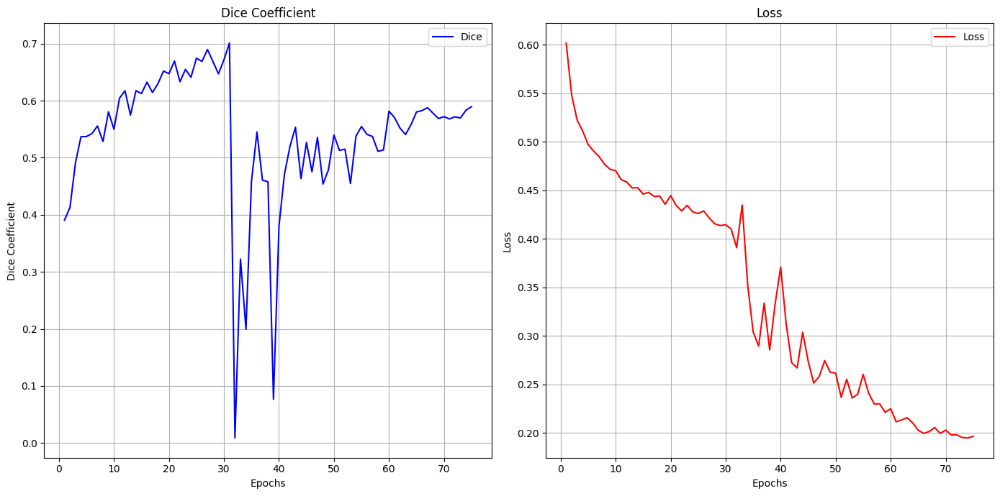

In [32]:
epochs = np.arange(1, len(model_result["dice_tumor"]) + 1)
plt.figure(figsize=(14, 7))
print(f"max dice score: {model_result['dice_tumor'][model_result['best_epoch'] - 1]}")
print(f"loss: {model_result['loss'][model_result['best_epoch'] - 1]}")
print(f"epoch: {model_result['best_epoch']}")

# dice
plt.subplot(1, 2, 1)
plt.plot(epochs, model_result["dice_tumor"], label="Dice", color='blue')
plt.title("Dice Coefficient")
plt.xlabel("Epochs")
plt.ylabel("Dice Coefficient")
plt.legend()
plt.grid()

# loss
plt.subplot(1, 2, 2)
plt.plot(epochs, model_result["loss"], label="Loss", color='red')
plt.title("Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()